In [2]:
import sys, fastai, torch
print(sys.executable)
print(sys.version)
print(fastai.__version__)
print(torch.__version__)

/opt/anaconda3/bin/python3.10
3.10.0 (default, Mar  3 2022, 03:54:28) [Clang 12.0.0 ]
2.8.2
2.7.1


In [3]:
import pandas as pd
df_labels = pd.read_csv("data/image_labels.csv")
df = pd.read_csv("data/bodyfat_dataset.csv")

In [4]:
from fastai.vision.all import *

model_paths = [
    'resnet50',
    'efficientnet_b3',
    'densenet121',
    'resnet34',
    'mobilenetv3_large_100',
    'efficientnet_b0',
    'resnet50d',                     
    'mobilenetv3_large_100',         
    'densenet121',                 
    #'convnext_tiny', unnatural distribution                
    #'convnext_nano', unnatural distribution            
    'regnety_040',                 
    'ghostnet_100',                
    #'vit_base_patch16_224', unnatural distribution              
    #'deit_base_patch16_224', unnatural distribution       
    'maxvit_tiny_rw_224',            
    'efficientformerv2_s0'          
]

learners = []

In [33]:
for model_path in model_paths:
    learn = load_learner("model/" + model_path + "/model.pkl")
    learners.append(learn)


learners

In [5]:

def ensemble_predict(items):
    preds_all = []
    for learn in learners:
        preds = learn.get_preds(dl=learn.dls.test_dl(items))[0]  # get_preds returns tuple, first is preds
        preds_all.append(preds)
    
    # Stack predictions: shape = (num_models, num_items)
    preds_stack = torch.stack(preds_all)
    
    # Average across models (dim=0)
    preds_mean = preds_stack.mean(dim=0)
    return preds_mean

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

model_preds = {}

def set_model_preds(model, valid_df, i, bins=30, figsize=(10, 6)):

    preds = {}
    for idx, row in tqdm(list(valid_df.iterrows()), total=len(valid_df)):
        try: 
            _, _, pred = model.predict(PILImage.create('images/'+row['filename']))
            preds[row['filename']] = (float(pred[0]))
        except Exception as e:
            continue

    model_preds[model_paths[i]] = preds


In [7]:
valid_df = pd.read_csv('data/valid_set.csv')

for idx, model in enumerate(learners):
    print(model_paths[idx])
    set_model_preds(model, valid_df, idx)


resnet50
resnet50


  0%|          | 0/316 [00:00<?, ?it/s]

efficientnet_b3
efficientnet_b3


  0%|          | 0/316 [00:00<?, ?it/s]

densenet121
densenet121


  0%|          | 0/316 [00:00<?, ?it/s]

resnet34
resnet34


  0%|          | 0/316 [00:00<?, ?it/s]

mobilenetv3_large_100
mobilenetv3_large_100


  0%|          | 0/316 [00:00<?, ?it/s]

efficientnet_b0
efficientnet_b0


  0%|          | 0/316 [00:00<?, ?it/s]

resnet50d
resnet50d


  0%|          | 0/316 [00:00<?, ?it/s]

mobilenetv3_large_100
mobilenetv3_large_100


  0%|          | 0/316 [00:00<?, ?it/s]

densenet121
densenet121


  0%|          | 0/316 [00:00<?, ?it/s]

regnety_040
regnety_040


  0%|          | 0/316 [00:00<?, ?it/s]

ghostnet_100
ghostnet_100


  0%|          | 0/316 [00:00<?, ?it/s]

maxvit_tiny_rw_224
maxvit_tiny_rw_224


  0%|          | 0/316 [00:00<?, ?it/s]

efficientformerv2_s0
efficientformerv2_s0


  0%|          | 0/316 [00:00<?, ?it/s]

Model: resnet50
Counts per bin: [11. 10. 11. 10. 11. 10. 11. 10. 10. 11. 10. 11. 10. 11. 10. 10. 11. 10.
 11. 10. 11. 10. 10. 11. 10. 11. 10. 11. 10. 11.]
Bin edges: [  0.          10.43333333  20.86666667  31.3         41.73333333
  52.16666667  62.6         73.03333333  83.46666667  93.9
 104.33333333 114.76666667 125.2        135.63333333 146.06666667
 156.5        166.93333333 177.36666667 187.8        198.23333333
 208.66666667 219.1        229.53333333 239.96666667 250.4
 260.83333333 271.26666667 281.7        292.13333333 302.56666667
 313.        ]
Model: efficientnet_b3
Counts per bin: [11. 10. 11. 10. 11. 10. 11. 10. 10. 11. 10. 11. 10. 11. 10. 10. 11. 10.
 11. 10. 11. 10. 10. 11. 10. 11. 10. 11. 10. 11.]
Bin edges: [  0.          10.43333333  20.86666667  31.3         41.73333333
  52.16666667  62.6         73.03333333  83.46666667  93.9
 104.33333333 114.76666667 125.2        135.63333333 146.06666667
 156.5        166.93333333 177.36666667 187.8        198.23333333
 208.66

AttributeError: 'Figure' object has no attribute 'describe'

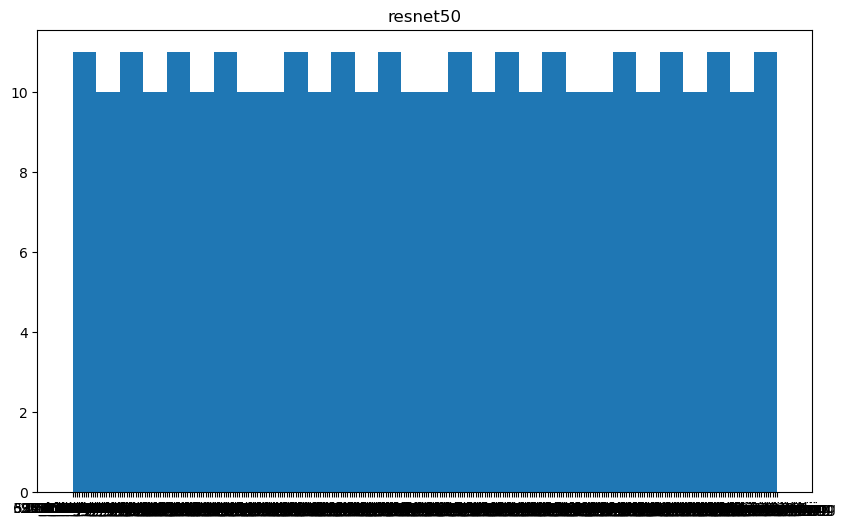

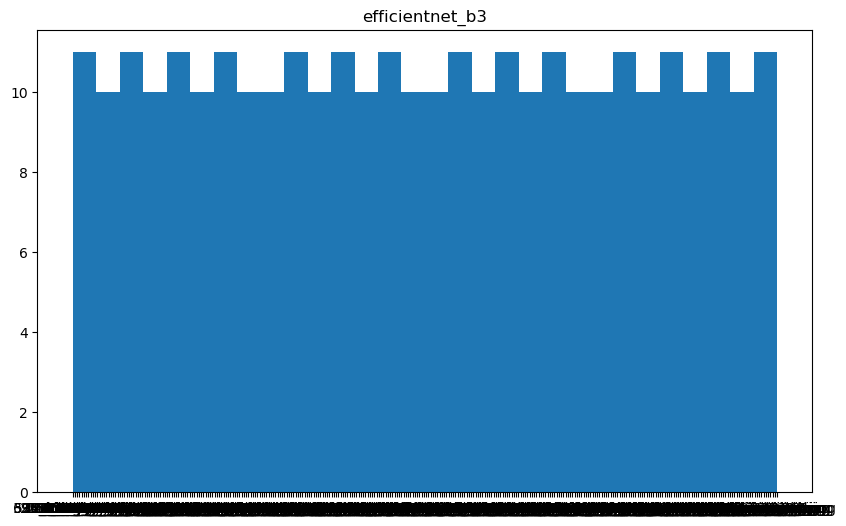

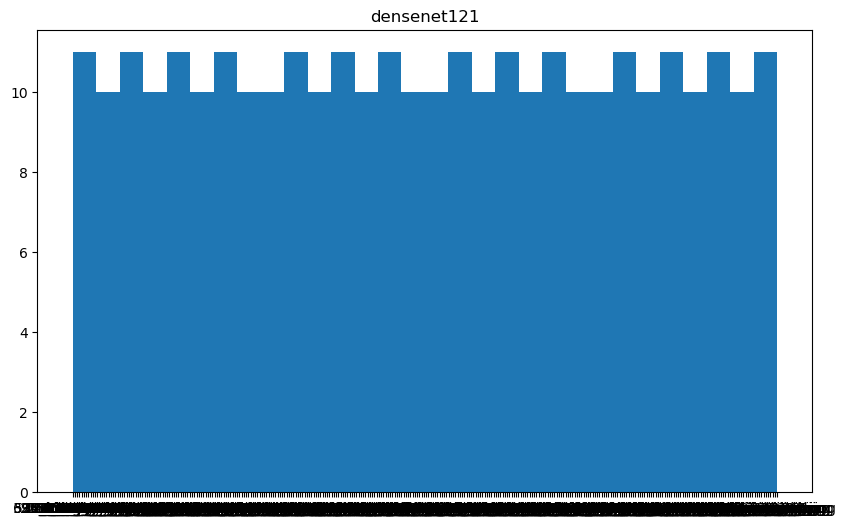

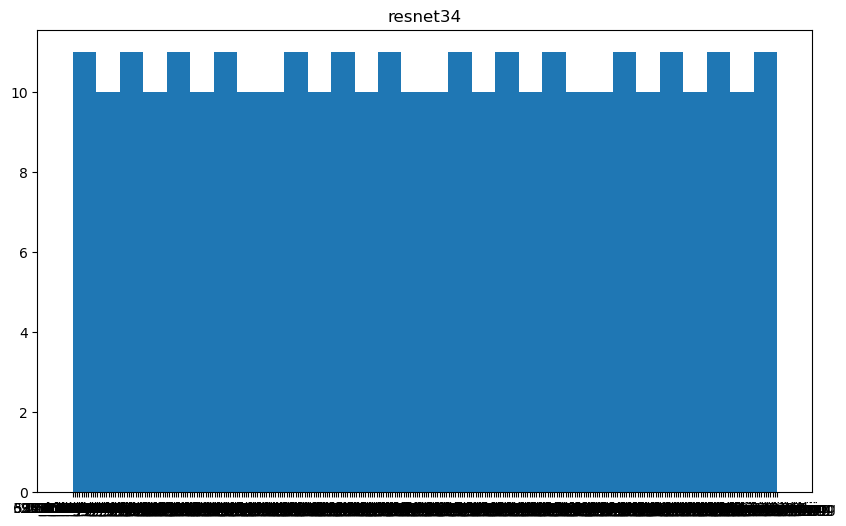

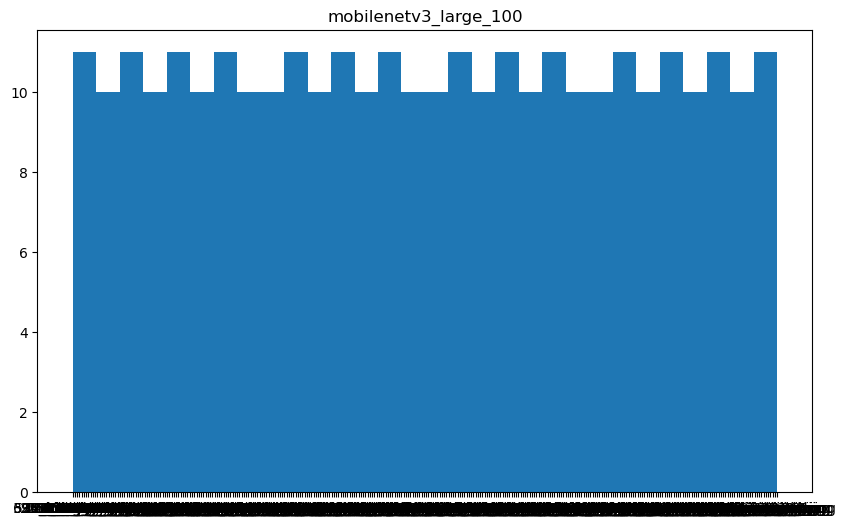

...

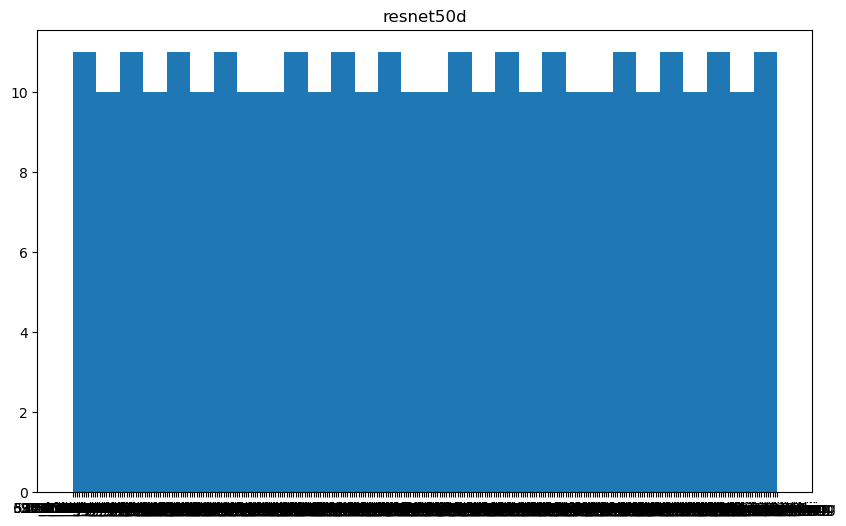

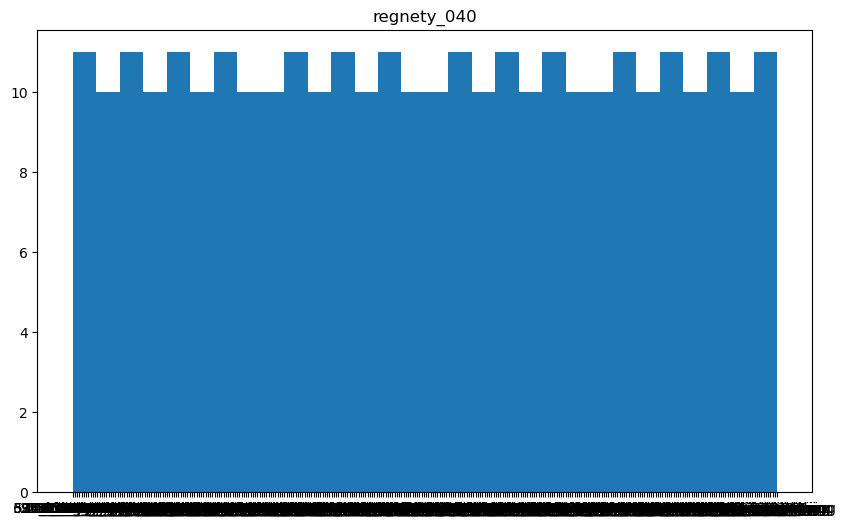

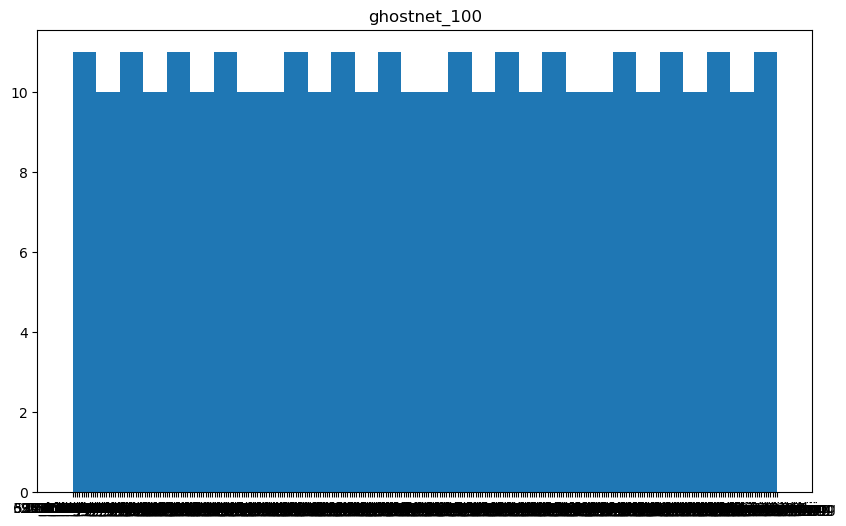

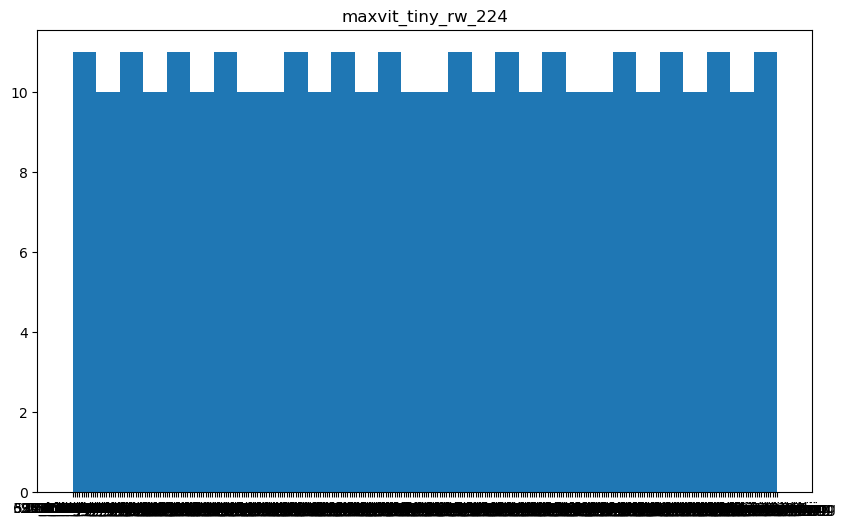

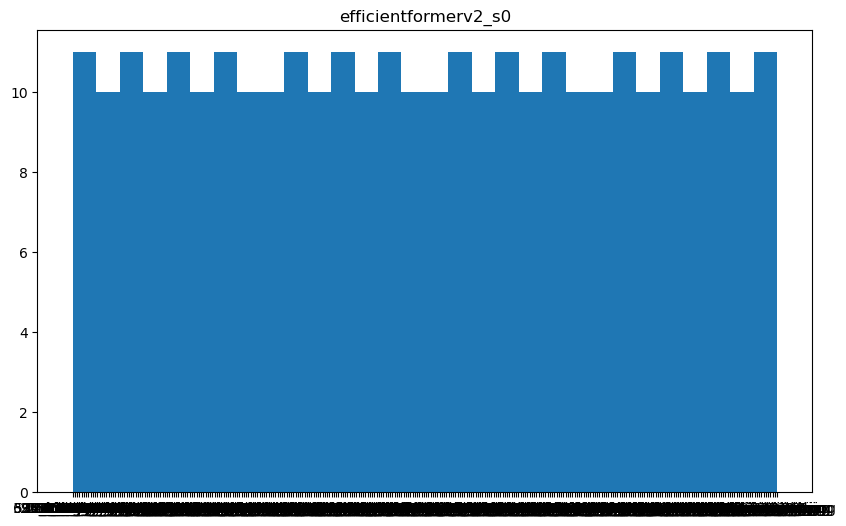

In [8]:
import matplotlib.pyplot as plt

hists = []

for name, preds in model_preds.items():
    fig, ax = plt.subplots(figsize=(10,6))
    counts, bin_edges, patches = ax.hist(preds, bins=30)  # unpack all three returned values
    print(f"Model: {name}")
    print("Counts per bin:", counts)
    print("Bin edges:", bin_edges)
    ax.set_title(name)
    hists.append(fig)

from IPython.display import display

for fig in hists:
    fig
    fig.describe()

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
counts, bin_edges, patches = ax.hist(valid_df['target'].values, bins=30)
print("Counts per bin:", counts)
print("Bin edges:", bin_edges)

In [15]:
del model_preds["convnext_tiny"]
del model_preds["convnext_nano"] 
del model_preds["vit_base_patch16_224"] 
del model_preds["deit_base_patch16_224"]

In [16]:
from sklearn.metrics import mean_absolute_error

def ensemble_and_evaluate_mae(model_preds, valid_df, true_col='target'):

    # Collect all filenames (assume keys are consistent across models)
    filenames = valid_df['filename'].tolist()
    
    # Prepare a dictionary to hold sum of predictions and counts for averaging
    sum_preds = {}
    count_preds = {}
    
    for model_name, preds in model_preds.items():
        for fname, pred in preds.items():
            sum_preds[fname] = sum_preds.get(fname, 0) + pred
            count_preds[fname] = count_preds.get(fname, 0) + 1
    
    # Average predictions for each filename
    ensemble_preds = {fname: sum_preds[fname] / count_preds[fname] for fname in sum_preds}
    
    # Prepare lists to calculate MAE: keep only files with predictions & ground truth
    y_true = []
    y_pred = []
    for fname in filenames:
        if fname in ensemble_preds:
            y_true.append(valid_df.loc[valid_df['filename'] == fname, true_col].values[0])
            y_pred.append(ensemble_preds[fname])
    
    mae = mean_absolute_error(y_true, y_pred)
    
    return ensemble_preds, mae


In [21]:
def calculate_individual_mae(model_preds, valid_df, true_col='target'):
    maes = {}
    # Make a lookup dict for true values for quick access
    true_dict = dict(zip(valid_df['filename'], valid_df[true_col]))

    for model_name, preds_dict in model_preds.items():
        # Get common keys present in both preds and true values
        common_keys = set(preds_dict.keys()) & set(true_dict.keys())
        
        y_true = [true_dict[k] for k in common_keys]
        y_pred = [preds_dict[k] for k in common_keys]
        
        mae = mean_absolute_error(y_true, y_pred)
        maes[model_name] = mae

    return maes


In [22]:
preds, mae = ensemble_and_evaluate_mae(model_preds, valid_df)
print(f"Ensemble MAE: {mae}")

Ensemble MAE: 2.011504797888547


In [28]:
individual_model_maes = calculate_individual_mae(model_preds, valid_df)
individual_model_maes

{'resnet50': 2.2755723066998135,
 'efficientnet_b3': 2.149233563599313,
 'densenet121': 2.4640350873910695,
 'resnet34': 2.259826928460674,
 'mobilenetv3_large_100': 2.087168813997014,
 'efficientnet_b0': 2.180494272207758,
 'resnet50d': 2.262665210043549,
 'regnety_040': 2.57519458060052,
 'ghostnet_100': 2.188973332119595,
 'maxvit_tiny_rw_224': 2.4124233131651667,
 'efficientformerv2_s0': 2.296812517749276}

In [27]:
inv_maes = {name: 1/mae for name, mae in individual_model_maes.items()}
sum_inv_maes = sum(inv_maes.values())
weights = {name: inv_mae / sum_inv_maes for name, inv_mae in inv_maes.items()}

# Sort for better readability
sorted_weights = sorted(weights.items(), key=lambda item: item[1], reverse=True)

# How models will be weighted in the ensemble calculation based of individual MAE performance
sorted_weights

[('mobilenetv3_large_100', 0.09924083115873755),
 ('efficientnet_b3', 0.09637499217291971),
 ('efficientnet_b0', 0.09499330977830908),
 ('ghostnet_100', 0.09462535008094078),
 ('resnet34', 0.09165850944645237),
 ('resnet50d', 0.09154353324134662),
 ('resnet50', 0.09102429628793353),
 ('efficientformerv2_s0', 0.09018253177783798),
 ('maxvit_tiny_rw_224', 0.08586070559809701),
 ('densenet121', 0.08406226393836493),
 ('regnety_040', 0.08043367651906061)]

In [29]:
pred = ensemble_predict('images/1_image_1.jpg')
pred

tensor([[9.7148]])

Processing images:   0%|                                                                                       | 0/1580 [00:00<?, ?it/s]

Processing images:   0%|                                                              | 1/1580 [00:00<20:18,  1.30it/s, last_error=1.41]

Processing images:   0%|                                                              | 2/1580 [00:01<20:21,  1.29it/s, last_error=1.58]

Processing images:   0%|                                                              | 3/1580 [00:02<20:20,  1.29it/s, last_error=1.75]

Processing images:   0%|▏                                                             | 4/1580 [00:03<19:36,  1.34it/s, last_error=0.87]

Processing images:   0%|▏                                                             | 5/1580 [00:03<20:18,  1.29it/s, last_error=0.04]

Processing images:   0%|▏                                                             | 6/1580 [00:04<20:23,  1.29it/s, last_error=1.52]

Processing images:   0%|▎                                                             | 7/1580 [00:05<19:41,  1.33it/s, last_error=0.40]

Processing images:   1%|▎                                                             | 8/1580 [00:06<19:11,  1.36it/s, last_error=0.76]

Processing images:   1%|▎                                                             | 9/1580 [00:06<18:56,  1.38it/s, last_error=0.94]

Processing images:   1%|▍                                                            | 10/1580 [00:07<19:04,  1.37it/s, last_error=0.92]

Processing images:   1%|▍                                                            | 11/1580 [00:08<19:19,  1.35it/s, last_error=0.18]

Processing images:   1%|▍                                                            | 12/1580 [00:10<34:41,  1.33s/it, last_error=0.47]

Processing images:   1%|▌                                                            | 13/1580 [00:11<30:35,  1.17s/it, last_error=0.61]

Processing images:   1%|▌                                                            | 14/1580 [00:12<27:54,  1.07s/it, last_error=0.45]

Processing images:   1%|▌                                                            | 15/1580 [00:13<26:04,  1.00it/s, last_error=0.80]

Processing images:   1%|▌                                                            | 16/1580 [00:14<24:01,  1.09it/s, last_error=3.20]

Processing images:   1%|▋                                                            | 17/1580 [00:14<22:24,  1.16it/s, last_error=0.84]

Skipping 8_image_1.jpg due to error: [Errno 2] No such file or directory: '/Users/kalanjarvis-loewen/Desktop/Coding/learning/ml/LeanAI/core/images/8_image_1.jpg'


Processing images:   1%|▋                                                            | 19/1580 [00:15<16:19,  1.59it/s, last_error=0.70]

Processing images:   1%|▊                                                            | 20/1580 [00:16<16:58,  1.53it/s, last_error=0.24]

Processing images:   1%|▊                                                            | 21/1580 [00:16<17:22,  1.50it/s, last_error=0.75]

Processing images:   1%|▊                                                            | 22/1580 [00:17<17:34,  1.48it/s, last_error=0.89]

Processing images:   1%|▉                                                            | 23/1580 [00:18<18:27,  1.41it/s, last_error=0.58]

Processing images:   2%|▉                                                            | 24/1580 [00:19<18:16,  1.42it/s, last_error=0.90]

Processing images:   2%|▉                                                            | 25/1580 [00:19<18:14,  1.42it/s, last_error=1.42]

Processing images:   2%|█                                                            | 26/1580 [00:20<18:13,  1.42it/s, last_error=2.05]

Processing images:   2%|█                                                            | 27/1580 [00:21<18:22,  1.41it/s, last_error=1.06]

Processing images:   2%|█                                                            | 28/1580 [00:22<23:18,  1.11it/s, last_error=1.71]

Processing images:   2%|█                                                            | 29/1580 [00:23<21:41,  1.19it/s, last_error=1.54]

Processing images:   2%|█▏                                                           | 30/1580 [00:24<20:45,  1.24it/s, last_error=2.98]

Processing images:   2%|█▏                                                           | 31/1580 [00:24<20:35,  1.25it/s, last_error=0.51]

Processing images:   2%|█▏                                                           | 32/1580 [00:25<19:50,  1.30it/s, last_error=0.76]

Processing images:   2%|█▎                                                           | 33/1580 [00:26<19:43,  1.31it/s, last_error=0.43]

Processing images:   2%|█▎                                                           | 34/1580 [00:27<19:16,  1.34it/s, last_error=0.45]

Processing images:   2%|█▎                                                           | 35/1580 [00:27<19:01,  1.35it/s, last_error=0.38]

Processing images:   2%|█▍                                                           | 36/1580 [00:28<20:42,  1.24it/s, last_error=1.85]

Processing images:   2%|█▍                                                           | 37/1580 [00:29<20:09,  1.28it/s, last_error=0.73]

Processing images:   2%|█▍                                                           | 38/1580 [00:30<19:34,  1.31it/s, last_error=0.48]

Processing images:   2%|█▌                                                           | 39/1580 [00:30<19:04,  1.35it/s, last_error=0.82]

Processing images:   3%|█▌                                                           | 40/1580 [00:31<19:10,  1.34it/s, last_error=0.14]

Processing images:   3%|█▌                                                           | 41/1580 [00:32<19:12,  1.34it/s, last_error=0.08]

Processing images:   3%|█▌                                                           | 42/1580 [00:33<19:01,  1.35it/s, last_error=1.33]

Processing images:   3%|█▋                                                           | 43/1580 [00:33<18:40,  1.37it/s, last_error=2.33]

Processing images:   3%|█▋                                                           | 44/1580 [00:34<18:29,  1.38it/s, last_error=3.19]

Processing images:   3%|█▋                                                           | 45/1580 [00:35<18:28,  1.38it/s, last_error=0.56]

Processing images:   3%|█▊                                                           | 46/1580 [00:35<18:30,  1.38it/s, last_error=0.17]

Processing images:   3%|█▊                                                           | 47/1580 [00:36<18:26,  1.38it/s, last_error=0.62]

Processing images:   3%|█▊                                                           | 48/1580 [00:37<18:34,  1.37it/s, last_error=1.28]

Processing images:   3%|█▉                                                           | 49/1580 [00:38<18:26,  1.38it/s, last_error=0.02]

Processing images:   3%|█▉                                                           | 50/1580 [00:38<18:16,  1.40it/s, last_error=5.26]

Processing images:   3%|█▉                                                           | 51/1580 [00:39<18:13,  1.40it/s, last_error=1.07]

Processing images:   3%|██                                                           | 52/1580 [00:40<18:06,  1.41it/s, last_error=1.03]

Processing images:   3%|██                                                           | 53/1580 [00:40<18:11,  1.40it/s, last_error=0.43]

Processing images:   3%|██                                                           | 54/1580 [00:41<18:08,  1.40it/s, last_error=3.62]

Processing images:   3%|██                                                           | 55/1580 [00:42<17:59,  1.41it/s, last_error=0.75]

Processing images:   4%|██▏                                                          | 56/1580 [00:43<18:15,  1.39it/s, last_error=0.66]

Processing images:   4%|██▏                                                          | 57/1580 [00:43<18:13,  1.39it/s, last_error=2.73]

Processing images:   4%|██▏                                                          | 58/1580 [00:44<18:25,  1.38it/s, last_error=2.22]

Processing images:   4%|██▎                                                          | 59/1580 [00:45<20:02,  1.27it/s, last_error=0.94]

Processing images:   4%|██▎                                                          | 60/1580 [00:46<19:32,  1.30it/s, last_error=2.85]

Processing images:   4%|██▎                                                          | 61/1580 [00:46<19:02,  1.33it/s, last_error=1.16]

Processing images:   4%|██▍                                                          | 62/1580 [00:47<18:41,  1.35it/s, last_error=2.58]

Processing images:   4%|██▍                                                          | 63/1580 [00:48<18:25,  1.37it/s, last_error=1.28]

Processing images:   4%|██▍                                                          | 64/1580 [00:49<18:10,  1.39it/s, last_error=0.35]

Processing images:   4%|██▌                                                          | 65/1580 [00:49<18:08,  1.39it/s, last_error=0.78]

Processing images:   4%|██▌                                                          | 66/1580 [00:50<18:01,  1.40it/s, last_error=1.41]

Processing images:   4%|██▌                                                          | 67/1580 [00:51<17:58,  1.40it/s, last_error=0.54]

Processing images:   4%|██▋                                                          | 68/1580 [00:51<17:53,  1.41it/s, last_error=0.51]

Processing images:   4%|██▋                                                          | 69/1580 [00:52<17:54,  1.41it/s, last_error=1.18]

Processing images:   4%|██▋                                                          | 70/1580 [00:53<18:40,  1.35it/s, last_error=2.64]

Processing images:   4%|██▋                                                          | 71/1580 [00:54<19:04,  1.32it/s, last_error=3.27]

Processing images:   5%|██▊                                                          | 72/1580 [00:54<18:46,  1.34it/s, last_error=0.87]

Processing images:   5%|██▊                                                          | 73/1580 [00:55<19:26,  1.29it/s, last_error=0.51]

Processing images:   5%|██▊                                                          | 74/1580 [00:56<19:58,  1.26it/s, last_error=1.55]

Processing images:   5%|██▉                                                          | 75/1580 [00:57<19:38,  1.28it/s, last_error=0.44]

Processing images:   5%|██▉                                                          | 76/1580 [00:58<19:07,  1.31it/s, last_error=1.12]

Processing images:   5%|██▉                                                          | 77/1580 [00:58<18:43,  1.34it/s, last_error=1.00]

Processing images:   5%|███                                                          | 78/1580 [00:59<18:27,  1.36it/s, last_error=1.37]

Processing images:   5%|███                                                          | 79/1580 [01:00<18:31,  1.35it/s, last_error=0.22]

Processing images:   5%|███                                                          | 80/1580 [01:00<18:24,  1.36it/s, last_error=0.24]

Processing images:   5%|███▏                                                         | 81/1580 [01:01<18:29,  1.35it/s, last_error=0.55]

Processing images:   5%|███▏                                                         | 82/1580 [01:02<18:16,  1.37it/s, last_error=0.31]

Processing images:   5%|███▏                                                         | 83/1580 [01:03<18:08,  1.38it/s, last_error=1.48]

Processing images:   5%|███▏                                                         | 84/1580 [01:03<18:12,  1.37it/s, last_error=0.00]

Processing images:   5%|███▎                                                         | 85/1580 [01:04<18:30,  1.35it/s, last_error=0.35]

Processing images:   5%|███▎                                                         | 86/1580 [01:05<18:54,  1.32it/s, last_error=0.47]

Processing images:   6%|███▎                                                         | 87/1580 [01:06<19:25,  1.28it/s, last_error=1.92]

Processing images:   6%|███▍                                                         | 88/1580 [01:07<18:59,  1.31it/s, last_error=0.94]

Processing images:   6%|███▍                                                         | 89/1580 [01:07<18:41,  1.33it/s, last_error=1.14]

Processing images:   6%|███▍                                                         | 90/1580 [01:08<18:27,  1.35it/s, last_error=0.45]

Processing images:   6%|███▌                                                         | 91/1580 [01:09<18:20,  1.35it/s, last_error=0.68]

Processing images:   6%|███▌                                                         | 92/1580 [01:10<19:35,  1.27it/s, last_error=1.69]

Processing images:   6%|███▌                                                         | 93/1580 [01:10<19:56,  1.24it/s, last_error=1.36]

Processing images:   6%|███▋                                                         | 94/1580 [01:11<19:49,  1.25it/s, last_error=2.00]

Processing images:   6%|███▋                                                         | 95/1580 [01:12<19:26,  1.27it/s, last_error=1.29]

Processing images:   6%|███▋                                                         | 96/1580 [01:13<18:58,  1.30it/s, last_error=0.01]

Processing images:   6%|███▋                                                         | 97/1580 [01:14<20:07,  1.23it/s, last_error=2.11]

Processing images:   6%|███▊                                                         | 98/1580 [01:14<19:56,  1.24it/s, last_error=0.58]

Processing images:   6%|███▊                                                         | 99/1580 [01:15<20:57,  1.18it/s, last_error=0.19]

Processing images:   6%|███▊                                                        | 100/1580 [01:16<20:06,  1.23it/s, last_error=2.12]

Processing images:   6%|███▊                                                        | 101/1580 [01:17<19:26,  1.27it/s, last_error=0.43]

Processing images:   6%|███▊                                                        | 102/1580 [01:18<18:54,  1.30it/s, last_error=2.09]

Processing images:   7%|███▉                                                        | 103/1580 [01:18<18:56,  1.30it/s, last_error=0.45]

Processing images:   7%|███▉                                                        | 104/1580 [01:19<18:37,  1.32it/s, last_error=0.36]

Processing images:   7%|███▉                                                        | 105/1580 [01:20<18:34,  1.32it/s, last_error=1.48]

Processing images:   7%|████                                                        | 106/1580 [01:21<18:37,  1.32it/s, last_error=1.33]

Processing images:   7%|████                                                        | 107/1580 [01:21<18:22,  1.34it/s, last_error=0.65]

Processing images:   7%|████                                                        | 108/1580 [01:22<18:18,  1.34it/s, last_error=0.75]

Processing images:   7%|████▏                                                       | 109/1580 [01:23<18:13,  1.35it/s, last_error=0.36]

Processing images:   7%|████▏                                                       | 110/1580 [01:24<18:09,  1.35it/s, last_error=1.33]

Processing images:   7%|████▏                                                       | 111/1580 [01:24<18:07,  1.35it/s, last_error=0.05]

Processing images:   7%|████▎                                                       | 112/1580 [01:25<18:01,  1.36it/s, last_error=1.00]

Processing images:   7%|████▎                                                       | 113/1580 [01:26<17:58,  1.36it/s, last_error=0.34]

Processing images:   7%|████▎                                                       | 114/1580 [01:26<17:53,  1.37it/s, last_error=2.80]

Processing images:   7%|████▎                                                       | 115/1580 [01:27<17:53,  1.36it/s, last_error=0.60]

Processing images:   7%|████▍                                                       | 116/1580 [01:28<18:02,  1.35it/s, last_error=0.16]

Processing images:   7%|████▍                                                       | 117/1580 [01:29<17:56,  1.36it/s, last_error=2.39]

Processing images:   7%|████▍                                                       | 118/1580 [01:29<17:50,  1.37it/s, last_error=1.78]

Processing images:   8%|████▌                                                       | 119/1580 [01:30<18:50,  1.29it/s, last_error=0.79]

Processing images:   8%|████▌                                                       | 120/1580 [01:31<19:31,  1.25it/s, last_error=0.89]

Processing images:   8%|████▌                                                       | 121/1580 [01:32<19:09,  1.27it/s, last_error=0.28]

Processing images:   8%|████▋                                                       | 122/1580 [01:33<18:44,  1.30it/s, last_error=2.16]

Processing images:   8%|████▋                                                       | 123/1580 [01:33<18:25,  1.32it/s, last_error=0.98]

Processing images:   8%|████▋                                                       | 124/1580 [01:34<18:11,  1.33it/s, last_error=8.93]

Processing images:   8%|████▋                                                       | 125/1580 [01:35<18:19,  1.32it/s, last_error=8.77]

Processing images:   8%|████▊                                                       | 126/1580 [01:36<18:06,  1.34it/s, last_error=0.08]

Processing images:   8%|████▊                                                       | 127/1580 [01:36<17:59,  1.35it/s, last_error=0.38]

Processing images:   8%|████▊                                                       | 128/1580 [01:37<17:46,  1.36it/s, last_error=0.63]

Processing images:   8%|████▉                                                       | 129/1580 [01:38<17:59,  1.34it/s, last_error=0.33]

Processing images:   8%|████▉                                                       | 130/1580 [01:39<18:14,  1.32it/s, last_error=1.24]

Processing images:   8%|████▉                                                       | 131/1580 [01:39<18:13,  1.33it/s, last_error=1.64]

Processing images:   8%|█████                                                       | 132/1580 [01:40<18:00,  1.34it/s, last_error=0.58]

Processing images:   8%|█████                                                       | 133/1580 [01:41<17:56,  1.34it/s, last_error=0.44]

Processing images:   8%|█████                                                       | 134/1580 [01:42<17:50,  1.35it/s, last_error=0.59]

Processing images:   9%|█████▏                                                      | 135/1580 [01:43<20:02,  1.20it/s, last_error=1.73]

Processing images:   9%|█████▏                                                      | 136/1580 [01:43<19:21,  1.24it/s, last_error=2.03]

Processing images:   9%|█████▏                                                      | 137/1580 [01:44<18:54,  1.27it/s, last_error=0.37]

Processing images:   9%|█████▏                                                      | 138/1580 [01:45<18:30,  1.30it/s, last_error=0.03]

Processing images:   9%|█████▎                                                      | 139/1580 [01:46<18:38,  1.29it/s, last_error=1.64]

Processing images:   9%|█████▎                                                      | 140/1580 [01:46<18:24,  1.30it/s, last_error=0.34]

Processing images:   9%|█████▎                                                      | 141/1580 [01:47<18:25,  1.30it/s, last_error=0.53]

Processing images:   9%|█████▍                                                      | 142/1580 [01:48<18:16,  1.31it/s, last_error=1.64]

Processing images:   9%|█████▍                                                      | 143/1580 [01:49<18:48,  1.27it/s, last_error=2.04]

Processing images:   9%|█████▍                                                      | 144/1580 [01:49<18:26,  1.30it/s, last_error=0.95]

Processing images:   9%|█████▌                                                      | 145/1580 [01:50<19:02,  1.26it/s, last_error=0.44]

Processing images:   9%|█████▌                                                      | 146/1580 [01:51<19:03,  1.25it/s, last_error=0.67]

Processing images:   9%|█████▌                                                      | 147/1580 [01:52<18:38,  1.28it/s, last_error=1.13]

Processing images:   9%|█████▌                                                      | 148/1580 [01:53<18:30,  1.29it/s, last_error=0.52]

Processing images:   9%|█████▋                                                      | 149/1580 [01:53<18:13,  1.31it/s, last_error=0.39]

Processing images:   9%|█████▋                                                      | 150/1580 [01:54<19:04,  1.25it/s, last_error=1.01]

Processing images:  10%|█████▋                                                      | 151/1580 [01:55<18:33,  1.28it/s, last_error=2.28]

Processing images:  10%|█████▊                                                      | 152/1580 [01:56<18:14,  1.31it/s, last_error=0.25]

Processing images:  10%|█████▊                                                      | 153/1580 [01:56<18:06,  1.31it/s, last_error=0.74]

Processing images:  10%|█████▊                                                      | 154/1580 [01:57<17:55,  1.33it/s, last_error=2.95]

Processing images:  10%|█████▉                                                      | 155/1580 [01:58<17:59,  1.32it/s, last_error=0.36]

Processing images:  10%|█████▉                                                      | 156/1580 [01:59<17:57,  1.32it/s, last_error=0.50]

Processing images:  10%|█████▉                                                      | 157/1580 [01:59<17:49,  1.33it/s, last_error=0.48]

Processing images:  10%|██████                                                      | 158/1580 [02:00<17:42,  1.34it/s, last_error=0.22]

Processing images:  10%|██████                                                      | 159/1580 [02:01<17:37,  1.34it/s, last_error=1.00]

Processing images:  10%|██████                                                      | 160/1580 [02:02<17:39,  1.34it/s, last_error=0.47]

Processing images:  10%|██████                                                      | 161/1580 [02:02<17:37,  1.34it/s, last_error=0.30]

Processing images:  10%|██████▏                                                     | 162/1580 [02:03<17:36,  1.34it/s, last_error=1.01]

Processing images:  10%|██████▏                                                     | 163/1580 [02:04<17:29,  1.35it/s, last_error=0.33]

Processing images:  10%|██████▏                                                     | 164/1580 [02:05<17:27,  1.35it/s, last_error=1.27]

Processing images:  10%|██████▎                                                     | 165/1580 [02:05<17:22,  1.36it/s, last_error=0.13]

Processing images:  11%|██████▎                                                     | 166/1580 [02:06<18:10,  1.30it/s, last_error=1.17]

Processing images:  11%|██████▎                                                     | 167/1580 [02:07<17:49,  1.32it/s, last_error=0.63]

Processing images:  11%|██████▍                                                     | 168/1580 [02:08<17:42,  1.33it/s, last_error=0.40]

Processing images:  11%|██████▍                                                     | 169/1580 [02:08<17:58,  1.31it/s, last_error=0.56]

Processing images:  11%|██████▍                                                     | 170/1580 [02:09<17:45,  1.32it/s, last_error=0.52]

Processing images:  11%|██████▍                                                     | 171/1580 [02:10<18:46,  1.25it/s, last_error=0.78]

Processing images:  11%|██████▌                                                     | 172/1580 [02:11<18:42,  1.25it/s, last_error=0.15]

Processing images:  11%|██████▌                                                     | 173/1580 [02:12<18:12,  1.29it/s, last_error=0.59]

Processing images:  11%|██████▌                                                     | 174/1580 [02:12<17:54,  1.31it/s, last_error=2.11]

Processing images:  11%|██████▋                                                     | 175/1580 [02:13<17:53,  1.31it/s, last_error=0.23]

Processing images:  11%|██████▋                                                     | 176/1580 [02:14<17:35,  1.33it/s, last_error=0.22]

Processing images:  11%|██████▋                                                     | 177/1580 [02:15<17:31,  1.33it/s, last_error=0.20]

Processing images:  11%|██████▊                                                     | 178/1580 [02:15<17:27,  1.34it/s, last_error=0.54]

Processing images:  11%|██████▊                                                     | 179/1580 [02:16<17:40,  1.32it/s, last_error=0.98]

Processing images:  11%|██████▊                                                     | 180/1580 [02:17<17:49,  1.31it/s, last_error=0.33]

Processing images:  11%|██████▊                                                     | 181/1580 [02:18<18:07,  1.29it/s, last_error=0.80]

Processing images:  12%|██████▉                                                     | 182/1580 [02:19<20:17,  1.15it/s, last_error=0.93]

Processing images:  12%|██████▉                                                     | 183/1580 [02:20<19:46,  1.18it/s, last_error=0.46]

Processing images:  12%|██████▉                                                     | 184/1580 [02:20<18:54,  1.23it/s, last_error=1.00]

Processing images:  12%|███████                                                     | 185/1580 [02:21<18:22,  1.27it/s, last_error=0.33]

Processing images:  12%|███████                                                     | 186/1580 [02:23<25:25,  1.09s/it, last_error=0.97]

Processing images:  12%|███████                                                     | 187/1580 [02:24<22:59,  1.01it/s, last_error=0.37]

Processing images:  12%|███████▏                                                    | 188/1580 [02:24<21:46,  1.07it/s, last_error=1.59]

Processing images:  12%|███████▏                                                    | 189/1580 [02:25<20:50,  1.11it/s, last_error=0.73]

Processing images:  12%|███████▏                                                    | 190/1580 [02:26<20:32,  1.13it/s, last_error=0.38]

Processing images:  12%|███████▎                                                    | 191/1580 [02:27<20:10,  1.15it/s, last_error=1.62]

Processing images:  12%|███████▎                                                    | 192/1580 [02:28<19:27,  1.19it/s, last_error=1.05]

Processing images:  12%|███████▎                                                    | 193/1580 [02:28<19:05,  1.21it/s, last_error=0.52]

Processing images:  12%|███████▎                                                    | 194/1580 [02:29<18:25,  1.25it/s, last_error=1.60]

Processing images:  12%|███████▍                                                    | 195/1580 [02:30<18:04,  1.28it/s, last_error=0.70]

Processing images:  12%|███████▍                                                    | 196/1580 [02:31<17:43,  1.30it/s, last_error=1.18]

Processing images:  12%|███████▍                                                    | 197/1580 [02:31<17:35,  1.31it/s, last_error=0.03]

Processing images:  13%|███████▌                                                    | 198/1580 [02:32<17:30,  1.32it/s, last_error=0.51]

Processing images:  13%|███████▌                                                    | 199/1580 [02:33<17:19,  1.33it/s, last_error=0.41]

Processing images:  13%|███████▌                                                    | 200/1580 [02:34<17:11,  1.34it/s, last_error=0.87]

Processing images:  13%|███████▋                                                    | 201/1580 [02:34<17:04,  1.35it/s, last_error=1.23]

Processing images:  13%|███████▋                                                    | 202/1580 [02:35<16:58,  1.35it/s, last_error=2.44]

Processing images:  13%|███████▋                                                    | 203/1580 [02:36<16:59,  1.35it/s, last_error=0.03]

Processing images:  13%|███████▋                                                    | 204/1580 [02:37<17:00,  1.35it/s, last_error=1.20]

Processing images:  13%|███████▊                                                    | 205/1580 [02:37<17:44,  1.29it/s, last_error=0.88]

Processing images:  13%|███████▊                                                    | 206/1580 [02:38<17:24,  1.32it/s, last_error=0.52]

Processing images:  13%|███████▊                                                    | 207/1580 [02:39<17:11,  1.33it/s, last_error=0.83]

Processing images:  13%|███████▉                                                    | 208/1580 [02:40<17:12,  1.33it/s, last_error=0.98]

Processing images:  13%|███████▉                                                    | 209/1580 [02:41<18:11,  1.26it/s, last_error=0.27]

Processing images:  13%|███████▉                                                    | 210/1580 [02:41<17:49,  1.28it/s, last_error=0.44]

Processing images:  13%|████████                                                    | 211/1580 [02:42<18:13,  1.25it/s, last_error=0.99]

Processing images:  13%|████████                                                    | 212/1580 [02:43<18:30,  1.23it/s, last_error=0.38]

Processing images:  13%|████████                                                    | 213/1580 [02:44<18:21,  1.24it/s, last_error=0.99]

Processing images:  14%|████████▏                                                   | 214/1580 [02:45<18:03,  1.26it/s, last_error=0.01]

Processing images:  14%|████████▏                                                   | 215/1580 [02:45<17:53,  1.27it/s, last_error=1.38]

Processing images:  14%|████████▏                                                   | 216/1580 [02:46<17:55,  1.27it/s, last_error=0.61]

Processing images:  14%|████████▏                                                   | 217/1580 [02:47<18:49,  1.21it/s, last_error=2.70]

Processing images:  14%|████████▎                                                   | 218/1580 [02:48<18:10,  1.25it/s, last_error=0.63]

Processing images:  14%|████████▎                                                   | 219/1580 [02:48<17:43,  1.28it/s, last_error=0.72]

Processing images:  14%|████████▎                                                   | 220/1580 [02:50<19:35,  1.16it/s, last_error=0.60]

Processing images:  14%|████████▍                                                   | 221/1580 [02:50<18:46,  1.21it/s, last_error=4.36]

Processing images:  14%|████████▍                                                   | 222/1580 [02:51<18:19,  1.24it/s, last_error=1.77]

Processing images:  14%|████████▍                                                   | 223/1580 [02:52<18:18,  1.24it/s, last_error=2.83]

Processing images:  14%|████████▌                                                   | 224/1580 [02:53<18:26,  1.23it/s, last_error=0.87]

Processing images:  14%|████████▌                                                   | 225/1580 [02:53<18:17,  1.23it/s, last_error=0.41]

Processing images:  14%|████████▌                                                   | 226/1580 [02:54<17:53,  1.26it/s, last_error=1.64]

Processing images:  14%|████████▌                                                   | 227/1580 [02:55<17:51,  1.26it/s, last_error=0.70]

Processing images:  14%|████████▋                                                   | 228/1580 [02:56<17:28,  1.29it/s, last_error=0.98]

Processing images:  14%|████████▋                                                   | 229/1580 [02:57<17:18,  1.30it/s, last_error=1.16]

Processing images:  15%|████████▋                                                   | 230/1580 [02:57<17:42,  1.27it/s, last_error=0.03]

Processing images:  15%|████████▊                                                   | 231/1580 [02:58<17:20,  1.30it/s, last_error=0.55]

Processing images:  15%|████████▊                                                   | 232/1580 [02:59<17:01,  1.32it/s, last_error=3.04]

Processing images:  15%|████████▊                                                   | 233/1580 [03:00<18:14,  1.23it/s, last_error=1.65]

Processing images:  15%|████████▉                                                   | 234/1580 [03:00<17:44,  1.26it/s, last_error=0.21]

Processing images:  15%|████████▉                                                   | 235/1580 [03:01<17:20,  1.29it/s, last_error=0.15]

Processing images:  15%|████████▉                                                   | 236/1580 [03:02<17:15,  1.30it/s, last_error=0.37]

Processing images:  15%|█████████                                                   | 237/1580 [03:03<17:23,  1.29it/s, last_error=0.17]

Processing images:  15%|█████████                                                   | 238/1580 [03:04<17:04,  1.31it/s, last_error=0.36]

Processing images:  15%|█████████                                                   | 239/1580 [03:04<16:50,  1.33it/s, last_error=0.25]

Processing images:  15%|█████████                                                   | 240/1580 [03:05<16:42,  1.34it/s, last_error=0.00]

Processing images:  15%|█████████▏                                                  | 241/1580 [03:06<17:00,  1.31it/s, last_error=4.78]

Processing images:  15%|█████████▏                                                  | 242/1580 [03:07<17:16,  1.29it/s, last_error=0.26]

Processing images:  15%|█████████▏                                                  | 243/1580 [03:07<16:59,  1.31it/s, last_error=0.93]

Processing images:  15%|█████████▎                                                  | 244/1580 [03:08<16:51,  1.32it/s, last_error=0.29]

Processing images:  16%|█████████▎                                                  | 245/1580 [03:09<16:51,  1.32it/s, last_error=1.28]

Processing images:  16%|█████████▎                                                  | 246/1580 [03:10<16:46,  1.33it/s, last_error=1.94]

Processing images:  16%|█████████▍                                                  | 247/1580 [03:10<16:49,  1.32it/s, last_error=1.40]

Processing images:  16%|█████████▍                                                  | 248/1580 [03:11<16:46,  1.32it/s, last_error=1.71]

Processing images:  16%|█████████▍                                                  | 249/1580 [03:12<17:03,  1.30it/s, last_error=0.75]

Processing images:  16%|█████████▍                                                  | 250/1580 [03:13<17:26,  1.27it/s, last_error=0.06]

Processing images:  16%|█████████▌                                                  | 251/1580 [03:13<17:12,  1.29it/s, last_error=0.29]

Processing images:  16%|█████████▌                                                  | 252/1580 [03:14<16:55,  1.31it/s, last_error=4.32]

Processing images:  16%|█████████▌                                                  | 253/1580 [03:15<16:41,  1.33it/s, last_error=0.44]

Processing images:  16%|█████████▋                                                  | 254/1580 [03:16<16:40,  1.32it/s, last_error=1.03]

Processing images:  16%|█████████▋                                                  | 255/1580 [03:16<17:01,  1.30it/s, last_error=2.22]

Processing images:  16%|█████████▋                                                  | 256/1580 [03:17<17:45,  1.24it/s, last_error=0.41]

Processing images:  16%|█████████▊                                                  | 257/1580 [03:18<17:52,  1.23it/s, last_error=0.68]

Processing images:  16%|█████████▊                                                  | 258/1580 [03:19<18:49,  1.17it/s, last_error=1.83]

Processing images:  16%|█████████▊                                                  | 259/1580 [03:20<18:07,  1.21it/s, last_error=0.76]

Processing images:  16%|█████████▊                                                  | 260/1580 [03:21<17:33,  1.25it/s, last_error=1.22]

Processing images:  17%|█████████▉                                                  | 261/1580 [03:22<20:52,  1.05it/s, last_error=0.41]

Processing images:  17%|█████████▊                                                 | 262/1580 [03:23<19:45,  1.11it/s, last_error=12.77]

Processing images:  17%|█████████▉                                                  | 263/1580 [03:23<18:52,  1.16it/s, last_error=0.31]

Processing images:  17%|██████████                                                  | 264/1580 [03:24<18:17,  1.20it/s, last_error=0.29]

Processing images:  17%|██████████                                                  | 265/1580 [03:25<17:45,  1.23it/s, last_error=0.18]

Processing images:  17%|██████████                                                  | 266/1580 [03:26<17:18,  1.26it/s, last_error=0.02]

Processing images:  17%|██████████▏                                                 | 267/1580 [03:27<17:08,  1.28it/s, last_error=2.07]

Processing images:  17%|██████████▏                                                 | 268/1580 [03:27<16:53,  1.29it/s, last_error=1.79]

Processing images:  17%|██████████▏                                                 | 269/1580 [03:28<16:43,  1.31it/s, last_error=1.83]

Processing images:  17%|██████████▎                                                 | 270/1580 [03:29<16:31,  1.32it/s, last_error=3.05]

Processing images:  17%|██████████▎                                                 | 271/1580 [03:30<16:25,  1.33it/s, last_error=2.43]

Processing images:  17%|██████████▎                                                 | 272/1580 [03:30<16:18,  1.34it/s, last_error=2.71]

Processing images:  17%|██████████▎                                                 | 273/1580 [03:31<16:20,  1.33it/s, last_error=2.67]

Processing images:  17%|██████████▍                                                 | 274/1580 [03:32<16:29,  1.32it/s, last_error=1.45]

Processing images:  17%|██████████▍                                                 | 275/1580 [03:33<17:03,  1.27it/s, last_error=1.06]

Processing images:  17%|██████████▍                                                 | 276/1580 [03:33<17:18,  1.26it/s, last_error=1.01]

Processing images:  18%|██████████▌                                                 | 277/1580 [03:34<16:56,  1.28it/s, last_error=7.59]

Processing images:  18%|██████████▌                                                 | 278/1580 [03:35<16:38,  1.30it/s, last_error=6.54]

Processing images:  18%|██████████▌                                                 | 279/1580 [03:36<16:29,  1.31it/s, last_error=6.04]

Processing images:  18%|██████████▋                                                 | 280/1580 [03:37<17:53,  1.21it/s, last_error=0.07]

Processing images:  18%|██████████▋                                                 | 281/1580 [03:37<17:27,  1.24it/s, last_error=1.00]

Processing images:  18%|██████████▋                                                 | 282/1580 [03:38<17:05,  1.27it/s, last_error=1.40]

Processing images:  18%|██████████▋                                                 | 283/1580 [03:39<16:52,  1.28it/s, last_error=1.62]

Processing images:  18%|██████████▊                                                 | 284/1580 [03:40<17:02,  1.27it/s, last_error=1.06]

Processing images:  18%|██████████▊                                                 | 285/1580 [03:41<17:07,  1.26it/s, last_error=1.77]

Processing images:  18%|██████████▊                                                 | 286/1580 [03:41<17:04,  1.26it/s, last_error=1.36]

Processing images:  18%|██████████▉                                                 | 287/1580 [03:42<16:43,  1.29it/s, last_error=1.39]

Processing images:  18%|██████████▉                                                 | 288/1580 [03:43<16:37,  1.30it/s, last_error=0.99]

Processing images:  18%|██████████▉                                                 | 289/1580 [03:44<16:51,  1.28it/s, last_error=0.83]

Processing images:  18%|███████████                                                 | 290/1580 [03:44<17:11,  1.25it/s, last_error=3.10]

Processing images:  18%|███████████                                                 | 291/1580 [03:45<17:28,  1.23it/s, last_error=0.65]

Processing images:  18%|███████████                                                 | 292/1580 [03:46<17:10,  1.25it/s, last_error=0.01]

Processing images:  19%|███████████▏                                                | 293/1580 [03:47<16:58,  1.26it/s, last_error=1.18]

Processing images:  19%|███████████▏                                                | 294/1580 [03:48<16:49,  1.27it/s, last_error=1.32]

Processing images:  19%|███████████▏                                                | 295/1580 [03:48<16:36,  1.29it/s, last_error=0.10]

Processing images:  19%|███████████▏                                                | 296/1580 [03:49<16:27,  1.30it/s, last_error=0.77]

Processing images:  19%|███████████▎                                                | 297/1580 [03:50<17:11,  1.24it/s, last_error=0.77]

Processing images:  19%|███████████▎                                                | 298/1580 [03:51<17:13,  1.24it/s, last_error=4.88]

Processing images:  19%|███████████▎                                                | 299/1580 [03:52<16:51,  1.27it/s, last_error=3.09]

Processing images:  19%|███████████▍                                                | 300/1580 [03:52<16:39,  1.28it/s, last_error=1.26]

Processing images:  19%|███████████▍                                                | 301/1580 [03:53<16:49,  1.27it/s, last_error=2.62]

Processing images:  19%|███████████▍                                                | 302/1580 [03:54<16:45,  1.27it/s, last_error=1.88]

Processing images:  19%|███████████▌                                                | 303/1580 [03:55<16:27,  1.29it/s, last_error=0.98]

Processing images:  19%|███████████▌                                                | 304/1580 [03:55<16:35,  1.28it/s, last_error=1.17]

Processing images:  19%|███████████▌                                                | 305/1580 [03:56<16:22,  1.30it/s, last_error=0.79]

Processing images:  19%|███████████▌                                                | 306/1580 [03:57<16:18,  1.30it/s, last_error=0.41]

Processing images:  19%|███████████▋                                                | 307/1580 [03:58<16:32,  1.28it/s, last_error=1.48]

Processing images:  19%|███████████▋                                                | 308/1580 [03:59<16:19,  1.30it/s, last_error=0.58]

Processing images:  20%|███████████▋                                                | 309/1580 [03:59<16:21,  1.29it/s, last_error=0.51]

Processing images:  20%|███████████▊                                                | 310/1580 [04:00<16:11,  1.31it/s, last_error=2.99]

Processing images:  20%|███████████▊                                                | 311/1580 [04:01<16:06,  1.31it/s, last_error=0.77]

Processing images:  20%|███████████▊                                                | 312/1580 [04:02<16:36,  1.27it/s, last_error=0.84]

Processing images:  20%|███████████▉                                                | 313/1580 [04:02<16:34,  1.27it/s, last_error=0.85]

Processing images:  20%|███████████▉                                                | 314/1580 [04:03<16:52,  1.25it/s, last_error=0.10]

Processing images:  20%|███████████▉                                                | 315/1580 [04:04<16:48,  1.25it/s, last_error=0.42]

Processing images:  20%|████████████                                                | 316/1580 [04:05<16:29,  1.28it/s, last_error=0.56]

Processing images:  20%|████████████                                                | 317/1580 [04:06<16:33,  1.27it/s, last_error=0.33]

Processing images:  20%|████████████                                                | 318/1580 [04:06<16:20,  1.29it/s, last_error=0.97]

Processing images:  20%|████████████                                                | 319/1580 [04:07<16:09,  1.30it/s, last_error=0.48]

Processing images:  20%|████████████▏                                               | 320/1580 [04:08<16:01,  1.31it/s, last_error=0.32]

Processing images:  20%|████████████▏                                               | 321/1580 [04:09<15:52,  1.32it/s, last_error=0.89]

Processing images:  20%|████████████▏                                               | 322/1580 [04:09<15:57,  1.31it/s, last_error=0.17]

Processing images:  20%|████████████▎                                               | 323/1580 [04:10<16:06,  1.30it/s, last_error=0.32]

Processing images:  21%|████████████▎                                               | 324/1580 [04:11<17:19,  1.21it/s, last_error=0.78]

Processing images:  21%|████████████▎                                               | 325/1580 [04:12<17:00,  1.23it/s, last_error=1.35]

Processing images:  21%|████████████▍                                               | 326/1580 [04:13<16:47,  1.24it/s, last_error=1.35]

Processing images:  21%|████████████▍                                               | 327/1580 [04:13<16:31,  1.26it/s, last_error=4.18]

Processing images:  21%|████████████▍                                               | 328/1580 [04:14<16:18,  1.28it/s, last_error=4.19]

Processing images:  21%|████████████▍                                               | 329/1580 [04:15<16:11,  1.29it/s, last_error=0.55]

Processing images:  21%|████████████▌                                               | 330/1580 [04:16<16:09,  1.29it/s, last_error=0.78]

Processing images:  21%|████████████▌                                               | 331/1580 [04:17<16:15,  1.28it/s, last_error=0.22]

Processing images:  21%|████████████▌                                               | 332/1580 [04:17<16:07,  1.29it/s, last_error=1.60]

Processing images:  21%|████████████▋                                               | 333/1580 [04:18<16:18,  1.27it/s, last_error=0.20]

Processing images:  21%|████████████▋                                               | 334/1580 [04:19<16:24,  1.27it/s, last_error=0.37]

Processing images:  21%|████████████▋                                               | 335/1580 [04:20<16:10,  1.28it/s, last_error=0.73]

Processing images:  21%|████████████▊                                               | 336/1580 [04:20<15:58,  1.30it/s, last_error=0.39]

Processing images:  21%|████████████▊                                               | 337/1580 [04:21<15:56,  1.30it/s, last_error=0.23]

Processing images:  21%|████████████▊                                               | 338/1580 [04:22<15:51,  1.30it/s, last_error=0.42]

Processing images:  21%|████████████▊                                               | 339/1580 [04:23<15:49,  1.31it/s, last_error=0.93]

Processing images:  22%|████████████▉                                               | 340/1580 [04:23<15:47,  1.31it/s, last_error=0.23]

Processing images:  22%|████████████▉                                               | 341/1580 [04:24<15:46,  1.31it/s, last_error=0.21]

Processing images:  22%|████████████▉                                               | 342/1580 [04:25<15:39,  1.32it/s, last_error=0.23]

Processing images:  22%|█████████████                                               | 343/1580 [04:26<15:40,  1.32it/s, last_error=1.22]

Processing images:  22%|█████████████                                               | 344/1580 [04:26<15:36,  1.32it/s, last_error=1.04]

Processing images:  22%|█████████████                                               | 345/1580 [04:27<15:31,  1.33it/s, last_error=1.55]

Processing images:  22%|█████████████▏                                              | 346/1580 [04:28<15:29,  1.33it/s, last_error=0.39]

Processing images:  22%|█████████████▏                                              | 347/1580 [04:29<15:56,  1.29it/s, last_error=1.45]

Processing images:  22%|█████████████▏                                              | 348/1580 [04:30<15:39,  1.31it/s, last_error=0.39]

Processing images:  22%|█████████████▎                                              | 349/1580 [04:30<15:29,  1.32it/s, last_error=0.95]

Processing images:  22%|█████████████▎                                              | 350/1580 [04:31<15:21,  1.33it/s, last_error=0.40]

Processing images:  22%|█████████████▎                                              | 351/1580 [04:32<15:16,  1.34it/s, last_error=3.91]

Processing images:  22%|█████████████▎                                              | 352/1580 [04:33<15:16,  1.34it/s, last_error=5.04]

Processing images:  22%|█████████████▍                                              | 353/1580 [04:33<15:20,  1.33it/s, last_error=2.04]

Processing images:  22%|█████████████▍                                              | 354/1580 [04:34<15:22,  1.33it/s, last_error=4.32]

Processing images:  22%|█████████████▍                                              | 355/1580 [04:35<15:35,  1.31it/s, last_error=3.73]

Processing images:  23%|█████████████▌                                              | 356/1580 [04:36<15:57,  1.28it/s, last_error=0.71]

Processing images:  23%|█████████████▌                                              | 357/1580 [04:37<16:56,  1.20it/s, last_error=0.31]

Processing images:  23%|█████████████▌                                              | 358/1580 [04:37<16:51,  1.21it/s, last_error=0.28]

Processing images:  23%|█████████████▋                                              | 359/1580 [04:38<16:48,  1.21it/s, last_error=0.69]

Processing images:  23%|█████████████▋                                              | 360/1580 [04:39<16:08,  1.26it/s, last_error=1.37]

Processing images:  23%|█████████████▋                                              | 361/1580 [04:40<15:47,  1.29it/s, last_error=0.04]

Processing images:  23%|█████████████▋                                              | 362/1580 [04:40<15:39,  1.30it/s, last_error=0.20]

Processing images:  23%|█████████████▊                                              | 363/1580 [04:41<15:24,  1.32it/s, last_error=0.68]

Processing images:  23%|█████████████▊                                              | 364/1580 [04:42<15:40,  1.29it/s, last_error=0.02]

Processing images:  23%|█████████████▊                                              | 365/1580 [04:43<16:13,  1.25it/s, last_error=0.23]

Processing images:  23%|█████████████▉                                              | 366/1580 [04:44<16:47,  1.20it/s, last_error=2.30]

Processing images:  23%|█████████████▉                                              | 367/1580 [04:45<16:23,  1.23it/s, last_error=0.55]

Processing images:  23%|█████████████▉                                              | 368/1580 [04:45<16:17,  1.24it/s, last_error=0.07]

Processing images:  23%|██████████████                                              | 369/1580 [04:46<16:25,  1.23it/s, last_error=1.12]

Processing images:  23%|██████████████                                              | 370/1580 [04:48<19:48,  1.02it/s, last_error=1.19]

Processing images:  23%|██████████████                                              | 371/1580 [04:48<18:25,  1.09it/s, last_error=0.31]

Processing images:  24%|██████████████▏                                             | 372/1580 [04:49<17:38,  1.14it/s, last_error=0.48]

Processing images:  24%|██████████████▏                                             | 373/1580 [04:50<17:00,  1.18it/s, last_error=1.02]

Processing images:  24%|██████████████▏                                             | 374/1580 [04:51<16:23,  1.23it/s, last_error=0.21]

Processing images:  24%|██████████████▏                                             | 375/1580 [04:51<16:13,  1.24it/s, last_error=4.22]

Processing images:  24%|██████████████▎                                             | 376/1580 [04:52<15:46,  1.27it/s, last_error=0.99]

Processing images:  24%|██████████████▎                                             | 377/1580 [04:53<15:52,  1.26it/s, last_error=1.88]

Processing images:  24%|██████████████▎                                             | 378/1580 [04:54<15:34,  1.29it/s, last_error=2.24]

Processing images:  24%|██████████████▍                                             | 379/1580 [04:54<15:51,  1.26it/s, last_error=0.83]

Processing images:  24%|██████████████▍                                             | 380/1580 [04:55<15:31,  1.29it/s, last_error=2.13]

Processing images:  24%|██████████████▍                                             | 381/1580 [04:56<15:17,  1.31it/s, last_error=3.89]

Processing images:  24%|██████████████▌                                             | 382/1580 [04:57<15:11,  1.31it/s, last_error=1.12]

Processing images:  24%|██████████████▌                                             | 383/1580 [04:57<15:14,  1.31it/s, last_error=0.39]

Processing images:  24%|██████████████▌                                             | 384/1580 [04:58<15:08,  1.32it/s, last_error=1.23]

Processing images:  24%|██████████████▌                                             | 385/1580 [04:59<15:36,  1.28it/s, last_error=0.61]

Processing images:  24%|██████████████▋                                             | 386/1580 [05:00<15:42,  1.27it/s, last_error=0.02]

Processing images:  24%|██████████████▋                                             | 387/1580 [05:01<15:44,  1.26it/s, last_error=0.31]

Processing images:  25%|██████████████▋                                             | 388/1580 [05:02<16:01,  1.24it/s, last_error=0.20]

Processing images:  25%|██████████████▊                                             | 389/1580 [05:02<16:37,  1.19it/s, last_error=1.23]

Processing images:  25%|██████████████▊                                             | 390/1580 [05:03<16:35,  1.20it/s, last_error=0.15]

Processing images:  25%|██████████████▊                                             | 391/1580 [05:04<16:43,  1.18it/s, last_error=0.46]

Processing images:  25%|██████████████▉                                             | 392/1580 [05:05<16:33,  1.20it/s, last_error=0.38]

Processing images:  25%|██████████████▉                                             | 393/1580 [05:06<16:33,  1.19it/s, last_error=1.86]

Processing images:  25%|██████████████▉                                             | 394/1580 [05:07<16:25,  1.20it/s, last_error=0.47]

Processing images:  25%|███████████████                                             | 395/1580 [05:07<15:55,  1.24it/s, last_error=1.06]

Processing images:  25%|███████████████                                             | 396/1580 [05:08<15:37,  1.26it/s, last_error=1.98]

Processing images:  25%|███████████████                                             | 397/1580 [05:09<15:20,  1.28it/s, last_error=1.86]

Processing images:  25%|███████████████                                             | 398/1580 [05:10<15:07,  1.30it/s, last_error=1.94]

Processing images:  25%|███████████████▏                                            | 399/1580 [05:10<15:01,  1.31it/s, last_error=0.24]

Processing images:  25%|███████████████▏                                            | 400/1580 [05:11<14:40,  1.34it/s, last_error=0.00]

Processing images:  25%|███████████████▏                                            | 401/1580 [05:12<14:39,  1.34it/s, last_error=0.42]

Processing images:  25%|███████████████▎                                            | 402/1580 [05:13<14:40,  1.34it/s, last_error=3.95]

Processing images:  26%|███████████████▎                                            | 403/1580 [05:13<14:42,  1.33it/s, last_error=0.26]

Processing images:  26%|███████████████▎                                            | 404/1580 [05:14<15:02,  1.30it/s, last_error=0.10]

Processing images:  26%|███████████████▍                                            | 405/1580 [05:15<14:50,  1.32it/s, last_error=1.20]

Processing images:  26%|███████████████▍                                            | 406/1580 [05:16<14:37,  1.34it/s, last_error=0.29]

Processing images:  26%|███████████████▍                                            | 407/1580 [05:16<14:23,  1.36it/s, last_error=1.33]

Processing images:  26%|███████████████▍                                            | 408/1580 [05:17<14:23,  1.36it/s, last_error=0.54]

Processing images:  26%|███████████████▌                                            | 409/1580 [05:18<14:35,  1.34it/s, last_error=0.09]

Processing images:  26%|███████████████▌                                            | 410/1580 [05:19<14:49,  1.32it/s, last_error=2.10]

Processing images:  26%|███████████████▌                                            | 411/1580 [05:19<15:00,  1.30it/s, last_error=1.26]

Processing images:  26%|███████████████▋                                            | 412/1580 [05:20<14:50,  1.31it/s, last_error=1.10]

Processing images:  26%|███████████████▋                                            | 413/1580 [05:21<14:39,  1.33it/s, last_error=0.37]

Processing images:  26%|███████████████▋                                            | 414/1580 [05:22<14:31,  1.34it/s, last_error=1.26]

Processing images:  26%|███████████████▊                                            | 415/1580 [05:22<14:30,  1.34it/s, last_error=0.64]

Processing images:  26%|███████████████▊                                            | 416/1580 [05:23<15:39,  1.24it/s, last_error=3.37]

Processing images:  26%|███████████████▊                                            | 417/1580 [05:24<15:27,  1.25it/s, last_error=0.99]

Processing images:  26%|███████████████▊                                            | 418/1580 [05:25<15:09,  1.28it/s, last_error=0.70]

Processing images:  27%|███████████████▉                                            | 419/1580 [05:26<14:56,  1.30it/s, last_error=1.70]

Processing images:  27%|███████████████▉                                            | 420/1580 [05:26<14:44,  1.31it/s, last_error=0.36]

Processing images:  27%|███████████████▉                                            | 421/1580 [05:27<15:07,  1.28it/s, last_error=1.23]

Processing images:  27%|████████████████                                            | 422/1580 [05:28<15:00,  1.29it/s, last_error=0.31]

Processing images:  27%|████████████████                                            | 423/1580 [05:29<14:49,  1.30it/s, last_error=1.45]

Processing images:  27%|████████████████                                            | 424/1580 [05:29<15:19,  1.26it/s, last_error=0.59]

Processing images:  27%|████████████████▏                                           | 425/1580 [05:31<16:47,  1.15it/s, last_error=0.59]

Processing images:  27%|████████████████▏                                           | 426/1580 [05:31<16:17,  1.18it/s, last_error=1.78]

Processing images:  27%|████████████████▏                                           | 427/1580 [05:32<16:10,  1.19it/s, last_error=0.37]

Processing images:  27%|████████████████▎                                           | 428/1580 [05:33<15:43,  1.22it/s, last_error=0.33]

Processing images:  27%|████████████████▎                                           | 429/1580 [05:34<15:14,  1.26it/s, last_error=1.24]

Processing images:  27%|████████████████▎                                           | 430/1580 [05:34<14:57,  1.28it/s, last_error=0.60]

Processing images:  27%|████████████████▎                                           | 431/1580 [05:35<14:43,  1.30it/s, last_error=0.65]

Processing images:  27%|████████████████▍                                           | 432/1580 [05:36<14:34,  1.31it/s, last_error=0.62]

Processing images:  27%|████████████████▍                                           | 433/1580 [05:37<14:30,  1.32it/s, last_error=0.91]

Processing images:  27%|████████████████▍                                           | 434/1580 [05:37<14:18,  1.33it/s, last_error=1.75]

Processing images:  28%|████████████████▌                                           | 435/1580 [05:38<14:19,  1.33it/s, last_error=2.14]

Processing images:  28%|████████████████▌                                           | 436/1580 [05:39<14:16,  1.34it/s, last_error=1.68]

Processing images:  28%|████████████████▌                                           | 437/1580 [05:40<14:10,  1.34it/s, last_error=3.27]

Processing images:  28%|████████████████▋                                           | 438/1580 [05:40<14:08,  1.35it/s, last_error=1.44]

Processing images:  28%|████████████████▋                                           | 439/1580 [05:41<14:12,  1.34it/s, last_error=9.81]

Processing images:  28%|████████████████▍                                          | 440/1580 [05:42<14:26,  1.32it/s, last_error=12.00]

Processing images:  28%|████████████████▋                                           | 441/1580 [05:43<14:35,  1.30it/s, last_error=1.21]

Processing images:  28%|████████████████▊                                           | 442/1580 [05:43<14:31,  1.31it/s, last_error=0.35]

Processing images:  28%|████████████████▊                                           | 443/1580 [05:44<14:54,  1.27it/s, last_error=0.65]

Processing images:  28%|████████████████▊                                           | 444/1580 [05:45<14:46,  1.28it/s, last_error=1.62]

Processing images:  28%|████████████████▉                                           | 445/1580 [05:46<14:47,  1.28it/s, last_error=0.17]

Processing images:  28%|████████████████▉                                           | 446/1580 [05:47<14:43,  1.28it/s, last_error=0.39]

Processing images:  28%|████████████████▉                                           | 447/1580 [05:47<14:39,  1.29it/s, last_error=2.53]

Processing images:  28%|█████████████████                                           | 448/1580 [05:48<15:13,  1.24it/s, last_error=1.54]

Processing images:  28%|█████████████████                                           | 449/1580 [05:49<15:11,  1.24it/s, last_error=1.19]

Processing images:  28%|█████████████████                                           | 450/1580 [05:50<14:47,  1.27it/s, last_error=1.18]

Processing images:  29%|█████████████████▏                                          | 451/1580 [05:51<14:29,  1.30it/s, last_error=0.01]

Processing images:  29%|█████████████████▏                                          | 452/1580 [05:51<14:22,  1.31it/s, last_error=3.60]

Processing images:  29%|█████████████████▏                                          | 453/1580 [05:52<14:35,  1.29it/s, last_error=0.94]

Processing images:  29%|█████████████████▏                                          | 454/1580 [05:53<14:36,  1.28it/s, last_error=0.63]

Processing images:  29%|█████████████████▎                                          | 455/1580 [05:54<14:29,  1.29it/s, last_error=0.08]

Processing images:  29%|█████████████████▎                                          | 456/1580 [05:54<14:25,  1.30it/s, last_error=0.37]

Processing images:  29%|█████████████████▎                                          | 457/1580 [05:55<14:24,  1.30it/s, last_error=0.26]

Processing images:  29%|█████████████████▍                                          | 458/1580 [05:56<14:18,  1.31it/s, last_error=1.31]

Processing images:  29%|█████████████████▍                                          | 459/1580 [05:57<14:16,  1.31it/s, last_error=0.95]

Processing images:  29%|█████████████████▍                                          | 460/1580 [05:57<14:08,  1.32it/s, last_error=0.03]

Processing images:  29%|█████████████████▌                                          | 461/1580 [05:58<14:11,  1.31it/s, last_error=0.26]

Processing images:  29%|█████████████████▌                                          | 462/1580 [05:59<14:03,  1.32it/s, last_error=1.47]

Processing images:  29%|█████████████████▌                                          | 463/1580 [06:00<13:54,  1.34it/s, last_error=0.69]

Processing images:  29%|█████████████████▌                                          | 464/1580 [06:00<13:51,  1.34it/s, last_error=2.41]

Processing images:  29%|█████████████████▋                                          | 465/1580 [06:01<13:46,  1.35it/s, last_error=0.54]

Processing images:  29%|█████████████████▋                                          | 466/1580 [06:02<13:48,  1.35it/s, last_error=0.97]

Processing images:  30%|█████████████████▋                                          | 467/1580 [06:03<13:57,  1.33it/s, last_error=0.41]

Processing images:  30%|█████████████████▊                                          | 468/1580 [06:03<14:11,  1.31it/s, last_error=0.91]

Processing images:  30%|█████████████████▊                                          | 469/1580 [06:04<14:17,  1.30it/s, last_error=0.13]

Processing images:  30%|█████████████████▊                                          | 470/1580 [06:05<14:46,  1.25it/s, last_error=0.00]

Processing images:  30%|█████████████████▉                                          | 471/1580 [06:06<14:56,  1.24it/s, last_error=0.58]

Processing images:  30%|█████████████████▉                                          | 472/1580 [06:07<14:38,  1.26it/s, last_error=1.27]

Processing images:  30%|█████████████████▉                                          | 473/1580 [06:08<15:46,  1.17it/s, last_error=1.22]

Processing images:  30%|██████████████████                                          | 474/1580 [06:09<15:53,  1.16it/s, last_error=0.27]

Processing images:  30%|██████████████████                                          | 475/1580 [06:10<18:01,  1.02it/s, last_error=1.79]

Processing images:  30%|██████████████████                                          | 476/1580 [06:11<16:46,  1.10it/s, last_error=1.88]

Processing images:  30%|██████████████████                                          | 477/1580 [06:11<16:04,  1.14it/s, last_error=1.35]

Processing images:  30%|██████████████████▏                                         | 478/1580 [06:12<15:41,  1.17it/s, last_error=0.23]

Processing images:  30%|██████████████████▏                                         | 479/1580 [06:13<15:13,  1.21it/s, last_error=0.59]

Processing images:  30%|██████████████████▏                                         | 480/1580 [06:14<14:57,  1.23it/s, last_error=2.54]

Processing images:  30%|██████████████████▎                                         | 481/1580 [06:14<14:45,  1.24it/s, last_error=0.07]

Processing images:  31%|██████████████████▎                                         | 482/1580 [06:15<14:40,  1.25it/s, last_error=7.90]

Processing images:  31%|██████████████████▎                                         | 483/1580 [06:16<14:26,  1.27it/s, last_error=0.47]

Processing images:  31%|██████████████████▍                                         | 484/1580 [06:17<14:28,  1.26it/s, last_error=0.23]

Processing images:  31%|██████████████████▍                                         | 485/1580 [06:18<14:16,  1.28it/s, last_error=0.50]

Processing images:  31%|██████████████████▍                                         | 486/1580 [06:18<14:10,  1.29it/s, last_error=0.66]

Processing images:  31%|██████████████████▍                                         | 487/1580 [06:19<14:03,  1.30it/s, last_error=0.98]

Processing images:  31%|██████████████████▌                                         | 488/1580 [06:20<14:01,  1.30it/s, last_error=0.34]

Processing images:  31%|██████████████████▌                                         | 489/1580 [06:21<14:41,  1.24it/s, last_error=0.26]

Processing images:  31%|██████████████████▌                                         | 490/1580 [06:22<14:38,  1.24it/s, last_error=0.33]

Processing images:  31%|██████████████████▋                                         | 491/1580 [06:22<14:31,  1.25it/s, last_error=0.98]

Processing images:  31%|██████████████████▋                                         | 492/1580 [06:23<14:42,  1.23it/s, last_error=0.19]

Processing images:  31%|██████████████████▋                                         | 493/1580 [06:24<14:45,  1.23it/s, last_error=3.27]

Processing images:  31%|██████████████████▊                                         | 494/1580 [06:25<14:32,  1.24it/s, last_error=0.72]

Processing images:  31%|██████████████████▊                                         | 495/1580 [06:26<14:28,  1.25it/s, last_error=0.17]

Processing images:  31%|██████████████████▊                                         | 496/1580 [06:26<14:20,  1.26it/s, last_error=0.84]

Processing images:  31%|██████████████████▊                                         | 497/1580 [06:27<14:38,  1.23it/s, last_error=0.72]

Processing images:  32%|██████████████████▉                                         | 498/1580 [06:28<14:26,  1.25it/s, last_error=0.52]

Processing images:  32%|██████████████████▉                                         | 499/1580 [06:29<14:15,  1.26it/s, last_error=0.98]

Processing images:  32%|██████████████████▉                                         | 500/1580 [06:30<14:08,  1.27it/s, last_error=0.65]

Processing images:  32%|███████████████████                                         | 501/1580 [06:30<14:12,  1.27it/s, last_error=4.96]

Processing images:  32%|███████████████████                                         | 502/1580 [06:31<14:10,  1.27it/s, last_error=0.45]

Processing images:  32%|███████████████████                                         | 503/1580 [06:33<17:34,  1.02it/s, last_error=0.40]

Processing images:  32%|███████████████████▏                                        | 504/1580 [06:33<16:29,  1.09it/s, last_error=0.50]

Processing images:  32%|███████████████████▏                                        | 505/1580 [06:34<15:45,  1.14it/s, last_error=0.47]

Processing images:  32%|███████████████████▏                                        | 506/1580 [06:35<15:14,  1.17it/s, last_error=0.45]

Processing images:  32%|███████████████████▎                                        | 507/1580 [06:36<14:46,  1.21it/s, last_error=3.16]

Processing images:  32%|███████████████████▎                                        | 508/1580 [06:36<14:28,  1.23it/s, last_error=0.24]

Processing images:  32%|███████████████████▎                                        | 509/1580 [06:37<14:22,  1.24it/s, last_error=0.84]

Processing images:  32%|███████████████████▎                                        | 510/1580 [06:38<14:25,  1.24it/s, last_error=0.24]

Processing images:  32%|███████████████████▍                                        | 511/1580 [06:39<14:12,  1.25it/s, last_error=0.43]

Processing images:  32%|███████████████████▍                                        | 512/1580 [06:40<14:07,  1.26it/s, last_error=0.28]

Processing images:  32%|███████████████████▍                                        | 513/1580 [06:40<13:53,  1.28it/s, last_error=0.80]

Processing images:  33%|███████████████████▌                                        | 514/1580 [06:41<13:46,  1.29it/s, last_error=6.44]

Processing images:  33%|███████████████████▌                                        | 515/1580 [06:42<13:43,  1.29it/s, last_error=1.93]

Processing images:  33%|███████████████████▌                                        | 516/1580 [06:43<13:41,  1.29it/s, last_error=0.66]

Processing images:  33%|███████████████████▋                                        | 517/1580 [06:43<13:46,  1.29it/s, last_error=1.43]

Processing images:  33%|███████████████████▋                                        | 518/1580 [06:44<13:54,  1.27it/s, last_error=0.31]

Processing images:  33%|███████████████████▋                                        | 519/1580 [06:45<13:53,  1.27it/s, last_error=0.13]

Processing images:  33%|███████████████████▋                                        | 520/1580 [06:46<14:17,  1.24it/s, last_error=0.38]

Processing images:  33%|███████████████████▊                                        | 521/1580 [06:47<14:09,  1.25it/s, last_error=0.32]

Processing images:  33%|███████████████████▊                                        | 522/1580 [06:48<14:04,  1.25it/s, last_error=0.71]

Processing images:  33%|███████████████████▊                                        | 523/1580 [06:49<17:00,  1.04it/s, last_error=3.03]

Processing images:  33%|███████████████████▉                                        | 524/1580 [06:50<16:03,  1.10it/s, last_error=1.41]

Processing images:  33%|███████████████████▉                                        | 525/1580 [06:51<16:12,  1.08it/s, last_error=0.99]

Processing images:  33%|███████████████████▉                                        | 526/1580 [06:51<15:36,  1.13it/s, last_error=0.60]

Processing images:  33%|████████████████████                                        | 527/1580 [06:52<15:10,  1.16it/s, last_error=1.72]

Processing images:  33%|████████████████████                                        | 528/1580 [06:53<14:40,  1.19it/s, last_error=0.38]

Processing images:  33%|████████████████████                                        | 529/1580 [06:54<14:18,  1.22it/s, last_error=0.02]

Processing images:  34%|████████████████████▏                                       | 530/1580 [06:55<14:23,  1.22it/s, last_error=2.38]

Processing images:  34%|████████████████████▏                                       | 531/1580 [06:56<15:36,  1.12it/s, last_error=0.67]

Processing images:  34%|████████████████████▏                                       | 532/1580 [06:56<15:05,  1.16it/s, last_error=0.73]

Processing images:  34%|████████████████████▏                                       | 533/1580 [06:57<14:39,  1.19it/s, last_error=4.39]

Processing images:  34%|████████████████████▎                                       | 534/1580 [06:58<14:12,  1.23it/s, last_error=3.18]

Processing images:  34%|████████████████████▎                                       | 535/1580 [06:59<13:59,  1.24it/s, last_error=6.34]

Processing images:  34%|████████████████████▎                                       | 536/1580 [07:00<13:58,  1.24it/s, last_error=7.50]

Processing images:  34%|████████████████████▍                                       | 537/1580 [07:00<13:41,  1.27it/s, last_error=0.38]

Processing images:  34%|████████████████████▍                                       | 538/1580 [07:01<13:30,  1.29it/s, last_error=1.23]

Processing images:  34%|████████████████████▍                                       | 539/1580 [07:02<13:20,  1.30it/s, last_error=1.42]

Processing images:  34%|████████████████████▌                                       | 540/1580 [07:03<13:18,  1.30it/s, last_error=1.00]

Processing images:  34%|████████████████████▌                                       | 541/1580 [07:03<13:36,  1.27it/s, last_error=0.47]

Processing images:  34%|████████████████████▌                                       | 542/1580 [07:04<13:37,  1.27it/s, last_error=0.74]

Processing images:  34%|████████████████████▌                                       | 543/1580 [07:05<13:33,  1.27it/s, last_error=0.61]

Processing images:  34%|████████████████████▋                                       | 544/1580 [07:06<13:22,  1.29it/s, last_error=0.36]

Processing images:  34%|████████████████████▋                                       | 545/1580 [07:06<13:17,  1.30it/s, last_error=0.01]

Processing images:  35%|████████████████████▋                                       | 546/1580 [07:07<13:13,  1.30it/s, last_error=0.50]

Processing images:  35%|████████████████████▊                                       | 547/1580 [07:08<13:57,  1.23it/s, last_error=0.21]

Processing images:  35%|████████████████████▊                                       | 548/1580 [07:09<14:57,  1.15it/s, last_error=0.24]

Processing images:  35%|████████████████████▊                                       | 549/1580 [07:10<14:44,  1.17it/s, last_error=0.41]

Processing images:  35%|████████████████████▉                                       | 550/1580 [07:11<14:21,  1.20it/s, last_error=0.62]

Processing images:  35%|████████████████████▉                                       | 551/1580 [07:12<14:14,  1.20it/s, last_error=2.51]

Processing images:  35%|████████████████████▉                                       | 552/1580 [07:12<13:53,  1.23it/s, last_error=4.98]

Processing images:  35%|█████████████████████                                       | 553/1580 [07:13<13:42,  1.25it/s, last_error=2.62]

Processing images:  35%|█████████████████████                                       | 554/1580 [07:14<13:29,  1.27it/s, last_error=2.90]

Processing images:  35%|█████████████████████                                       | 555/1580 [07:15<13:36,  1.26it/s, last_error=3.86]

Processing images:  35%|█████████████████████                                       | 556/1580 [07:16<13:30,  1.26it/s, last_error=0.50]

Processing images:  35%|█████████████████████▏                                      | 557/1580 [07:16<13:22,  1.27it/s, last_error=0.40]

Processing images:  35%|█████████████████████▏                                      | 558/1580 [07:17<13:44,  1.24it/s, last_error=0.20]

Processing images:  35%|█████████████████████▏                                      | 559/1580 [07:18<13:33,  1.26it/s, last_error=2.03]

Processing images:  35%|█████████████████████▎                                      | 560/1580 [07:19<13:26,  1.26it/s, last_error=3.77]

Processing images:  36%|█████████████████████▎                                      | 561/1580 [07:20<13:37,  1.25it/s, last_error=2.02]

Processing images:  36%|█████████████████████▎                                      | 562/1580 [07:20<14:00,  1.21it/s, last_error=1.85]

Processing images:  36%|█████████████████████▍                                      | 563/1580 [07:21<14:09,  1.20it/s, last_error=1.72]

Processing images:  36%|█████████████████████▍                                      | 564/1580 [07:22<14:12,  1.19it/s, last_error=1.26]

Processing images:  36%|█████████████████████▍                                      | 565/1580 [07:23<13:55,  1.22it/s, last_error=0.42]

Processing images:  36%|█████████████████████▍                                      | 566/1580 [07:24<14:13,  1.19it/s, last_error=0.64]

Processing images:  36%|█████████████████████▌                                      | 567/1580 [07:25<14:35,  1.16it/s, last_error=0.59]

Processing images:  36%|█████████████████████▌                                      | 568/1580 [07:25<14:14,  1.18it/s, last_error=1.17]

Processing images:  36%|█████████████████████▌                                      | 569/1580 [07:26<14:08,  1.19it/s, last_error=0.88]

Processing images:  36%|█████████████████████▋                                      | 570/1580 [07:27<13:55,  1.21it/s, last_error=0.79]

Processing images:  36%|█████████████████████▋                                      | 571/1580 [07:28<13:41,  1.23it/s, last_error=3.07]

Processing images:  36%|█████████████████████▋                                      | 572/1580 [07:29<13:24,  1.25it/s, last_error=0.98]

Processing images:  36%|█████████████████████▊                                      | 573/1580 [07:29<13:23,  1.25it/s, last_error=0.34]

Processing images:  36%|█████████████████████▊                                      | 574/1580 [07:30<13:15,  1.26it/s, last_error=2.34]

Skipping 276_image_1.png due to error: [Errno 2] No such file or directory: '/Users/kalanjarvis-loewen/Desktop/Coding/learning/ml/LeanAI/core/images/276_image_1.png'


Processing images:  36%|█████████████████████▊                                      | 576/1580 [07:31<10:18,  1.62it/s, last_error=1.00]

Processing images:  37%|█████████████████████▉                                      | 577/1580 [07:32<10:59,  1.52it/s, last_error=1.25]

Processing images:  37%|█████████████████████▉                                      | 578/1580 [07:33<11:33,  1.45it/s, last_error=4.05]

Skipping 279_image_1.jpeg due to error: [Errno 2] No such file or directory: '/Users/kalanjarvis-loewen/Desktop/Coding/learning/ml/LeanAI/core/images/279_image_1.jpeg'


Processing images:  37%|██████████████████████                                      | 580/1580 [07:33<09:33,  1.74it/s, last_error=0.68]

Processing images:  37%|██████████████████████                                      | 581/1580 [07:34<10:59,  1.52it/s, last_error=0.71]

Processing images:  37%|██████████████████████                                      | 582/1580 [07:35<11:31,  1.44it/s, last_error=0.05]

Processing images:  37%|██████████████████████▏                                     | 583/1580 [07:36<11:56,  1.39it/s, last_error=0.38]

Processing images:  37%|██████████████████████▏                                     | 584/1580 [07:37<12:17,  1.35it/s, last_error=0.36]

Processing images:  37%|██████████████████████▏                                     | 585/1580 [07:38<12:26,  1.33it/s, last_error=0.08]

Processing images:  37%|██████████████████████▎                                     | 586/1580 [07:39<13:52,  1.19it/s, last_error=1.02]

Processing images:  37%|██████████████████████▎                                     | 587/1580 [07:39<13:30,  1.23it/s, last_error=1.29]

Processing images:  37%|██████████████████████▎                                     | 588/1580 [07:40<13:18,  1.24it/s, last_error=1.80]

Processing images:  37%|██████████████████████▎                                     | 589/1580 [07:41<13:11,  1.25it/s, last_error=0.18]

Processing images:  37%|██████████████████████▍                                     | 590/1580 [07:42<13:04,  1.26it/s, last_error=1.09]

Processing images:  37%|██████████████████████▍                                     | 591/1580 [07:43<13:03,  1.26it/s, last_error=0.84]

Processing images:  37%|██████████████████████▍                                     | 592/1580 [07:43<12:55,  1.27it/s, last_error=1.10]

Processing images:  38%|██████████████████████▌                                     | 593/1580 [07:44<12:52,  1.28it/s, last_error=1.45]

Processing images:  38%|██████████████████████▌                                     | 594/1580 [07:45<12:56,  1.27it/s, last_error=0.23]

Processing images:  38%|██████████████████████▌                                     | 595/1580 [07:46<12:47,  1.28it/s, last_error=0.58]

Processing images:  38%|██████████████████████▋                                     | 596/1580 [07:46<12:52,  1.27it/s, last_error=0.22]

Processing images:  38%|██████████████████████▋                                     | 597/1580 [07:47<12:52,  1.27it/s, last_error=0.84]

Processing images:  38%|██████████████████████▋                                     | 598/1580 [07:48<12:47,  1.28it/s, last_error=2.36]

Processing images:  38%|██████████████████████▋                                     | 599/1580 [07:49<12:42,  1.29it/s, last_error=0.94]

Processing images:  38%|██████████████████████▊                                     | 600/1580 [07:49<12:37,  1.29it/s, last_error=0.42]

Processing images:  38%|██████████████████████▊                                     | 601/1580 [07:50<12:31,  1.30it/s, last_error=0.16]

Processing images:  38%|██████████████████████▊                                     | 602/1580 [07:51<12:33,  1.30it/s, last_error=0.68]

Processing images:  38%|██████████████████████▉                                     | 603/1580 [07:52<12:34,  1.30it/s, last_error=2.42]

Processing images:  38%|██████████████████████▉                                     | 604/1580 [07:53<12:33,  1.30it/s, last_error=2.07]

Processing images:  38%|██████████████████████▉                                     | 605/1580 [07:53<12:28,  1.30it/s, last_error=0.58]

Processing images:  38%|███████████████████████                                     | 606/1580 [07:54<12:30,  1.30it/s, last_error=0.44]

Processing images:  38%|███████████████████████                                     | 607/1580 [07:55<12:34,  1.29it/s, last_error=0.89]

Processing images:  38%|███████████████████████                                     | 608/1580 [07:56<12:34,  1.29it/s, last_error=0.20]

Processing images:  39%|███████████████████████▏                                    | 609/1580 [07:56<12:41,  1.28it/s, last_error=0.09]

Processing images:  39%|███████████████████████▏                                    | 610/1580 [07:57<13:09,  1.23it/s, last_error=0.17]

Processing images:  39%|███████████████████████▏                                    | 611/1580 [07:58<13:32,  1.19it/s, last_error=0.63]

Processing images:  39%|███████████████████████▏                                    | 612/1580 [07:59<13:20,  1.21it/s, last_error=2.59]

Processing images:  39%|███████████████████████▎                                    | 613/1580 [08:00<13:21,  1.21it/s, last_error=5.30]

Processing images:  39%|███████████████████████▎                                    | 614/1580 [08:01<13:06,  1.23it/s, last_error=2.16]

Processing images:  39%|███████████████████████▎                                    | 615/1580 [08:01<12:52,  1.25it/s, last_error=1.13]

Processing images:  39%|███████████████████████▍                                    | 616/1580 [08:02<13:01,  1.23it/s, last_error=8.42]

Processing images:  39%|███████████████████████▍                                    | 617/1580 [08:03<13:05,  1.23it/s, last_error=0.37]

Processing images:  39%|███████████████████████▍                                    | 618/1580 [08:04<13:51,  1.16it/s, last_error=0.09]

Processing images:  39%|███████████████████████▌                                    | 619/1580 [08:05<14:03,  1.14it/s, last_error=1.17]

Processing images:  39%|███████████████████████▌                                    | 620/1580 [08:06<13:39,  1.17it/s, last_error=0.37]

Processing images:  39%|███████████████████████▌                                    | 621/1580 [08:07<13:22,  1.19it/s, last_error=0.02]

Processing images:  39%|███████████████████████▌                                    | 622/1580 [08:07<13:10,  1.21it/s, last_error=0.47]

Processing images:  39%|███████████████████████▋                                    | 623/1580 [08:08<13:00,  1.23it/s, last_error=2.42]

Processing images:  39%|███████████████████████▋                                    | 624/1580 [08:09<12:55,  1.23it/s, last_error=1.44]

Processing images:  40%|███████████████████████▋                                    | 625/1580 [08:10<13:49,  1.15it/s, last_error=2.49]

Processing images:  40%|███████████████████████▊                                    | 626/1580 [08:11<13:30,  1.18it/s, last_error=0.45]

Processing images:  40%|███████████████████████▊                                    | 627/1580 [08:12<13:09,  1.21it/s, last_error=0.85]

Processing images:  40%|███████████████████████▊                                    | 628/1580 [08:12<13:01,  1.22it/s, last_error=0.40]

Processing images:  40%|███████████████████████▉                                    | 629/1580 [08:13<12:49,  1.24it/s, last_error=1.38]

Processing images:  40%|███████████████████████▉                                    | 630/1580 [08:14<12:36,  1.26it/s, last_error=2.07]

Processing images:  40%|███████████████████████▉                                    | 631/1580 [08:15<12:47,  1.24it/s, last_error=1.10]

Processing images:  40%|████████████████████████                                    | 632/1580 [08:16<12:51,  1.23it/s, last_error=2.60]

Processing images:  40%|████████████████████████                                    | 633/1580 [08:16<12:35,  1.25it/s, last_error=0.84]

Processing images:  40%|████████████████████████                                    | 634/1580 [08:17<12:26,  1.27it/s, last_error=1.08]

Processing images:  40%|████████████████████████                                    | 635/1580 [08:18<13:05,  1.20it/s, last_error=1.35]

Processing images:  40%|████████████████████████▏                                   | 636/1580 [08:19<12:50,  1.23it/s, last_error=2.67]

Processing images:  40%|████████████████████████▏                                   | 637/1580 [08:20<12:39,  1.24it/s, last_error=3.49]

Processing images:  40%|████████████████████████▏                                   | 638/1580 [08:20<12:34,  1.25it/s, last_error=0.33]

Processing images:  40%|████████████████████████▎                                   | 639/1580 [08:21<12:23,  1.27it/s, last_error=0.68]

Processing images:  41%|████████████████████████▎                                   | 640/1580 [08:22<12:15,  1.28it/s, last_error=0.73]

Processing images:  41%|████████████████████████▎                                   | 641/1580 [08:23<12:10,  1.29it/s, last_error=0.39]

Processing images:  41%|████████████████████████▍                                   | 642/1580 [08:23<12:11,  1.28it/s, last_error=0.37]

Processing images:  41%|████████████████████████▍                                   | 643/1580 [08:24<12:10,  1.28it/s, last_error=0.20]

Processing images:  41%|████████████████████████▍                                   | 644/1580 [08:25<12:16,  1.27it/s, last_error=0.20]

Processing images:  41%|████████████████████████▍                                   | 645/1580 [08:26<12:19,  1.26it/s, last_error=1.07]

Processing images:  41%|████████████████████████▌                                   | 646/1580 [08:27<12:13,  1.27it/s, last_error=1.02]

Processing images:  41%|████████████████████████▌                                   | 647/1580 [08:27<12:05,  1.29it/s, last_error=0.50]

Processing images:  41%|████████████████████████▌                                   | 648/1580 [08:28<12:35,  1.23it/s, last_error=2.51]

Processing images:  41%|████████████████████████▋                                   | 649/1580 [08:29<12:46,  1.22it/s, last_error=0.21]

Processing images:  41%|████████████████████████▋                                   | 650/1580 [08:30<12:32,  1.24it/s, last_error=1.48]

Processing images:  41%|████████████████████████▋                                   | 651/1580 [08:31<12:46,  1.21it/s, last_error=1.29]

Processing images:  41%|████████████████████████▊                                   | 652/1580 [08:32<14:01,  1.10it/s, last_error=0.13]

Processing images:  41%|████████████████████████▊                                   | 653/1580 [08:33<13:33,  1.14it/s, last_error=0.66]

Processing images:  41%|████████████████████████▊                                   | 654/1580 [08:33<13:02,  1.18it/s, last_error=0.13]

Processing images:  41%|████████████████████████▊                                   | 655/1580 [08:34<12:58,  1.19it/s, last_error=6.61]

Processing images:  42%|████████████████████████▉                                   | 656/1580 [08:35<13:28,  1.14it/s, last_error=4.50]

Processing images:  42%|████████████████████████▉                                   | 657/1580 [08:36<13:01,  1.18it/s, last_error=0.34]

Processing images:  42%|████████████████████████▉                                   | 658/1580 [08:37<12:45,  1.20it/s, last_error=0.11]

Processing images:  42%|█████████████████████████                                   | 659/1580 [08:38<12:40,  1.21it/s, last_error=0.63]

Processing images:  42%|█████████████████████████                                   | 660/1580 [08:38<12:38,  1.21it/s, last_error=1.30]

Processing images:  42%|█████████████████████████                                   | 661/1580 [08:39<13:15,  1.16it/s, last_error=0.13]

Processing images:  42%|█████████████████████████▏                                  | 662/1580 [08:40<12:46,  1.20it/s, last_error=2.04]

Processing images:  42%|█████████████████████████▏                                  | 663/1580 [08:41<12:29,  1.22it/s, last_error=2.90]

Processing images:  42%|█████████████████████████▏                                  | 664/1580 [08:42<12:49,  1.19it/s, last_error=1.12]

Processing images:  42%|█████████████████████████▎                                  | 665/1580 [08:43<13:01,  1.17it/s, last_error=0.81]

Processing images:  42%|█████████████████████████▎                                  | 666/1580 [08:44<12:49,  1.19it/s, last_error=0.03]

Processing images:  42%|█████████████████████████▎                                  | 667/1580 [08:44<12:58,  1.17it/s, last_error=0.64]

Processing images:  42%|█████████████████████████▎                                  | 668/1580 [08:45<12:50,  1.18it/s, last_error=0.81]

Processing images:  42%|█████████████████████████▍                                  | 669/1580 [08:46<12:37,  1.20it/s, last_error=0.10]

Processing images:  42%|█████████████████████████▍                                  | 670/1580 [08:47<12:27,  1.22it/s, last_error=3.52]

Processing images:  42%|█████████████████████████▍                                  | 671/1580 [08:48<12:57,  1.17it/s, last_error=4.04]

Processing images:  43%|█████████████████████████▌                                  | 672/1580 [08:49<14:11,  1.07it/s, last_error=0.21]

Processing images:  43%|█████████████████████████▌                                  | 673/1580 [08:50<13:31,  1.12it/s, last_error=0.34]

Processing images:  43%|█████████████████████████▌                                  | 674/1580 [08:50<13:03,  1.16it/s, last_error=0.75]

Processing images:  43%|█████████████████████████▋                                  | 675/1580 [08:51<12:41,  1.19it/s, last_error=0.79]

Processing images:  43%|█████████████████████████▋                                  | 676/1580 [08:52<12:26,  1.21it/s, last_error=0.30]

Processing images:  43%|█████████████████████████▋                                  | 677/1580 [08:53<12:18,  1.22it/s, last_error=0.44]

Processing images:  43%|█████████████████████████▋                                  | 678/1580 [08:54<12:06,  1.24it/s, last_error=0.87]

Processing images:  43%|█████████████████████████▊                                  | 679/1580 [08:54<11:58,  1.25it/s, last_error=0.11]

Processing images:  43%|█████████████████████████▊                                  | 680/1580 [08:55<11:55,  1.26it/s, last_error=0.40]

Processing images:  43%|█████████████████████████▊                                  | 681/1580 [08:56<11:48,  1.27it/s, last_error=1.16]

Processing images:  43%|█████████████████████████▉                                  | 682/1580 [08:57<11:50,  1.26it/s, last_error=1.40]

Processing images:  43%|█████████████████████████▉                                  | 683/1580 [08:58<11:56,  1.25it/s, last_error=1.10]

Processing images:  43%|█████████████████████████▉                                  | 684/1580 [08:58<11:51,  1.26it/s, last_error=0.35]

Processing images:  43%|██████████████████████████                                  | 685/1580 [08:59<11:50,  1.26it/s, last_error=0.90]

Processing images:  43%|██████████████████████████                                  | 686/1580 [09:00<11:52,  1.25it/s, last_error=0.75]

Processing images:  43%|██████████████████████████                                  | 687/1580 [09:01<11:58,  1.24it/s, last_error=1.11]

Processing images:  44%|██████████████████████████▏                                 | 688/1580 [09:02<11:51,  1.25it/s, last_error=0.10]

Processing images:  44%|██████████████████████████▏                                 | 689/1580 [09:02<11:46,  1.26it/s, last_error=0.14]

Processing images:  44%|██████████████████████████▏                                 | 690/1580 [09:03<11:48,  1.26it/s, last_error=0.80]

Processing images:  44%|██████████████████████████▏                                 | 691/1580 [09:04<11:51,  1.25it/s, last_error=1.14]

Processing images:  44%|██████████████████████████▎                                 | 692/1580 [09:05<11:50,  1.25it/s, last_error=1.22]

Processing images:  44%|██████████████████████████▎                                 | 693/1580 [09:06<11:50,  1.25it/s, last_error=1.13]

Processing images:  44%|██████████████████████████▎                                 | 694/1580 [09:06<11:56,  1.24it/s, last_error=0.59]

Processing images:  44%|██████████████████████████▍                                 | 695/1580 [09:07<11:49,  1.25it/s, last_error=0.48]

Processing images:  44%|██████████████████████████▍                                 | 696/1580 [09:08<11:41,  1.26it/s, last_error=1.14]

Processing images:  44%|██████████████████████████▍                                 | 697/1580 [09:09<11:51,  1.24it/s, last_error=2.07]

Processing images:  44%|██████████████████████████▌                                 | 698/1580 [09:10<11:43,  1.25it/s, last_error=1.22]

Processing images:  44%|██████████████████████████▌                                 | 699/1580 [09:10<11:35,  1.27it/s, last_error=1.69]

Processing images:  44%|██████████████████████████▌                                 | 700/1580 [09:11<11:33,  1.27it/s, last_error=0.76]

Processing images:  44%|██████████████████████████▌                                 | 701/1580 [09:12<11:30,  1.27it/s, last_error=0.97]

Processing images:  44%|██████████████████████████▋                                 | 702/1580 [09:13<11:52,  1.23it/s, last_error=1.17]

Processing images:  44%|██████████████████████████▋                                 | 703/1580 [09:14<11:40,  1.25it/s, last_error=0.30]

Processing images:  45%|██████████████████████████▋                                 | 704/1580 [09:14<11:43,  1.25it/s, last_error=0.27]

Processing images:  45%|██████████████████████████▊                                 | 705/1580 [09:15<11:39,  1.25it/s, last_error=0.58]

Processing images:  45%|██████████████████████████▊                                 | 706/1580 [09:16<11:42,  1.24it/s, last_error=0.23]

Processing images:  45%|██████████████████████████▊                                 | 707/1580 [09:17<11:44,  1.24it/s, last_error=0.15]

Processing images:  45%|██████████████████████████▉                                 | 708/1580 [09:18<11:49,  1.23it/s, last_error=2.16]

Processing images:  45%|██████████████████████████▉                                 | 709/1580 [09:18<11:42,  1.24it/s, last_error=0.09]

Processing images:  45%|██████████████████████████▉                                 | 710/1580 [09:19<11:39,  1.24it/s, last_error=0.06]

Processing images:  45%|███████████████████████████                                 | 711/1580 [09:20<11:38,  1.24it/s, last_error=0.91]

Processing images:  45%|███████████████████████████                                 | 712/1580 [09:21<11:33,  1.25it/s, last_error=0.03]

Processing images:  45%|███████████████████████████                                 | 713/1580 [09:22<11:22,  1.27it/s, last_error=0.50]

Processing images:  45%|███████████████████████████                                 | 714/1580 [09:22<11:13,  1.29it/s, last_error=0.42]

Processing images:  45%|███████████████████████████▏                                | 715/1580 [09:23<11:11,  1.29it/s, last_error=1.91]

Processing images:  45%|███████████████████████████▏                                | 716/1580 [09:24<11:23,  1.26it/s, last_error=1.01]

Processing images:  45%|███████████████████████████▏                                | 717/1580 [09:25<11:28,  1.25it/s, last_error=0.56]

Processing images:  45%|███████████████████████████▎                                | 718/1580 [09:25<11:21,  1.27it/s, last_error=1.34]

Processing images:  46%|███████████████████████████▎                                | 719/1580 [09:26<11:20,  1.27it/s, last_error=0.31]

Processing images:  46%|███████████████████████████▎                                | 720/1580 [09:27<11:16,  1.27it/s, last_error=1.66]

Processing images:  46%|███████████████████████████▍                                | 721/1580 [09:28<12:10,  1.18it/s, last_error=0.23]

Processing images:  46%|███████████████████████████▍                                | 722/1580 [09:29<11:59,  1.19it/s, last_error=0.38]

Skipping 347_image_1.jpg due to error: [Errno 2] No such file or directory: '/Users/kalanjarvis-loewen/Desktop/Coding/learning/ml/LeanAI/core/images/347_image_1.jpg'


Processing images:  46%|███████████████████████████▍                                | 724/1580 [09:30<09:03,  1.58it/s, last_error=1.11]

Processing images:  46%|███████████████████████████▌                                | 725/1580 [09:30<09:38,  1.48it/s, last_error=1.60]

Processing images:  46%|███████████████████████████▌                                | 726/1580 [09:31<10:06,  1.41it/s, last_error=0.13]

Processing images:  46%|███████████████████████████▌                                | 727/1580 [09:32<10:58,  1.30it/s, last_error=1.08]

Processing images:  46%|███████████████████████████▋                                | 728/1580 [09:33<12:02,  1.18it/s, last_error=0.24]

Processing images:  46%|███████████████████████████▋                                | 729/1580 [09:35<14:38,  1.03s/it, last_error=0.62]

Processing images:  46%|███████████████████████████▋                                | 730/1580 [09:36<13:34,  1.04it/s, last_error=0.56]

Processing images:  46%|███████████████████████████▊                                | 731/1580 [09:36<12:53,  1.10it/s, last_error=0.09]

Processing images:  46%|███████████████████████████▊                                | 732/1580 [09:37<12:25,  1.14it/s, last_error=1.26]

Processing images:  46%|███████████████████████████▊                                | 733/1580 [09:38<11:59,  1.18it/s, last_error=1.00]

Processing images:  46%|███████████████████████████▊                                | 734/1580 [09:39<11:41,  1.21it/s, last_error=1.71]

Processing images:  47%|███████████████████████████▉                                | 735/1580 [09:40<11:49,  1.19it/s, last_error=1.13]

Processing images:  47%|███████████████████████████▉                                | 736/1580 [09:40<11:32,  1.22it/s, last_error=2.89]

Processing images:  47%|███████████████████████████▉                                | 737/1580 [09:41<11:22,  1.23it/s, last_error=1.32]

Processing images:  47%|████████████████████████████                                | 738/1580 [09:42<12:32,  1.12it/s, last_error=1.05]

Processing images:  47%|████████████████████████████                                | 739/1580 [09:43<12:07,  1.16it/s, last_error=0.46]

Processing images:  47%|████████████████████████████                                | 740/1580 [09:44<12:11,  1.15it/s, last_error=0.01]

Processing images:  47%|████████████████████████████▏                               | 741/1580 [09:45<12:46,  1.09it/s, last_error=0.11]

Processing images:  47%|████████████████████████████▏                               | 742/1580 [09:46<12:14,  1.14it/s, last_error=3.89]

Processing images:  47%|████████████████████████████▏                               | 743/1580 [09:46<11:50,  1.18it/s, last_error=0.85]

Processing images:  47%|████████████████████████████▎                               | 744/1580 [09:47<11:30,  1.21it/s, last_error=2.15]

Processing images:  47%|████████████████████████████▎                               | 745/1580 [09:48<11:17,  1.23it/s, last_error=0.74]

Processing images:  47%|████████████████████████████▎                               | 746/1580 [09:49<13:31,  1.03it/s, last_error=0.23]

Processing images:  47%|████████████████████████████▎                               | 747/1580 [09:50<12:45,  1.09it/s, last_error=0.58]

Processing images:  47%|████████████████████████████▍                               | 748/1580 [09:51<12:09,  1.14it/s, last_error=1.57]

Processing images:  47%|████████████████████████████▍                               | 749/1580 [09:52<12:19,  1.12it/s, last_error=1.01]

Processing images:  47%|████████████████████████████▍                               | 750/1580 [09:53<11:55,  1.16it/s, last_error=2.42]

Processing images:  48%|████████████████████████████▌                               | 751/1580 [09:53<11:36,  1.19it/s, last_error=2.48]

Processing images:  48%|████████████████████████████▌                               | 752/1580 [09:54<11:50,  1.16it/s, last_error=0.84]

Processing images:  48%|████████████████████████████▌                               | 753/1580 [09:55<11:35,  1.19it/s, last_error=1.40]

Processing images:  48%|████████████████████████████▋                               | 754/1580 [09:56<12:03,  1.14it/s, last_error=0.88]

Processing images:  48%|████████████████████████████▋                               | 755/1580 [09:57<11:43,  1.17it/s, last_error=0.02]

Processing images:  48%|████████████████████████████▋                               | 756/1580 [09:58<11:28,  1.20it/s, last_error=2.14]

Processing images:  48%|████████████████████████████▋                               | 757/1580 [09:59<11:20,  1.21it/s, last_error=3.28]

Processing images:  48%|████████████████████████████▊                               | 758/1580 [09:59<11:24,  1.20it/s, last_error=0.18]

Processing images:  48%|████████████████████████████▊                               | 759/1580 [10:00<11:09,  1.23it/s, last_error=0.22]

Processing images:  48%|████████████████████████████▊                               | 760/1580 [10:01<11:14,  1.22it/s, last_error=0.11]

Processing images:  48%|████████████████████████████▉                               | 761/1580 [10:02<11:14,  1.21it/s, last_error=1.47]

Processing images:  48%|████████████████████████████▉                               | 762/1580 [10:03<11:00,  1.24it/s, last_error=0.40]

Processing images:  48%|████████████████████████████▉                               | 763/1580 [10:04<13:37,  1.00s/it, last_error=0.26]

Processing images:  48%|█████████████████████████████                               | 764/1580 [10:05<12:47,  1.06it/s, last_error=0.16]

Processing images:  48%|█████████████████████████████                               | 765/1580 [10:06<12:10,  1.12it/s, last_error=1.92]

Processing images:  48%|█████████████████████████████                               | 766/1580 [10:06<11:39,  1.16it/s, last_error=0.09]

Processing images:  49%|█████████████████████████████▏                              | 767/1580 [10:07<11:14,  1.20it/s, last_error=0.33]

Processing images:  49%|█████████████████████████████▏                              | 768/1580 [10:08<11:02,  1.23it/s, last_error=0.36]

Processing images:  49%|█████████████████████████████▏                              | 769/1580 [10:09<10:53,  1.24it/s, last_error=2.52]

Processing images:  49%|█████████████████████████████▏                              | 770/1580 [10:10<11:09,  1.21it/s, last_error=1.44]

Processing images:  49%|█████████████████████████████▎                              | 771/1580 [10:10<11:25,  1.18it/s, last_error=0.81]

Processing images:  49%|█████████████████████████████▎                              | 772/1580 [10:12<12:10,  1.11it/s, last_error=1.26]

Processing images:  49%|█████████████████████████████▎                              | 773/1580 [10:12<12:27,  1.08it/s, last_error=0.30]

Processing images:  49%|█████████████████████████████▍                              | 774/1580 [10:14<13:02,  1.03it/s, last_error=1.58]

Processing images:  49%|█████████████████████████████▍                              | 775/1580 [10:15<15:08,  1.13s/it, last_error=1.17]

Processing images:  49%|█████████████████████████████▍                              | 776/1580 [10:16<14:02,  1.05s/it, last_error=0.32]

Processing images:  49%|█████████████████████████████▌                              | 777/1580 [10:17<13:06,  1.02it/s, last_error=1.93]

Processing images:  49%|█████████████████████████████▌                              | 778/1580 [10:18<12:32,  1.07it/s, last_error=0.62]

Processing images:  49%|█████████████████████████████▌                              | 779/1580 [10:18<11:43,  1.14it/s, last_error=0.77]

Processing images:  49%|█████████████████████████████▌                              | 780/1580 [10:19<11:12,  1.19it/s, last_error=1.79]

Processing images:  49%|█████████████████████████████▋                              | 781/1580 [10:20<11:15,  1.18it/s, last_error=6.28]

Processing images:  49%|█████████████████████████████▋                              | 782/1580 [10:21<11:14,  1.18it/s, last_error=1.46]

Processing images:  50%|█████████████████████████████▋                              | 783/1580 [10:22<11:03,  1.20it/s, last_error=0.28]

Processing images:  50%|█████████████████████████████▊                              | 784/1580 [10:22<11:08,  1.19it/s, last_error=0.17]

Processing images:  50%|█████████████████████████████▊                              | 785/1580 [10:23<11:10,  1.19it/s, last_error=0.10]

Processing images:  50%|█████████████████████████████▊                              | 786/1580 [10:24<10:53,  1.22it/s, last_error=1.43]

Processing images:  50%|█████████████████████████████▉                              | 787/1580 [10:25<10:54,  1.21it/s, last_error=0.23]

Processing images:  50%|█████████████████████████████▉                              | 788/1580 [10:26<10:43,  1.23it/s, last_error=0.11]

Processing images:  50%|█████████████████████████████▉                              | 789/1580 [10:26<10:31,  1.25it/s, last_error=0.03]

Processing images:  50%|██████████████████████████████                              | 790/1580 [10:27<10:30,  1.25it/s, last_error=0.35]

Processing images:  50%|██████████████████████████████                              | 791/1580 [10:28<10:37,  1.24it/s, last_error=1.03]

Processing images:  50%|██████████████████████████████                              | 792/1580 [10:29<10:30,  1.25it/s, last_error=0.62]

Processing images:  50%|██████████████████████████████                              | 793/1580 [10:30<10:31,  1.25it/s, last_error=1.47]

Processing images:  50%|██████████████████████████████▏                             | 794/1580 [10:31<10:43,  1.22it/s, last_error=0.77]

Processing images:  50%|██████████████████████████████▏                             | 795/1580 [10:31<10:54,  1.20it/s, last_error=0.05]

Processing images:  50%|██████████████████████████████▏                             | 796/1580 [10:32<11:17,  1.16it/s, last_error=0.12]

Processing images:  50%|██████████████████████████████▎                             | 797/1580 [10:33<11:04,  1.18it/s, last_error=1.49]

Processing images:  51%|██████████████████████████████▎                             | 798/1580 [10:34<10:56,  1.19it/s, last_error=0.22]

Processing images:  51%|██████████████████████████████▎                             | 799/1580 [10:35<10:45,  1.21it/s, last_error=0.06]

Processing images:  51%|██████████████████████████████▍                             | 800/1580 [10:36<10:40,  1.22it/s, last_error=1.11]

Processing images:  51%|██████████████████████████████▍                             | 801/1580 [10:36<10:31,  1.23it/s, last_error=0.47]

Processing images:  51%|██████████████████████████████▍                             | 802/1580 [10:37<10:26,  1.24it/s, last_error=0.18]

Processing images:  51%|██████████████████████████████▍                             | 803/1580 [10:38<10:24,  1.25it/s, last_error=1.04]

Processing images:  51%|██████████████████████████████▌                             | 804/1580 [10:39<10:21,  1.25it/s, last_error=5.06]

Processing images:  51%|██████████████████████████████▌                             | 805/1580 [10:40<10:22,  1.24it/s, last_error=1.25]

Processing images:  51%|██████████████████████████████▌                             | 806/1580 [10:40<10:20,  1.25it/s, last_error=1.51]

Processing images:  51%|██████████████████████████████▋                             | 807/1580 [10:41<10:44,  1.20it/s, last_error=0.75]

Processing images:  51%|██████████████████████████████▋                             | 808/1580 [10:42<10:33,  1.22it/s, last_error=1.33]

Processing images:  51%|██████████████████████████████▋                             | 809/1580 [10:43<10:24,  1.23it/s, last_error=1.64]

Processing images:  51%|██████████████████████████████▊                             | 810/1580 [10:44<10:22,  1.24it/s, last_error=0.37]

Processing images:  51%|██████████████████████████████▊                             | 811/1580 [10:44<10:19,  1.24it/s, last_error=0.54]

Processing images:  51%|██████████████████████████████▊                             | 812/1580 [10:45<10:12,  1.25it/s, last_error=1.45]

Processing images:  51%|██████████████████████████████▊                             | 813/1580 [10:46<10:02,  1.27it/s, last_error=0.24]

Processing images:  52%|██████████████████████████████▉                             | 814/1580 [10:47<10:04,  1.27it/s, last_error=1.30]

Processing images:  52%|██████████████████████████████▉                             | 815/1580 [10:48<10:02,  1.27it/s, last_error=2.11]

Processing images:  52%|██████████████████████████████▉                             | 816/1580 [10:48<09:59,  1.27it/s, last_error=0.30]

Processing images:  52%|███████████████████████████████                             | 817/1580 [10:49<10:40,  1.19it/s, last_error=0.05]

Processing images:  52%|███████████████████████████████                             | 818/1580 [10:50<10:29,  1.21it/s, last_error=0.56]

Processing images:  52%|███████████████████████████████                             | 819/1580 [10:52<13:19,  1.05s/it, last_error=4.25]

Processing images:  52%|███████████████████████████████▏                            | 820/1580 [10:53<15:18,  1.21s/it, last_error=0.75]

Processing images:  52%|███████████████████████████████▏                            | 821/1580 [10:54<13:44,  1.09s/it, last_error=2.25]

Processing images:  52%|███████████████████████████████▏                            | 822/1580 [10:55<13:03,  1.03s/it, last_error=3.26]

Processing images:  52%|███████████████████████████████▎                            | 823/1580 [10:56<12:10,  1.04it/s, last_error=1.06]

Processing images:  52%|███████████████████████████████▎                            | 824/1580 [10:57<11:38,  1.08it/s, last_error=1.04]

Processing images:  52%|███████████████████████████████▎                            | 825/1580 [10:57<11:36,  1.08it/s, last_error=0.90]

Processing images:  52%|███████████████████████████████▎                            | 826/1580 [10:59<15:10,  1.21s/it, last_error=0.01]

Processing images:  52%|███████████████████████████████▍                            | 827/1580 [11:00<14:01,  1.12s/it, last_error=0.65]

Processing images:  52%|███████████████████████████████▍                            | 828/1580 [11:01<12:45,  1.02s/it, last_error=2.06]

Processing images:  52%|███████████████████████████████▍                            | 829/1580 [11:02<11:54,  1.05it/s, last_error=0.95]

Processing images:  53%|███████████████████████████████▌                            | 830/1580 [11:03<11:11,  1.12it/s, last_error=1.32]

Processing images:  53%|███████████████████████████████▌                            | 831/1580 [11:04<12:05,  1.03it/s, last_error=2.24]

Processing images:  53%|███████████████████████████████▌                            | 832/1580 [11:05<11:31,  1.08it/s, last_error=0.76]

Processing images:  53%|███████████████████████████████▋                            | 833/1580 [11:05<11:27,  1.09it/s, last_error=1.33]

Processing images:  53%|███████████████████████████████▋                            | 834/1580 [11:06<11:19,  1.10it/s, last_error=1.05]

Processing images:  53%|███████████████████████████████▋                            | 835/1580 [11:07<10:54,  1.14it/s, last_error=0.59]

Processing images:  53%|███████████████████████████████▋                            | 836/1580 [11:08<11:13,  1.11it/s, last_error=0.80]

Processing images:  53%|███████████████████████████████▊                            | 837/1580 [11:09<10:47,  1.15it/s, last_error=1.37]

Processing images:  53%|███████████████████████████████▊                            | 838/1580 [11:10<10:39,  1.16it/s, last_error=0.40]

Processing images:  53%|███████████████████████████████▊                            | 839/1580 [11:11<10:52,  1.14it/s, last_error=0.10]

Processing images:  53%|███████████████████████████████▉                            | 840/1580 [11:12<11:44,  1.05it/s, last_error=0.30]

Processing images:  53%|███████████████████████████████▉                            | 841/1580 [11:13<11:15,  1.09it/s, last_error=0.89]

Processing images:  53%|███████████████████████████████▉                            | 842/1580 [11:14<11:38,  1.06it/s, last_error=0.16]

Processing images:  53%|████████████████████████████████                            | 843/1580 [11:15<11:21,  1.08it/s, last_error=3.48]

Processing images:  53%|████████████████████████████████                            | 844/1580 [11:16<11:34,  1.06it/s, last_error=1.93]

Processing images:  53%|████████████████████████████████                            | 845/1580 [11:16<11:04,  1.11it/s, last_error=0.26]

Processing images:  54%|████████████████████████████████▏                           | 846/1580 [11:17<11:12,  1.09it/s, last_error=0.55]

Processing images:  54%|████████████████████████████████▏                           | 847/1580 [11:18<11:32,  1.06it/s, last_error=4.23]

Processing images:  54%|████████████████████████████████▏                           | 848/1580 [11:19<11:06,  1.10it/s, last_error=2.25]

Processing images:  54%|████████████████████████████████▏                           | 849/1580 [11:20<10:47,  1.13it/s, last_error=1.48]

Processing images:  54%|████████████████████████████████▎                           | 850/1580 [11:21<10:46,  1.13it/s, last_error=0.70]

Processing images:  54%|████████████████████████████████▎                           | 851/1580 [11:22<11:20,  1.07it/s, last_error=2.99]

Processing images:  54%|████████████████████████████████▎                           | 852/1580 [11:23<10:50,  1.12it/s, last_error=0.60]

Processing images:  54%|████████████████████████████████▍                           | 853/1580 [11:24<10:39,  1.14it/s, last_error=1.70]

Processing images:  54%|████████████████████████████████▍                           | 854/1580 [11:25<11:59,  1.01it/s, last_error=1.02]

Processing images:  54%|████████████████████████████████▍                           | 855/1580 [11:27<14:56,  1.24s/it, last_error=0.43]

Processing images:  54%|████████████████████████████████▌                           | 856/1580 [11:27<13:21,  1.11s/it, last_error=1.20]

Processing images:  54%|████████████████████████████████▌                           | 857/1580 [11:28<12:41,  1.05s/it, last_error=1.94]

Processing images:  54%|████████████████████████████████▌                           | 858/1580 [11:29<12:07,  1.01s/it, last_error=0.50]

Processing images:  54%|████████████████████████████████▌                           | 859/1580 [11:30<11:20,  1.06it/s, last_error=0.54]

Processing images:  54%|████████████████████████████████▋                           | 860/1580 [11:31<12:14,  1.02s/it, last_error=4.15]

Processing images:  54%|████████████████████████████████▋                           | 861/1580 [11:32<11:27,  1.05it/s, last_error=0.49]

Processing images:  55%|████████████████████████████████▋                           | 862/1580 [11:33<11:11,  1.07it/s, last_error=1.06]

Processing images:  55%|████████████████████████████████▊                           | 863/1580 [11:34<10:49,  1.10it/s, last_error=0.19]

Processing images:  55%|████████████████████████████████▊                           | 864/1580 [11:35<10:21,  1.15it/s, last_error=0.42]

Processing images:  55%|████████████████████████████████▊                           | 865/1580 [11:35<10:38,  1.12it/s, last_error=1.38]

Processing images:  55%|████████████████████████████████▉                           | 866/1580 [11:36<10:20,  1.15it/s, last_error=0.19]

Processing images:  55%|████████████████████████████████▉                           | 867/1580 [11:37<10:42,  1.11it/s, last_error=0.84]

Processing images:  55%|████████████████████████████████▉                           | 868/1580 [11:38<10:21,  1.15it/s, last_error=2.54]

Processing images:  55%|█████████████████████████████████                           | 869/1580 [11:39<10:09,  1.17it/s, last_error=0.10]

Processing images:  55%|█████████████████████████████████                           | 870/1580 [11:40<09:54,  1.19it/s, last_error=1.26]

Processing images:  55%|█████████████████████████████████                           | 871/1580 [11:41<09:57,  1.19it/s, last_error=0.20]

Processing images:  55%|█████████████████████████████████                           | 872/1580 [11:41<09:47,  1.21it/s, last_error=2.06]

Processing images:  55%|█████████████████████████████████▏                          | 873/1580 [11:42<09:36,  1.23it/s, last_error=1.97]

Processing images:  55%|█████████████████████████████████▏                          | 874/1580 [11:43<09:27,  1.24it/s, last_error=0.34]

Processing images:  55%|█████████████████████████████████▏                          | 875/1580 [11:44<09:20,  1.26it/s, last_error=0.53]

Processing images:  55%|█████████████████████████████████▎                          | 876/1580 [11:44<09:19,  1.26it/s, last_error=0.17]

Processing images:  56%|█████████████████████████████████▎                          | 877/1580 [11:45<09:17,  1.26it/s, last_error=0.54]

Processing images:  56%|█████████████████████████████████▎                          | 878/1580 [11:46<09:15,  1.26it/s, last_error=0.76]

Processing images:  56%|█████████████████████████████████▍                          | 879/1580 [11:47<09:12,  1.27it/s, last_error=1.11]

Processing images:  56%|█████████████████████████████████▍                          | 880/1580 [11:48<09:08,  1.28it/s, last_error=0.51]

Processing images:  56%|█████████████████████████████████▍                          | 881/1580 [11:48<09:14,  1.26it/s, last_error=0.18]

Processing images:  56%|█████████████████████████████████▍                          | 882/1580 [11:49<09:05,  1.28it/s, last_error=6.38]

Processing images:  56%|█████████████████████████████████▌                          | 883/1580 [11:50<09:25,  1.23it/s, last_error=0.19]

Processing images:  56%|█████████████████████████████████▌                          | 884/1580 [11:51<09:50,  1.18it/s, last_error=1.07]

Processing images:  56%|█████████████████████████████████▌                          | 885/1580 [11:52<10:45,  1.08it/s, last_error=0.04]

Processing images:  56%|█████████████████████████████████▋                          | 886/1580 [11:53<10:15,  1.13it/s, last_error=0.05]

Processing images:  56%|█████████████████████████████████▋                          | 887/1580 [11:54<09:54,  1.16it/s, last_error=0.31]

Processing images:  56%|█████████████████████████████████▋                          | 888/1580 [11:54<09:37,  1.20it/s, last_error=0.81]

Processing images:  56%|█████████████████████████████████▊                          | 889/1580 [11:55<09:48,  1.17it/s, last_error=0.71]

Processing images:  56%|█████████████████████████████████▊                          | 890/1580 [11:56<09:39,  1.19it/s, last_error=0.37]

Processing images:  56%|█████████████████████████████████▊                          | 891/1580 [11:57<09:39,  1.19it/s, last_error=3.27]

Processing images:  56%|█████████████████████████████████▊                          | 892/1580 [11:58<09:55,  1.16it/s, last_error=1.64]

Processing images:  57%|█████████████████████████████████▉                          | 893/1580 [11:59<10:05,  1.13it/s, last_error=0.75]

Processing images:  57%|█████████████████████████████████▉                          | 894/1580 [12:00<10:00,  1.14it/s, last_error=0.46]

Processing images:  57%|█████████████████████████████████▉                          | 895/1580 [12:01<09:43,  1.17it/s, last_error=2.49]

Processing images:  57%|██████████████████████████████████                          | 896/1580 [12:01<09:27,  1.21it/s, last_error=4.51]

Processing images:  57%|██████████████████████████████████                          | 897/1580 [12:02<09:18,  1.22it/s, last_error=0.60]

Processing images:  57%|██████████████████████████████████                          | 898/1580 [12:03<09:39,  1.18it/s, last_error=0.22]

Processing images:  57%|██████████████████████████████████▏                         | 899/1580 [12:04<09:22,  1.21it/s, last_error=2.89]

Processing images:  57%|██████████████████████████████████▏                         | 900/1580 [12:05<09:14,  1.23it/s, last_error=2.67]

Processing images:  57%|██████████████████████████████████▏                         | 901/1580 [12:05<09:02,  1.25it/s, last_error=1.00]

Processing images:  57%|██████████████████████████████████▎                         | 902/1580 [12:06<08:54,  1.27it/s, last_error=0.94]

Processing images:  57%|██████████████████████████████████▎                         | 903/1580 [12:07<08:54,  1.27it/s, last_error=1.51]

Processing images:  57%|██████████████████████████████████▎                         | 904/1580 [12:08<09:15,  1.22it/s, last_error=0.54]

Processing images:  57%|██████████████████████████████████▎                         | 905/1580 [12:09<09:09,  1.23it/s, last_error=0.91]

Processing images:  57%|██████████████████████████████████▍                         | 906/1580 [12:09<09:06,  1.23it/s, last_error=0.51]

Processing images:  57%|██████████████████████████████████▍                         | 907/1580 [12:10<09:01,  1.24it/s, last_error=0.89]

Processing images:  57%|██████████████████████████████████▍                         | 908/1580 [12:11<08:53,  1.26it/s, last_error=1.08]

Processing images:  58%|██████████████████████████████████▌                         | 909/1580 [12:12<09:25,  1.19it/s, last_error=0.50]

Processing images:  58%|██████████████████████████████████▌                         | 910/1580 [12:13<09:10,  1.22it/s, last_error=1.00]

Processing images:  58%|██████████████████████████████████▌                         | 911/1580 [12:13<08:55,  1.25it/s, last_error=0.97]

Processing images:  58%|██████████████████████████████████▋                         | 912/1580 [12:14<08:47,  1.27it/s, last_error=0.57]

Processing images:  58%|██████████████████████████████████▋                         | 913/1580 [12:15<08:41,  1.28it/s, last_error=1.11]

Processing images:  58%|██████████████████████████████████▋                         | 914/1580 [12:16<08:45,  1.27it/s, last_error=1.24]

Processing images:  58%|██████████████████████████████████▋                         | 915/1580 [12:17<08:43,  1.27it/s, last_error=1.02]

Processing images:  58%|██████████████████████████████████▊                         | 916/1580 [12:18<12:28,  1.13s/it, last_error=1.19]

Processing images:  58%|██████████████████████████████████▊                         | 917/1580 [12:19<11:18,  1.02s/it, last_error=0.11]

Processing images:  58%|██████████████████████████████████▊                         | 918/1580 [12:20<10:28,  1.05it/s, last_error=1.23]

Processing images:  58%|██████████████████████████████████▉                         | 919/1580 [12:21<10:02,  1.10it/s, last_error=0.93]

Processing images:  58%|██████████████████████████████████▉                         | 920/1580 [12:22<10:07,  1.09it/s, last_error=0.32]

Processing images:  58%|██████████████████████████████████▉                         | 921/1580 [12:23<09:36,  1.14it/s, last_error=0.66]

Processing images:  58%|███████████████████████████████████                         | 922/1580 [12:23<09:13,  1.19it/s, last_error=1.42]

Processing images:  58%|███████████████████████████████████                         | 923/1580 [12:24<09:13,  1.19it/s, last_error=0.55]

Processing images:  58%|███████████████████████████████████                         | 924/1580 [12:25<09:04,  1.20it/s, last_error=0.12]

Processing images:  59%|███████████████████████████████████▏                        | 925/1580 [12:26<08:53,  1.23it/s, last_error=0.15]

Processing images:  59%|███████████████████████████████████▏                        | 926/1580 [12:27<08:46,  1.24it/s, last_error=0.87]

Processing images:  59%|███████████████████████████████████▏                        | 927/1580 [12:27<08:38,  1.26it/s, last_error=0.73]

Processing images:  59%|███████████████████████████████████▏                        | 928/1580 [12:28<08:31,  1.27it/s, last_error=0.02]

Processing images:  59%|███████████████████████████████████▎                        | 929/1580 [12:29<08:26,  1.29it/s, last_error=0.06]

Processing images:  59%|███████████████████████████████████▎                        | 930/1580 [12:30<08:21,  1.30it/s, last_error=0.57]

Processing images:  59%|███████████████████████████████████▎                        | 931/1580 [12:30<08:19,  1.30it/s, last_error=0.61]

Processing images:  59%|███████████████████████████████████▍                        | 932/1580 [12:31<08:27,  1.28it/s, last_error=2.66]

Processing images:  59%|███████████████████████████████████▍                        | 933/1580 [12:32<08:28,  1.27it/s, last_error=0.57]

Processing images:  59%|███████████████████████████████████▍                        | 934/1580 [12:33<08:21,  1.29it/s, last_error=0.79]

Processing images:  59%|███████████████████████████████████▌                        | 935/1580 [12:33<08:19,  1.29it/s, last_error=0.38]

Processing images:  59%|███████████████████████████████████▌                        | 936/1580 [12:34<08:38,  1.24it/s, last_error=0.73]

Processing images:  59%|███████████████████████████████████▌                        | 937/1580 [12:35<08:30,  1.26it/s, last_error=1.38]

Processing images:  59%|███████████████████████████████████▌                        | 938/1580 [12:36<08:27,  1.27it/s, last_error=0.60]

Processing images:  59%|███████████████████████████████████▋                        | 939/1580 [12:37<08:46,  1.22it/s, last_error=0.76]

Processing images:  59%|███████████████████████████████████▋                        | 940/1580 [12:38<08:36,  1.24it/s, last_error=0.42]

Processing images:  60%|███████████████████████████████████▋                        | 941/1580 [12:38<08:32,  1.25it/s, last_error=1.40]

Processing images:  60%|███████████████████████████████████▊                        | 942/1580 [12:39<08:28,  1.25it/s, last_error=2.63]

Processing images:  60%|███████████████████████████████████▊                        | 943/1580 [12:40<08:24,  1.26it/s, last_error=2.16]

Processing images:  60%|███████████████████████████████████▊                        | 944/1580 [12:41<08:19,  1.27it/s, last_error=0.35]

Processing images:  60%|███████████████████████████████████▉                        | 945/1580 [12:42<08:23,  1.26it/s, last_error=1.42]

Processing images:  60%|███████████████████████████████████▉                        | 946/1580 [12:42<08:16,  1.28it/s, last_error=0.15]

Processing images:  60%|███████████████████████████████████▉                        | 947/1580 [12:43<08:13,  1.28it/s, last_error=0.17]

Processing images:  60%|████████████████████████████████████                        | 948/1580 [12:44<08:17,  1.27it/s, last_error=0.43]

Processing images:  60%|████████████████████████████████████                        | 949/1580 [12:45<08:41,  1.21it/s, last_error=2.93]

Processing images:  60%|████████████████████████████████████                        | 950/1580 [12:46<08:34,  1.22it/s, last_error=5.87]

Processing images:  60%|████████████████████████████████████                        | 951/1580 [12:46<08:28,  1.24it/s, last_error=2.34]

Processing images:  60%|████████████████████████████████████▏                       | 952/1580 [12:47<08:20,  1.25it/s, last_error=4.26]

Processing images:  60%|████████████████████████████████████▏                       | 953/1580 [12:48<08:27,  1.24it/s, last_error=0.49]

Processing images:  60%|████████████████████████████████████▏                       | 954/1580 [12:49<08:30,  1.23it/s, last_error=0.72]

Processing images:  60%|████████████████████████████████████▎                       | 955/1580 [12:50<08:48,  1.18it/s, last_error=1.11]

Processing images:  61%|████████████████████████████████████▎                       | 956/1580 [12:50<08:35,  1.21it/s, last_error=0.51]

Processing images:  61%|████████████████████████████████████▎                       | 957/1580 [12:51<08:26,  1.23it/s, last_error=1.20]

Processing images:  61%|████████████████████████████████████▍                       | 958/1580 [12:52<08:22,  1.24it/s, last_error=0.39]

Processing images:  61%|████████████████████████████████████▍                       | 959/1580 [12:53<08:33,  1.21it/s, last_error=0.16]

Processing images:  61%|████████████████████████████████████▍                       | 960/1580 [12:54<08:19,  1.24it/s, last_error=0.34]

Processing images:  61%|████████████████████████████████████▍                       | 961/1580 [12:54<08:09,  1.27it/s, last_error=0.92]

Processing images:  61%|████████████████████████████████████▌                       | 962/1580 [12:55<08:00,  1.29it/s, last_error=0.23]

Processing images:  61%|████████████████████████████████████▌                       | 963/1580 [12:56<08:07,  1.27it/s, last_error=0.48]

Processing images:  61%|████████████████████████████████████▌                       | 964/1580 [12:57<08:21,  1.23it/s, last_error=1.07]

Processing images:  61%|████████████████████████████████████▋                       | 965/1580 [12:58<08:16,  1.24it/s, last_error=1.68]

Processing images:  61%|████████████████████████████████████▋                       | 966/1580 [12:58<08:15,  1.24it/s, last_error=0.42]

Processing images:  61%|████████████████████████████████████▋                       | 967/1580 [12:59<08:22,  1.22it/s, last_error=0.86]

Processing images:  61%|████████████████████████████████████▊                       | 968/1580 [13:00<08:21,  1.22it/s, last_error=1.27]

Processing images:  61%|████████████████████████████████████▊                       | 969/1580 [13:01<08:28,  1.20it/s, last_error=0.25]

Processing images:  61%|████████████████████████████████████▊                       | 970/1580 [13:02<08:36,  1.18it/s, last_error=0.83]

Processing images:  61%|████████████████████████████████████▊                       | 971/1580 [13:03<08:21,  1.22it/s, last_error=1.03]

Processing images:  62%|████████████████████████████████████▉                       | 972/1580 [13:03<08:07,  1.25it/s, last_error=0.18]

Processing images:  62%|████████████████████████████████████▉                       | 973/1580 [13:04<08:00,  1.26it/s, last_error=0.87]

Processing images:  62%|████████████████████████████████████▉                       | 974/1580 [13:05<08:09,  1.24it/s, last_error=0.93]

Processing images:  62%|█████████████████████████████████████                       | 975/1580 [13:06<08:10,  1.23it/s, last_error=0.26]

Processing images:  62%|█████████████████████████████████████                       | 976/1580 [13:07<08:08,  1.24it/s, last_error=1.51]

Processing images:  62%|█████████████████████████████████████                       | 977/1580 [13:07<08:06,  1.24it/s, last_error=0.66]

Processing images:  62%|█████████████████████████████████████▏                      | 978/1580 [13:08<08:02,  1.25it/s, last_error=0.94]

Processing images:  62%|█████████████████████████████████████▏                      | 979/1580 [13:09<08:07,  1.23it/s, last_error=0.60]

Processing images:  62%|█████████████████████████████████████▏                      | 980/1580 [13:10<08:06,  1.23it/s, last_error=1.16]

Processing images:  62%|█████████████████████████████████████▎                      | 981/1580 [13:11<08:05,  1.23it/s, last_error=0.37]

Processing images:  62%|█████████████████████████████████████▎                      | 982/1580 [13:11<07:59,  1.25it/s, last_error=2.57]

Processing images:  62%|█████████████████████████████████████▎                      | 983/1580 [13:12<07:56,  1.25it/s, last_error=1.28]

Processing images:  62%|█████████████████████████████████████▎                      | 984/1580 [13:13<07:50,  1.27it/s, last_error=0.63]

Processing images:  62%|█████████████████████████████████████▍                      | 985/1580 [13:14<07:47,  1.27it/s, last_error=0.06]

Processing images:  62%|█████████████████████████████████████▍                      | 986/1580 [13:15<07:48,  1.27it/s, last_error=2.18]

Processing images:  62%|█████████████████████████████████████▍                      | 987/1580 [13:15<07:48,  1.27it/s, last_error=1.52]

Processing images:  63%|█████████████████████████████████████▌                      | 988/1580 [13:16<07:51,  1.25it/s, last_error=0.41]

Processing images:  63%|█████████████████████████████████████▌                      | 989/1580 [13:17<08:26,  1.17it/s, last_error=0.50]

Processing images:  63%|█████████████████████████████████████▌                      | 990/1580 [13:18<08:11,  1.20it/s, last_error=1.25]

Processing images:  63%|█████████████████████████████████████▋                      | 991/1580 [13:19<08:00,  1.22it/s, last_error=1.67]

Processing images:  63%|█████████████████████████████████████▋                      | 992/1580 [13:20<07:58,  1.23it/s, last_error=0.83]

Processing images:  63%|█████████████████████████████████████▋                      | 993/1580 [13:20<08:05,  1.21it/s, last_error=1.55]

Processing images:  63%|█████████████████████████████████████▋                      | 994/1580 [13:21<08:11,  1.19it/s, last_error=2.18]

Processing images:  63%|█████████████████████████████████████▊                      | 995/1580 [13:22<08:01,  1.22it/s, last_error=1.02]

Processing images:  63%|█████████████████████████████████████▊                      | 996/1580 [13:23<07:57,  1.22it/s, last_error=0.15]

Processing images:  63%|█████████████████████████████████████▊                      | 997/1580 [13:24<07:51,  1.24it/s, last_error=0.26]

Processing images:  63%|█████████████████████████████████████▉                      | 998/1580 [13:24<07:50,  1.24it/s, last_error=0.29]

Processing images:  63%|█████████████████████████████████████▉                      | 999/1580 [13:25<07:49,  1.24it/s, last_error=4.98]

Processing images:  63%|█████████████████████████████████████▎                     | 1000/1580 [13:26<07:44,  1.25it/s, last_error=0.40]

Processing images:  63%|█████████████████████████████████████▍                     | 1001/1580 [13:27<08:24,  1.15it/s, last_error=0.50]

Processing images:  63%|█████████████████████████████████████▍                     | 1002/1580 [13:28<08:12,  1.17it/s, last_error=0.36]

Processing images:  63%|█████████████████████████████████████▍                     | 1003/1580 [13:29<07:59,  1.20it/s, last_error=0.64]

Processing images:  64%|█████████████████████████████████████▍                     | 1004/1580 [13:31<10:56,  1.14s/it, last_error=1.33]

Processing images:  64%|█████████████████████████████████████▌                     | 1005/1580 [13:32<10:28,  1.09s/it, last_error=2.67]

Processing images:  64%|█████████████████████████████████████▌                     | 1006/1580 [13:32<09:34,  1.00s/it, last_error=1.00]

Processing images:  64%|█████████████████████████████████████▌                     | 1007/1580 [13:33<08:58,  1.06it/s, last_error=1.13]

Processing images:  64%|█████████████████████████████████████▋                     | 1008/1580 [13:34<08:32,  1.12it/s, last_error=0.76]

Processing images:  64%|█████████████████████████████████████▋                     | 1009/1580 [13:35<08:47,  1.08it/s, last_error=0.42]

Processing images:  64%|█████████████████████████████████████▋                     | 1010/1580 [13:36<08:25,  1.13it/s, last_error=1.25]

Processing images:  64%|█████████████████████████████████████▊                     | 1011/1580 [13:36<08:08,  1.17it/s, last_error=0.09]

Processing images:  64%|█████████████████████████████████████▊                     | 1012/1580 [13:37<07:59,  1.18it/s, last_error=1.11]

Processing images:  64%|█████████████████████████████████████▊                     | 1013/1580 [13:38<07:55,  1.19it/s, last_error=1.80]

Processing images:  64%|█████████████████████████████████████▊                     | 1014/1580 [13:39<07:52,  1.20it/s, last_error=2.32]

Processing images:  64%|█████████████████████████████████████▉                     | 1015/1580 [13:40<07:53,  1.19it/s, last_error=0.85]

Processing images:  64%|█████████████████████████████████████▉                     | 1016/1580 [13:41<07:49,  1.20it/s, last_error=0.31]

Processing images:  64%|█████████████████████████████████████▉                     | 1017/1580 [13:41<07:44,  1.21it/s, last_error=0.87]

Processing images:  64%|██████████████████████████████████████                     | 1018/1580 [13:43<09:26,  1.01s/it, last_error=0.36]

Processing images:  64%|██████████████████████████████████████                     | 1019/1580 [13:44<09:30,  1.02s/it, last_error=0.41]

Processing images:  65%|██████████████████████████████████████                     | 1020/1580 [13:45<08:59,  1.04it/s, last_error=1.87]

Processing images:  65%|██████████████████████████████████████▏                    | 1021/1580 [13:46<08:29,  1.10it/s, last_error=0.26]

Processing images:  65%|██████████████████████████████████████▏                    | 1022/1580 [13:46<08:06,  1.15it/s, last_error=0.56]

Processing images:  65%|██████████████████████████████████████▏                    | 1023/1580 [13:47<07:48,  1.19it/s, last_error=0.44]

Processing images:  65%|██████████████████████████████████████▏                    | 1024/1580 [13:48<07:33,  1.23it/s, last_error=1.13]

Processing images:  65%|██████████████████████████████████████▎                    | 1025/1580 [13:49<07:24,  1.25it/s, last_error=1.41]

Processing images:  65%|██████████████████████████████████████▎                    | 1026/1580 [13:49<07:18,  1.26it/s, last_error=0.76]

Processing images:  65%|██████████████████████████████████████▎                    | 1027/1580 [13:50<07:14,  1.27it/s, last_error=4.25]

Processing images:  65%|██████████████████████████████████████▍                    | 1028/1580 [13:51<07:12,  1.28it/s, last_error=1.92]

Processing images:  65%|██████████████████████████████████████▍                    | 1029/1580 [13:52<07:10,  1.28it/s, last_error=1.09]

Processing images:  65%|██████████████████████████████████████▍                    | 1030/1580 [13:52<07:07,  1.29it/s, last_error=0.34]

Processing images:  65%|██████████████████████████████████████▍                    | 1031/1580 [13:53<07:04,  1.29it/s, last_error=1.59]

Processing images:  65%|██████████████████████████████████████▌                    | 1032/1580 [13:54<07:02,  1.30it/s, last_error=0.04]

Processing images:  65%|██████████████████████████████████████▌                    | 1033/1580 [13:55<07:08,  1.28it/s, last_error=0.15]

Processing images:  65%|██████████████████████████████████████▌                    | 1034/1580 [13:56<07:07,  1.28it/s, last_error=0.29]

Processing images:  66%|██████████████████████████████████████▋                    | 1035/1580 [13:56<07:06,  1.28it/s, last_error=0.19]

Processing images:  66%|██████████████████████████████████████▋                    | 1036/1580 [13:57<07:04,  1.28it/s, last_error=0.58]

Processing images:  66%|██████████████████████████████████████▋                    | 1037/1580 [13:58<07:02,  1.28it/s, last_error=8.93]

Processing images:  66%|██████████████████████████████████████▊                    | 1038/1580 [13:59<07:01,  1.29it/s, last_error=0.22]

Processing images:  66%|██████████████████████████████████████▊                    | 1039/1580 [13:59<06:59,  1.29it/s, last_error=0.58]

Processing images:  66%|██████████████████████████████████████▊                    | 1040/1580 [14:00<06:57,  1.29it/s, last_error=0.09]

Processing images:  66%|██████████████████████████████████████▊                    | 1041/1580 [14:01<07:12,  1.25it/s, last_error=1.07]

Processing images:  66%|██████████████████████████████████████▉                    | 1042/1580 [14:02<07:10,  1.25it/s, last_error=0.41]

Processing images:  66%|██████████████████████████████████████▉                    | 1043/1580 [14:03<07:07,  1.26it/s, last_error=0.51]

Processing images:  66%|██████████████████████████████████████▉                    | 1044/1580 [14:03<07:06,  1.26it/s, last_error=5.43]

Processing images:  66%|███████████████████████████████████████                    | 1045/1580 [14:04<07:00,  1.27it/s, last_error=1.43]

Processing images:  66%|███████████████████████████████████████                    | 1046/1580 [14:05<07:13,  1.23it/s, last_error=0.78]

Processing images:  66%|███████████████████████████████████████                    | 1047/1580 [14:06<07:15,  1.22it/s, last_error=0.04]

Processing images:  66%|███████████████████████████████████████▏                   | 1048/1580 [14:07<07:21,  1.21it/s, last_error=0.46]

Processing images:  66%|███████████████████████████████████████▏                   | 1049/1580 [14:08<07:12,  1.23it/s, last_error=2.55]

Processing images:  66%|███████████████████████████████████████▏                   | 1050/1580 [14:08<07:16,  1.21it/s, last_error=0.81]

Processing images:  67%|███████████████████████████████████████▏                   | 1051/1580 [14:09<07:11,  1.23it/s, last_error=2.78]

Processing images:  67%|███████████████████████████████████████▎                   | 1052/1580 [14:10<07:02,  1.25it/s, last_error=0.74]

Processing images:  67%|███████████████████████████████████████▎                   | 1053/1580 [14:11<07:00,  1.25it/s, last_error=0.83]

Processing images:  67%|███████████████████████████████████████▎                   | 1054/1580 [14:12<07:07,  1.23it/s, last_error=1.47]

Processing images:  67%|███████████████████████████████████████▍                   | 1055/1580 [14:12<07:01,  1.24it/s, last_error=4.82]

Processing images:  67%|███████████████████████████████████████▍                   | 1056/1580 [14:13<06:55,  1.26it/s, last_error=1.18]

Processing images:  67%|███████████████████████████████████████▍                   | 1057/1580 [14:14<06:50,  1.27it/s, last_error=1.48]

Processing images:  67%|███████████████████████████████████████▌                   | 1058/1580 [14:15<06:50,  1.27it/s, last_error=1.22]

Processing images:  67%|███████████████████████████████████████▌                   | 1059/1580 [14:16<06:50,  1.27it/s, last_error=2.03]

Processing images:  67%|███████████████████████████████████████▌                   | 1060/1580 [14:16<06:53,  1.26it/s, last_error=0.23]

Processing images:  67%|███████████████████████████████████████▌                   | 1061/1580 [14:17<06:50,  1.26it/s, last_error=0.01]

Processing images:  67%|███████████████████████████████████████▋                   | 1062/1580 [14:18<06:58,  1.24it/s, last_error=0.61]

Processing images:  67%|███████████████████████████████████████▋                   | 1063/1580 [14:19<06:55,  1.24it/s, last_error=0.53]

Processing images:  67%|███████████████████████████████████████▋                   | 1064/1580 [14:21<09:58,  1.16s/it, last_error=1.28]

Processing images:  67%|███████████████████████████████████████▊                   | 1065/1580 [14:22<09:04,  1.06s/it, last_error=0.66]

Processing images:  67%|███████████████████████████████████████▊                   | 1066/1580 [14:22<08:32,  1.00it/s, last_error=1.48]

Processing images:  68%|███████████████████████████████████████▊                   | 1067/1580 [14:23<08:01,  1.07it/s, last_error=1.61]

Processing images:  68%|███████████████████████████████████████▉                   | 1068/1580 [14:24<07:45,  1.10it/s, last_error=1.70]

Processing images:  68%|███████████████████████████████████████▉                   | 1069/1580 [14:25<07:25,  1.15it/s, last_error=3.65]

Processing images:  68%|███████████████████████████████████████▉                   | 1070/1580 [14:26<07:13,  1.18it/s, last_error=2.27]

Processing images:  68%|███████████████████████████████████████▉                   | 1071/1580 [14:26<07:05,  1.20it/s, last_error=0.23]

Processing images:  68%|████████████████████████████████████████                   | 1072/1580 [14:27<06:57,  1.22it/s, last_error=2.59]

Processing images:  68%|████████████████████████████████████████                   | 1073/1580 [14:28<06:50,  1.23it/s, last_error=1.58]

Processing images:  68%|████████████████████████████████████████                   | 1074/1580 [14:29<06:45,  1.25it/s, last_error=1.61]

Processing images:  68%|████████████████████████████████████████▏                  | 1075/1580 [14:30<06:41,  1.26it/s, last_error=0.97]

Processing images:  68%|████████████████████████████████████████▏                  | 1076/1580 [14:30<06:41,  1.26it/s, last_error=2.55]

Processing images:  68%|████████████████████████████████████████▏                  | 1077/1580 [14:31<06:36,  1.27it/s, last_error=1.55]

Processing images:  68%|████████████████████████████████████████▎                  | 1078/1580 [14:32<06:33,  1.28it/s, last_error=0.93]

Processing images:  68%|████████████████████████████████████████▎                  | 1079/1580 [14:33<08:13,  1.01it/s, last_error=0.56]

Processing images:  68%|████████████████████████████████████████▎                  | 1080/1580 [14:34<07:52,  1.06it/s, last_error=1.11]

Processing images:  68%|████████████████████████████████████████▎                  | 1081/1580 [14:35<07:33,  1.10it/s, last_error=0.90]

Processing images:  68%|████████████████████████████████████████▍                  | 1082/1580 [14:36<07:16,  1.14it/s, last_error=0.24]

Processing images:  69%|████████████████████████████████████████▍                  | 1083/1580 [14:37<07:02,  1.18it/s, last_error=0.76]

Processing images:  69%|████████████████████████████████████████▍                  | 1084/1580 [14:37<06:51,  1.21it/s, last_error=1.62]

Processing images:  69%|████████████████████████████████████████▌                  | 1085/1580 [14:38<06:41,  1.23it/s, last_error=0.59]

Processing images:  69%|████████████████████████████████████████▌                  | 1086/1580 [14:40<09:22,  1.14s/it, last_error=1.07]

Processing images:  69%|████████████████████████████████████████▌                  | 1087/1580 [14:41<08:43,  1.06s/it, last_error=2.74]

Processing images:  69%|████████████████████████████████████████▋                  | 1088/1580 [14:42<08:28,  1.03s/it, last_error=0.66]

Processing images:  69%|████████████████████████████████████████▋                  | 1089/1580 [14:43<08:10,  1.00it/s, last_error=0.39]

Processing images:  69%|████████████████████████████████████████▋                  | 1090/1580 [14:44<07:38,  1.07it/s, last_error=0.14]

Processing images:  69%|████████████████████████████████████████▋                  | 1091/1580 [14:44<07:15,  1.12it/s, last_error=2.93]

Processing images:  69%|████████████████████████████████████████▊                  | 1092/1580 [14:45<06:59,  1.16it/s, last_error=3.00]

Processing images:  69%|████████████████████████████████████████▊                  | 1093/1580 [14:46<06:53,  1.18it/s, last_error=2.01]

Processing images:  69%|████████████████████████████████████████▊                  | 1094/1580 [14:47<06:51,  1.18it/s, last_error=0.38]

Processing images:  69%|████████████████████████████████████████▉                  | 1095/1580 [14:48<06:40,  1.21it/s, last_error=0.49]

Processing images:  69%|████████████████████████████████████████▉                  | 1096/1580 [14:48<06:32,  1.23it/s, last_error=0.03]

Processing images:  69%|████████████████████████████████████████▉                  | 1097/1580 [14:49<06:27,  1.25it/s, last_error=3.31]

Processing images:  69%|█████████████████████████████████████████                  | 1098/1580 [14:50<06:23,  1.26it/s, last_error=0.53]

Processing images:  70%|█████████████████████████████████████████                  | 1099/1580 [14:51<06:20,  1.26it/s, last_error=0.84]

Processing images:  70%|█████████████████████████████████████████                  | 1100/1580 [14:52<06:19,  1.26it/s, last_error=0.13]

Processing images:  70%|█████████████████████████████████████████                  | 1101/1580 [14:52<06:19,  1.26it/s, last_error=1.79]

Processing images:  77%|█████████████████████████████████████████████▎             | 1214/1580 [16:25<05:25,  1.13it/s, last_error=0.60]

Processing images:  77%|█████████████████████████████████████████████▎             | 1215/1580 [16:26<05:14,  1.16it/s, last_error=0.01]

Processing images:  77%|█████████████████████████████████████████████▍             | 1216/1580 [16:26<05:00,  1.21it/s, last_error=1.42]

Processing images:  77%|█████████████████████████████████████████████▍             | 1217/1580 [16:27<04:50,  1.25it/s, last_error=0.36]

Processing images:  77%|█████████████████████████████████████████████▍             | 1218/1580 [16:28<04:47,  1.26it/s, last_error=0.53]

Processing images:  77%|█████████████████████████████████████████████▌             | 1219/1580 [16:29<04:44,  1.27it/s, last_error=0.57]

Processing images:  77%|█████████████████████████████████████████████▌             | 1220/1580 [16:29<04:41,  1.28it/s, last_error=0.21]

Processing images:  77%|█████████████████████████████████████████████▌             | 1221/1580 [16:30<04:37,  1.29it/s, last_error=0.04]

Processing images:  77%|█████████████████████████████████████████████▋             | 1222/1580 [16:31<04:32,  1.31it/s, last_error=2.23]

Processing images:  77%|████████████████████████████████████████████             | 1223/1580 [17:48<2:20:18, 23.58s/it, last_error=3.65]

Processing images:  77%|████████████████████████████████████████████▏            | 1224/1580 [17:49<1:39:46, 16.82s/it, last_error=0.78]

Processing images:  78%|████████████████████████████████████████████▏            | 1225/1580 [17:50<1:11:04, 12.01s/it, last_error=0.37]

Processing images:  78%|█████████████████████████████████████████████▊             | 1226/1580 [17:50<50:59,  8.64s/it, last_error=0.01]

Processing images:  78%|█████████████████████████████████████████████▊             | 1227/1580 [17:51<36:54,  6.27s/it, last_error=1.66]

Processing images:  78%|█████████████████████████████████████████████▊             | 1228/1580 [17:52<27:14,  4.64s/it, last_error=0.72]

Processing images:  78%|█████████████████████████████████████████████▉             | 1229/1580 [17:53<20:23,  3.49s/it, last_error=0.75]

Processing images:  78%|█████████████████████████████████████████████▉             | 1230/1580 [17:54<15:42,  2.69s/it, last_error=1.95]

Processing images:  78%|█████████████████████████████████████████████▉             | 1231/1580 [17:54<12:17,  2.11s/it, last_error=3.30]

Processing images:  78%|██████████████████████████████████████████████             | 1232/1580 [17:55<09:57,  1.72s/it, last_error=2.03]

Processing images:  78%|██████████████████████████████████████████████             | 1233/1580 [17:56<08:20,  1.44s/it, last_error=1.97]

Processing images:  78%|██████████████████████████████████████████████             | 1234/1580 [17:57<07:04,  1.23s/it, last_error=0.54]

Processing images:  78%|██████████████████████████████████████████████             | 1235/1580 [17:57<06:21,  1.11s/it, last_error=1.36]

Processing images:  78%|██████████████████████████████████████████████▏            | 1236/1580 [17:58<05:53,  1.03s/it, last_error=1.46]

Processing images:  78%|██████████████████████████████████████████████▏            | 1237/1580 [17:59<05:24,  1.06it/s, last_error=0.30]

Processing images:  78%|██████████████████████████████████████████████▏            | 1238/1580 [18:00<05:13,  1.09it/s, last_error=0.01]

Processing images:  78%|██████████████████████████████████████████████▎            | 1239/1580 [18:01<05:08,  1.10it/s, last_error=0.10]

Processing images:  78%|██████████████████████████████████████████████▎            | 1240/1580 [18:02<05:03,  1.12it/s, last_error=3.56]

Processing images:  79%|██████████████████████████████████████████████▎            | 1241/1580 [18:02<04:55,  1.15it/s, last_error=0.52]

Processing images:  79%|██████████████████████████████████████████████▍            | 1242/1580 [18:03<04:52,  1.16it/s, last_error=0.04]

Processing images:  79%|██████████████████████████████████████████████▍            | 1243/1580 [18:04<04:59,  1.12it/s, last_error=0.15]

Processing images:  79%|██████████████████████████████████████████████▍            | 1244/1580 [18:05<04:46,  1.17it/s, last_error=0.81]

Processing images:  79%|██████████████████████████████████████████████▍            | 1245/1580 [18:06<04:35,  1.21it/s, last_error=0.17]

Processing images:  79%|██████████████████████████████████████████████▌            | 1246/1580 [18:07<04:34,  1.21it/s, last_error=0.34]

Processing images:  79%|██████████████████████████████████████████████▌            | 1247/1580 [18:07<04:30,  1.23it/s, last_error=2.87]

Processing images:  79%|██████████████████████████████████████████████▌            | 1248/1580 [18:08<04:22,  1.26it/s, last_error=1.14]

Processing images:  79%|██████████████████████████████████████████████▋            | 1249/1580 [18:09<04:16,  1.29it/s, last_error=0.12]

Processing images:  79%|██████████████████████████████████████████████▋            | 1250/1580 [18:10<04:16,  1.29it/s, last_error=5.71]

Processing images:  79%|██████████████████████████████████████████████▋            | 1251/1580 [18:10<04:11,  1.31it/s, last_error=0.97]

Processing images:  79%|██████████████████████████████████████████████▊            | 1252/1580 [18:11<04:15,  1.28it/s, last_error=0.17]

Processing images:  79%|██████████████████████████████████████████████▊            | 1253/1580 [18:12<04:11,  1.30it/s, last_error=0.45]

Processing images:  79%|██████████████████████████████████████████████▊            | 1254/1580 [18:13<04:17,  1.26it/s, last_error=0.85]

Processing images:  79%|██████████████████████████████████████████████▊            | 1255/1580 [18:14<05:21,  1.01it/s, last_error=0.41]

Processing images:  79%|██████████████████████████████████████████████▉            | 1256/1580 [18:15<05:02,  1.07it/s, last_error=0.21]

Processing images:  80%|██████████████████████████████████████████████▉            | 1257/1580 [18:16<04:45,  1.13it/s, last_error=0.07]

Processing images:  80%|██████████████████████████████████████████████▉            | 1258/1580 [18:17<04:35,  1.17it/s, last_error=0.68]

Processing images:  80%|███████████████████████████████████████████████            | 1259/1580 [18:17<04:22,  1.22it/s, last_error=2.55]

Processing images:  80%|███████████████████████████████████████████████            | 1260/1580 [18:18<04:18,  1.24it/s, last_error=3.50]

Processing images:  81%|███████████████████████████████████████████████▊           | 1281/1580 [18:35<04:00,  1.24it/s, last_error=0.15]

Processing images:  81%|███████████████████████████████████████████████▊           | 1282/1580 [18:35<03:56,  1.26it/s, last_error=1.25]

Processing images:  81%|███████████████████████████████████████████████▉           | 1283/1580 [18:36<03:54,  1.26it/s, last_error=1.15]

Processing images:  81%|███████████████████████████████████████████████▉           | 1284/1580 [18:37<03:59,  1.24it/s, last_error=3.28]

Processing images:  81%|███████████████████████████████████████████████▉           | 1285/1580 [18:38<03:59,  1.23it/s, last_error=3.14]

Processing images:  81%|████████████████████████████████████████████████           | 1286/1580 [18:39<03:59,  1.23it/s, last_error=1.68]

Processing images:  81%|████████████████████████████████████████████████           | 1287/1580 [18:40<03:59,  1.22it/s, last_error=1.24]

Processing images:  82%|████████████████████████████████████████████████           | 1288/1580 [18:40<03:56,  1.23it/s, last_error=0.00]

Processing images:  82%|████████████████████████████████████████████████▏          | 1289/1580 [18:41<03:57,  1.23it/s, last_error=1.86]

Processing images:  82%|████████████████████████████████████████████████▏          | 1290/1580 [18:42<03:55,  1.23it/s, last_error=0.50]

Processing images:  82%|████████████████████████████████████████████████▏          | 1291/1580 [18:43<03:56,  1.22it/s, last_error=0.48]

Processing images:  82%|████████████████████████████████████████████████▏          | 1292/1580 [18:44<03:53,  1.23it/s, last_error=0.92]

Processing images:  82%|████████████████████████████████████████████████▎          | 1293/1580 [18:44<03:53,  1.23it/s, last_error=0.81]

Processing images:  82%|████████████████████████████████████████████████▎          | 1294/1580 [18:45<03:48,  1.25it/s, last_error=0.17]

Processing images:  82%|████████████████████████████████████████████████▎          | 1295/1580 [18:46<03:44,  1.27it/s, last_error=0.12]

Processing images:  82%|████████████████████████████████████████████████▍          | 1296/1580 [18:47<03:45,  1.26it/s, last_error=3.94]

Processing images:  82%|████████████████████████████████████████████████▍          | 1297/1580 [18:48<03:45,  1.25it/s, last_error=2.77]

Processing images:  82%|████████████████████████████████████████████████▍          | 1298/1580 [18:48<03:43,  1.26it/s, last_error=0.38]

Processing images:  82%|████████████████████████████████████████████████▌          | 1299/1580 [18:49<03:46,  1.24it/s, last_error=0.28]

Processing images:  82%|████████████████████████████████████████████████▌          | 1300/1580 [18:50<03:44,  1.25it/s, last_error=1.01]

Processing images:  82%|████████████████████████████████████████████████▌          | 1301/1580 [18:51<03:43,  1.25it/s, last_error=3.67]

Processing images:  82%|████████████████████████████████████████████████▌          | 1302/1580 [18:52<03:41,  1.26it/s, last_error=1.73]

Processing images:  82%|████████████████████████████████████████████████▋          | 1303/1580 [18:52<03:40,  1.25it/s, last_error=2.10]

Processing images:  83%|████████████████████████████████████████████████▋          | 1304/1580 [18:53<03:36,  1.28it/s, last_error=0.39]

Processing images:  83%|████████████████████████████████████████████████▋          | 1305/1580 [18:54<03:33,  1.29it/s, last_error=0.62]

Processing images:  83%|████████████████████████████████████████████████▊          | 1306/1580 [18:55<03:32,  1.29it/s, last_error=0.07]

Processing images:  83%|████████████████████████████████████████████████▊          | 1307/1580 [18:55<03:33,  1.28it/s, last_error=2.71]

Processing images:  83%|████████████████████████████████████████████████▊          | 1308/1580 [18:56<03:36,  1.26it/s, last_error=1.33]

Processing images:  83%|████████████████████████████████████████████████▉          | 1309/1580 [18:57<03:36,  1.25it/s, last_error=0.61]

Processing images:  83%|████████████████████████████████████████████████▉          | 1310/1580 [18:58<03:43,  1.21it/s, last_error=3.06]

Processing images:  83%|████████████████████████████████████████████████▉          | 1311/1580 [18:59<03:41,  1.22it/s, last_error=0.41]

Processing images:  83%|████████████████████████████████████████████████▉          | 1312/1580 [19:00<03:34,  1.25it/s, last_error=0.36]

Processing images:  83%|█████████████████████████████████████████████████          | 1313/1580 [19:00<03:31,  1.26it/s, last_error=2.03]

Processing images:  83%|█████████████████████████████████████████████████          | 1314/1580 [19:01<03:35,  1.24it/s, last_error=0.28]

Processing images:  83%|█████████████████████████████████████████████████          | 1315/1580 [19:02<03:30,  1.26it/s, last_error=5.63]

Processing images:  83%|█████████████████████████████████████████████████▏         | 1316/1580 [19:03<03:31,  1.25it/s, last_error=0.62]

Processing images:  83%|█████████████████████████████████████████████████▏         | 1317/1580 [19:04<03:30,  1.25it/s, last_error=1.01]

Processing images:  83%|█████████████████████████████████████████████████▏         | 1318/1580 [19:04<03:27,  1.26it/s, last_error=0.65]

Processing images:  83%|█████████████████████████████████████████████████▎         | 1319/1580 [19:05<03:36,  1.20it/s, last_error=1.13]

Processing images:  84%|█████████████████████████████████████████████████▎         | 1320/1580 [19:06<03:41,  1.18it/s, last_error=1.28]

Processing images:  84%|█████████████████████████████████████████████████▎         | 1321/1580 [19:07<03:33,  1.21it/s, last_error=1.00]

Processing images:  84%|█████████████████████████████████████████████████▎         | 1322/1580 [19:08<03:28,  1.23it/s, last_error=1.10]

Processing images:  84%|█████████████████████████████████████████████████▍         | 1323/1580 [19:08<03:26,  1.25it/s, last_error=1.11]

Processing images:  84%|█████████████████████████████████████████████████▍         | 1324/1580 [19:09<03:24,  1.25it/s, last_error=1.37]

Processing images:  84%|█████████████████████████████████████████████████▍         | 1325/1580 [19:10<03:23,  1.25it/s, last_error=1.01]

Processing images:  84%|█████████████████████████████████████████████████▌         | 1326/1580 [19:11<03:22,  1.25it/s, last_error=0.79]

Processing images:  84%|█████████████████████████████████████████████████▌         | 1327/1580 [19:12<03:19,  1.27it/s, last_error=0.34]

Processing images:  84%|█████████████████████████████████████████████████▌         | 1328/1580 [19:12<03:17,  1.28it/s, last_error=4.24]

Processing images:  84%|█████████████████████████████████████████████████▋         | 1329/1580 [19:13<03:16,  1.28it/s, last_error=1.52]

Processing images:  84%|█████████████████████████████████████████████████▋         | 1330/1580 [19:14<03:27,  1.21it/s, last_error=1.46]

Processing images:  84%|█████████████████████████████████████████████████▋         | 1331/1580 [19:15<03:26,  1.21it/s, last_error=0.42]

Processing images:  84%|█████████████████████████████████████████████████▋         | 1332/1580 [19:16<03:49,  1.08it/s, last_error=0.54]

Processing images:  84%|█████████████████████████████████████████████████▊         | 1333/1580 [19:17<03:53,  1.06it/s, last_error=0.10]

Processing images:  84%|█████████████████████████████████████████████████▊         | 1334/1580 [19:18<03:41,  1.11it/s, last_error=0.49]

Processing images:  84%|█████████████████████████████████████████████████▊         | 1335/1580 [19:19<03:33,  1.15it/s, last_error=2.20]

Processing images:  85%|█████████████████████████████████████████████████▉         | 1336/1580 [19:19<03:25,  1.18it/s, last_error=1.17]

Processing images:  85%|█████████████████████████████████████████████████▉         | 1337/1580 [19:20<03:20,  1.21it/s, last_error=1.76]

Processing images:  85%|█████████████████████████████████████████████████▉         | 1338/1580 [19:21<03:20,  1.20it/s, last_error=0.79]

Processing images:  85%|██████████████████████████████████████████████████         | 1339/1580 [19:22<03:23,  1.19it/s, last_error=2.13]

Processing images:  85%|██████████████████████████████████████████████████         | 1340/1580 [19:23<03:36,  1.11it/s, last_error=0.65]

Processing images:  85%|██████████████████████████████████████████████████         | 1341/1580 [19:24<03:46,  1.05it/s, last_error=1.39]

Processing images:  85%|██████████████████████████████████████████████████         | 1342/1580 [19:25<03:34,  1.11it/s, last_error=0.34]

Processing images:  85%|██████████████████████████████████████████████████▏        | 1343/1580 [19:26<03:25,  1.15it/s, last_error=0.58]

Processing images:  85%|██████████████████████████████████████████████████▏        | 1344/1580 [19:27<03:31,  1.12it/s, last_error=1.46]

Processing images:  85%|██████████████████████████████████████████████████▏        | 1345/1580 [19:28<03:41,  1.06it/s, last_error=0.27]

Processing images:  85%|██████████████████████████████████████████████████▎        | 1346/1580 [19:28<03:35,  1.09it/s, last_error=2.40]

Processing images:  85%|██████████████████████████████████████████████████▎        | 1347/1580 [19:29<03:39,  1.06it/s, last_error=1.40]

Processing images:  85%|██████████████████████████████████████████████████▎        | 1348/1580 [19:30<03:25,  1.13it/s, last_error=1.38]

Processing images:  85%|██████████████████████████████████████████████████▎        | 1349/1580 [19:31<03:29,  1.10it/s, last_error=1.12]

Processing images:  85%|██████████████████████████████████████████████████▍        | 1350/1580 [19:32<03:14,  1.18it/s, last_error=0.69]

Processing images:  86%|██████████████████████████████████████████████████▍        | 1351/1580 [19:33<03:09,  1.21it/s, last_error=0.73]

Processing images:  86%|██████████████████████████████████████████████████▍        | 1352/1580 [19:33<03:04,  1.23it/s, last_error=0.11]

Processing images:  86%|██████████████████████████████████████████████████▌        | 1353/1580 [19:35<04:13,  1.11s/it, last_error=2.57]

Processing images:  86%|██████████████████████████████████████████████████▌        | 1354/1580 [19:36<03:48,  1.01s/it, last_error=1.08]

Processing images:  86%|██████████████████████████████████████████████████▌        | 1355/1580 [19:37<03:31,  1.06it/s, last_error=0.15]

Processing images:  86%|██████████████████████████████████████████████████▋        | 1356/1580 [19:38<03:19,  1.12it/s, last_error=0.65]

Processing images:  86%|██████████████████████████████████████████████████▋        | 1357/1580 [19:38<03:08,  1.18it/s, last_error=4.65]

Processing images:  86%|██████████████████████████████████████████████████▋        | 1358/1580 [19:39<03:06,  1.19it/s, last_error=1.11]

Processing images:  86%|██████████████████████████████████████████████████▋        | 1359/1580 [19:40<02:59,  1.23it/s, last_error=0.52]

Processing images:  86%|██████████████████████████████████████████████████▊        | 1360/1580 [19:41<03:01,  1.22it/s, last_error=1.68]

Processing images:  86%|██████████████████████████████████████████████████▊        | 1361/1580 [19:42<03:00,  1.21it/s, last_error=0.06]

Processing images:  86%|██████████████████████████████████████████████████▊        | 1362/1580 [19:42<03:03,  1.19it/s, last_error=0.16]

Processing images:  86%|██████████████████████████████████████████████████▉        | 1363/1580 [19:43<03:00,  1.20it/s, last_error=0.58]

Processing images:  86%|██████████████████████████████████████████████████▉        | 1364/1580 [19:44<02:59,  1.20it/s, last_error=1.68]

Processing images:  86%|██████████████████████████████████████████████████▉        | 1365/1580 [19:45<02:55,  1.23it/s, last_error=1.01]

Processing images:  86%|███████████████████████████████████████████████████        | 1366/1580 [19:46<02:49,  1.26it/s, last_error=0.88]

Processing images:  87%|███████████████████████████████████████████████████        | 1367/1580 [19:46<02:48,  1.26it/s, last_error=0.98]

Processing images:  92%|██████████████████████████████████████████████████████▌    | 1461/1580 [21:03<01:35,  1.25it/s, last_error=1.01]

Processing images:  93%|██████████████████████████████████████████████████████▌    | 1462/1580 [21:04<01:35,  1.24it/s, last_error=1.58]

Processing images:  93%|██████████████████████████████████████████████████████▋    | 1463/1580 [21:05<01:35,  1.22it/s, last_error=1.70]

Processing images:  93%|██████████████████████████████████████████████████████▋    | 1464/1580 [21:06<01:34,  1.23it/s, last_error=0.51]

Processing images:  93%|██████████████████████████████████████████████████████▋    | 1465/1580 [21:06<01:31,  1.25it/s, last_error=0.54]

Processing images:  93%|██████████████████████████████████████████████████████▋    | 1466/1580 [21:07<01:29,  1.27it/s, last_error=1.41]

Processing images:  93%|██████████████████████████████████████████████████████▊    | 1467/1580 [21:08<01:28,  1.28it/s, last_error=0.19]

Processing images:  93%|██████████████████████████████████████████████████████▊    | 1468/1580 [21:09<01:27,  1.28it/s, last_error=0.44]

Processing images:  93%|██████████████████████████████████████████████████████▊    | 1469/1580 [21:09<01:26,  1.29it/s, last_error=0.77]

Processing images:  93%|██████████████████████████████████████████████████████▉    | 1470/1580 [21:10<01:25,  1.29it/s, last_error=0.42]

Processing images:  93%|██████████████████████████████████████████████████████▉    | 1471/1580 [21:11<01:23,  1.30it/s, last_error=0.20]

Processing images:  93%|██████████████████████████████████████████████████████▉    | 1472/1580 [21:12<01:22,  1.31it/s, last_error=2.45]

Processing images:  93%|███████████████████████████████████████████████████████    | 1473/1580 [21:13<01:21,  1.31it/s, last_error=1.67]

Processing images:  93%|███████████████████████████████████████████████████████    | 1474/1580 [21:13<01:21,  1.30it/s, last_error=1.08]

Processing images:  93%|███████████████████████████████████████████████████████    | 1475/1580 [21:14<01:25,  1.23it/s, last_error=0.84]

Processing images:  93%|███████████████████████████████████████████████████████    | 1476/1580 [21:15<01:23,  1.25it/s, last_error=0.97]

Processing images:  93%|███████████████████████████████████████████████████████▏   | 1477/1580 [21:16<01:22,  1.24it/s, last_error=0.25]

Processing images:  94%|███████████████████████████████████████████████████████▏   | 1478/1580 [21:17<01:22,  1.24it/s, last_error=0.39]

Processing images:  94%|███████████████████████████████████████████████████████▏   | 1479/1580 [21:17<01:20,  1.26it/s, last_error=0.03]

Processing images:  94%|███████████████████████████████████████████████████████▎   | 1480/1580 [21:18<01:19,  1.25it/s, last_error=2.65]

Processing images:  94%|███████████████████████████████████████████████████████▎   | 1481/1580 [21:19<01:19,  1.25it/s, last_error=0.88]

Processing images:  94%|███████████████████████████████████████████████████████▎   | 1482/1580 [21:20<01:16,  1.28it/s, last_error=0.26]

Processing images:  94%|███████████████████████████████████████████████████████▍   | 1483/1580 [21:21<01:16,  1.28it/s, last_error=1.65]

Processing images:  94%|███████████████████████████████████████████████████████▍   | 1484/1580 [21:21<01:16,  1.26it/s, last_error=0.27]

Processing images:  94%|███████████████████████████████████████████████████████▍   | 1485/1580 [21:22<01:18,  1.21it/s, last_error=0.43]

Processing images:  94%|███████████████████████████████████████████████████████▍   | 1486/1580 [21:23<01:17,  1.21it/s, last_error=1.10]

Processing images:  94%|███████████████████████████████████████████████████████▌   | 1487/1580 [21:24<01:14,  1.25it/s, last_error=0.42]

Processing images:  94%|███████████████████████████████████████████████████████▌   | 1488/1580 [21:25<01:14,  1.23it/s, last_error=2.78]

Processing images:  94%|███████████████████████████████████████████████████████▌   | 1489/1580 [21:25<01:14,  1.23it/s, last_error=0.10]

Processing images:  94%|███████████████████████████████████████████████████████▋   | 1490/1580 [21:26<01:13,  1.23it/s, last_error=0.37]

Processing images:  94%|███████████████████████████████████████████████████████▋   | 1491/1580 [21:27<01:11,  1.24it/s, last_error=0.61]

Processing images:  94%|███████████████████████████████████████████████████████▋   | 1492/1580 [21:28<01:10,  1.25it/s, last_error=0.17]

Processing images:  94%|███████████████████████████████████████████████████████▊   | 1493/1580 [21:29<01:10,  1.24it/s, last_error=0.32]

Processing images:  95%|███████████████████████████████████████████████████████▊   | 1494/1580 [21:30<01:14,  1.16it/s, last_error=1.42]

Processing images:  95%|███████████████████████████████████████████████████████▊   | 1495/1580 [21:30<01:11,  1.18it/s, last_error=0.02]

Processing images:  95%|███████████████████████████████████████████████████████▊   | 1496/1580 [21:31<01:09,  1.21it/s, last_error=0.59]

Processing images:  95%|███████████████████████████████████████████████████████▉   | 1497/1580 [21:32<01:06,  1.24it/s, last_error=0.44]

Processing images:  95%|███████████████████████████████████████████████████████▉   | 1498/1580 [21:33<01:06,  1.24it/s, last_error=0.85]

Processing images:  95%|███████████████████████████████████████████████████████▉   | 1499/1580 [21:34<01:03,  1.27it/s, last_error=1.52]

Processing images:  95%|████████████████████████████████████████████████████████   | 1500/1580 [21:34<01:02,  1.27it/s, last_error=0.15]

Processing images:  95%|████████████████████████████████████████████████████████   | 1501/1580 [21:35<01:02,  1.27it/s, last_error=1.95]

Processing images:  95%|████████████████████████████████████████████████████████   | 1502/1580 [21:36<01:03,  1.24it/s, last_error=0.80]

Processing images:  95%|████████████████████████████████████████████████████████   | 1503/1580 [21:37<01:01,  1.25it/s, last_error=0.25]

Processing images:  95%|████████████████████████████████████████████████████████▏  | 1504/1580 [21:37<00:58,  1.29it/s, last_error=1.24]

Processing images:  95%|████████████████████████████████████████████████████████▏  | 1505/1580 [21:38<00:58,  1.27it/s, last_error=0.57]

Processing images:  95%|████████████████████████████████████████████████████████▏  | 1506/1580 [21:39<01:00,  1.22it/s, last_error=1.38]

Processing images:  95%|████████████████████████████████████████████████████████▎  | 1507/1580 [21:40<00:58,  1.24it/s, last_error=3.41]

Processing images:  95%|████████████████████████████████████████████████████████▎  | 1508/1580 [21:41<00:58,  1.22it/s, last_error=1.05]

Processing images:  96%|████████████████████████████████████████████████████████▎  | 1509/1580 [21:42<00:57,  1.24it/s, last_error=0.30]

Processing images:  96%|████████████████████████████████████████████████████████▍  | 1510/1580 [21:42<00:55,  1.26it/s, last_error=3.36]

Processing images:  96%|████████████████████████████████████████████████████████▍  | 1511/1580 [21:43<00:54,  1.27it/s, last_error=2.32]

Processing images:  96%|████████████████████████████████████████████████████████▍  | 1512/1580 [21:44<00:52,  1.29it/s, last_error=3.10]

Processing images:  96%|████████████████████████████████████████████████████████▍  | 1513/1580 [21:45<00:51,  1.29it/s, last_error=1.54]

Processing images:  96%|████████████████████████████████████████████████████████▌  | 1514/1580 [21:45<00:51,  1.28it/s, last_error=0.09]

Processing images:  96%|████████████████████████████████████████████████████████▌  | 1515/1580 [21:46<00:51,  1.27it/s, last_error=0.23]

Processing images:  96%|████████████████████████████████████████████████████████▌  | 1516/1580 [21:47<00:51,  1.25it/s, last_error=0.53]

Processing images:  96%|████████████████████████████████████████████████████████▋  | 1517/1580 [21:48<00:50,  1.24it/s, last_error=0.32]

Processing images:  96%|████████████████████████████████████████████████████████▋  | 1518/1580 [21:49<00:50,  1.22it/s, last_error=0.34]

Processing images:  96%|████████████████████████████████████████████████████████▋  | 1519/1580 [21:50<00:52,  1.17it/s, last_error=0.38]

Processing images:  96%|████████████████████████████████████████████████████████▊  | 1520/1580 [21:50<00:50,  1.19it/s, last_error=1.24]

Processing images:  96%|████████████████████████████████████████████████████████▊  | 1521/1580 [21:51<00:48,  1.23it/s, last_error=2.13]

Processing images:  96%|████████████████████████████████████████████████████████▊  | 1522/1580 [21:52<00:47,  1.22it/s, last_error=0.51]

Processing images:  96%|████████████████████████████████████████████████████████▊  | 1523/1580 [21:53<00:46,  1.23it/s, last_error=0.48]

Processing images:  96%|████████████████████████████████████████████████████████▉  | 1524/1580 [21:54<00:44,  1.26it/s, last_error=0.19]

Processing images:  97%|████████████████████████████████████████████████████████▉  | 1525/1580 [21:54<00:42,  1.28it/s, last_error=3.69]

Processing images:  97%|████████████████████████████████████████████████████████▉  | 1526/1580 [21:55<00:41,  1.29it/s, last_error=5.97]

Processing images:  97%|█████████████████████████████████████████████████████████  | 1527/1580 [21:56<00:41,  1.29it/s, last_error=3.46]

Processing images:  97%|█████████████████████████████████████████████████████████  | 1528/1580 [21:58<01:05,  1.27s/it, last_error=0.31]

Processing images:  97%|█████████████████████████████████████████████████████████  | 1529/1580 [21:59<01:00,  1.19s/it, last_error=0.16]

Processing images:  97%|█████████████████████████████████████████████████████████▏ | 1530/1580 [22:00<00:57,  1.15s/it, last_error=0.77]

Processing images:  97%|█████████████████████████████████████████████████████████▏ | 1531/1580 [22:01<00:52,  1.07s/it, last_error=2.16]

Processing images:  97%|█████████████████████████████████████████████████████████▏ | 1532/1580 [22:02<00:50,  1.06s/it, last_error=0.93]

Processing images:  97%|█████████████████████████████████████████████████████████▏ | 1533/1580 [22:03<00:48,  1.04s/it, last_error=2.31]

Processing images:  97%|█████████████████████████████████████████████████████████▎ | 1534/1580 [22:04<00:46,  1.00s/it, last_error=3.17]

Processing images:  97%|█████████████████████████████████████████████████████████▎ | 1535/1580 [22:05<00:42,  1.05it/s, last_error=0.15]

Processing images:  97%|█████████████████████████████████████████████████████████▎ | 1536/1580 [22:06<00:39,  1.12it/s, last_error=0.23]

Processing images:  97%|█████████████████████████████████████████████████████████▍ | 1537/1580 [22:07<00:36,  1.17it/s, last_error=0.13]

Processing images:  97%|█████████████████████████████████████████████████████████▍ | 1538/1580 [22:07<00:34,  1.21it/s, last_error=1.84]

Processing images:  97%|█████████████████████████████████████████████████████████▍ | 1539/1580 [22:08<00:33,  1.23it/s, last_error=0.26]

Processing images:  97%|█████████████████████████████████████████████████████████▌ | 1540/1580 [22:09<00:32,  1.25it/s, last_error=0.94]

Processing images:  98%|█████████████████████████████████████████████████████████▌ | 1541/1580 [22:10<00:30,  1.27it/s, last_error=1.98]

Processing images:  98%|█████████████████████████████████████████████████████████▌ | 1542/1580 [22:10<00:30,  1.26it/s, last_error=0.62]

Processing images:  98%|█████████████████████████████████████████████████████████▌ | 1543/1580 [22:11<00:29,  1.26it/s, last_error=0.41]

Processing images:  98%|█████████████████████████████████████████████████████████▋ | 1544/1580 [22:12<00:28,  1.27it/s, last_error=0.33]

Processing images:  98%|█████████████████████████████████████████████████████████▋ | 1545/1580 [22:13<00:28,  1.24it/s, last_error=1.97]

Processing images:  98%|█████████████████████████████████████████████████████████▋ | 1546/1580 [22:14<00:28,  1.17it/s, last_error=1.70]

Processing images:  98%|█████████████████████████████████████████████████████████▊ | 1547/1580 [22:15<00:27,  1.20it/s, last_error=1.27]

Processing images:  98%|█████████████████████████████████████████████████████████▊ | 1548/1580 [22:15<00:26,  1.20it/s, last_error=1.10]

Processing images:  98%|█████████████████████████████████████████████████████████▊ | 1549/1580 [22:16<00:25,  1.20it/s, last_error=1.19]

Processing images:  98%|█████████████████████████████████████████████████████████▉ | 1550/1580 [22:17<00:24,  1.22it/s, last_error=2.14]

Processing images:  98%|█████████████████████████████████████████████████████████▉ | 1551/1580 [22:18<00:24,  1.21it/s, last_error=1.11]

Processing images:  98%|█████████████████████████████████████████████████████████▉ | 1552/1580 [22:19<00:23,  1.18it/s, last_error=0.61]

Processing images:  98%|█████████████████████████████████████████████████████████▉ | 1553/1580 [22:20<00:24,  1.11it/s, last_error=0.36]

Processing images:  98%|██████████████████████████████████████████████████████████ | 1554/1580 [22:21<00:22,  1.15it/s, last_error=1.51]

Processing images:  98%|██████████████████████████████████████████████████████████ | 1555/1580 [22:21<00:20,  1.19it/s, last_error=0.48]

Processing images:  98%|██████████████████████████████████████████████████████████ | 1556/1580 [22:22<00:19,  1.22it/s, last_error=1.23]

Processing images:  99%|██████████████████████████████████████████████████████████▏| 1557/1580 [22:23<00:18,  1.24it/s, last_error=0.75]

Processing images:  99%|██████████████████████████████████████████████████████████▏| 1558/1580 [22:24<00:17,  1.24it/s, last_error=0.05]

Processing images:  99%|██████████████████████████████████████████████████████████▏| 1559/1580 [22:25<00:16,  1.26it/s, last_error=0.15]

Processing images:  99%|██████████████████████████████████████████████████████████▎| 1560/1580 [22:25<00:15,  1.27it/s, last_error=0.42]

Processing images:  99%|██████████████████████████████████████████████████████████▎| 1561/1580 [22:26<00:14,  1.28it/s, last_error=0.40]

Processing images:  99%|██████████████████████████████████████████████████████████▎| 1562/1580 [22:27<00:14,  1.28it/s, last_error=0.11]

Processing images:  99%|██████████████████████████████████████████████████████████▎| 1563/1580 [22:28<00:13,  1.27it/s, last_error=1.62]

Processing images:  99%|██████████████████████████████████████████████████████████▍| 1564/1580 [22:28<00:12,  1.28it/s, last_error=0.27]

Processing images:  99%|██████████████████████████████████████████████████████████▍| 1565/1580 [22:29<00:11,  1.29it/s, last_error=1.15]

Processing images:  99%|██████████████████████████████████████████████████████████▍| 1566/1580 [22:30<00:10,  1.28it/s, last_error=1.21]

Processing images:  99%|██████████████████████████████████████████████████████████▌| 1567/1580 [22:31<00:10,  1.28it/s, last_error=1.02]

Processing images:  99%|██████████████████████████████████████████████████████████▌| 1568/1580 [22:32<00:09,  1.26it/s, last_error=1.44]

Processing images:  99%|██████████████████████████████████████████████████████████▌| 1569/1580 [22:32<00:08,  1.25it/s, last_error=1.70]

Processing images:  99%|██████████████████████████████████████████████████████████▋| 1570/1580 [22:34<00:08,  1.12it/s, last_error=2.76]

Processing images:  99%|██████████████████████████████████████████████████████████▋| 1571/1580 [22:34<00:08,  1.10it/s, last_error=0.28]

Processing images:  99%|██████████████████████████████████████████████████████████▋| 1572/1580 [22:35<00:06,  1.16it/s, last_error=3.03]

Processing images: 100%|██████████████████████████████████████████████████████████▋| 1573/1580 [22:36<00:06,  1.15it/s, last_error=0.40]

Processing images: 100%|██████████████████████████████████████████████████████████▊| 1574/1580 [22:37<00:05,  1.20it/s, last_error=1.48]

Processing images: 100%|██████████████████████████████████████████████████████████▊| 1575/1580 [22:38<00:04,  1.22it/s, last_error=0.30]

Processing images: 100%|██████████████████████████████████████████████████████████▊| 1576/1580 [22:38<00:03,  1.23it/s, last_error=0.26]

Processing images: 100%|██████████████████████████████████████████████████████████▉| 1577/1580 [22:39<00:02,  1.24it/s, last_error=1.24]

Skipping 793_image_1.jpg due to error: [Errno 2] No such file or directory: '/Users/kalanjarvis-loewen/Desktop/Coding/learning/ml/LeanAI/core/images/793_image_1.jpg'


Processing images: 100%|██████████████████████████████████████████████████████████▉| 1579/1580 [22:40<00:00,  1.64it/s, last_error=1.44]

Processing images: 100%|███████████████████████████████████████████████████████████| 1580/1580 [22:41<00:00,  1.16it/s, last_error=0.13]



#1
File: images/129_image_1.jpeg
Predicted: 22.57
Actual: 9.80
Error: 12.77

#2
File: images/214_image_3.png
Predicted: 16.86
Actual: 28.86
Error: 12.00

#3
File: images/214_image_2.jpg
Predicted: 19.05
Actual: 28.86
Error: 9.81

#4
File: images/56_image_3.jpg
Predicted: 20.32
Actual: 29.25
Error: 8.93

#5
File: images/528_image_1.jpg
Predicted: 17.93
Actual: 9.00
Error: 8.93

#6
File: images/56_image_4.jpg
Predicted: 20.48
Actual: 29.25
Error: 8.77

#7
File: images/295_image_1.jpeg
Predicted: 10.42
Actual: 2.00
Error: 8.42

#8
File: images/588_image_1.jpg
Predicted: 20.61
Actual: 12.50
Error: 8.11

#9
File: images/236_image_1.jpg
Predicted: 9.10
Actual: 17.00
Error: 7.90

#10
File: images/135_image_1.jpg
Predicted: 9.59
Actual: 2.00
Error: 7.59


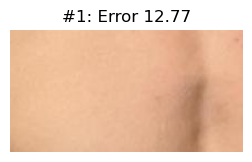

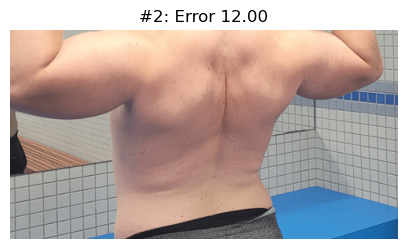

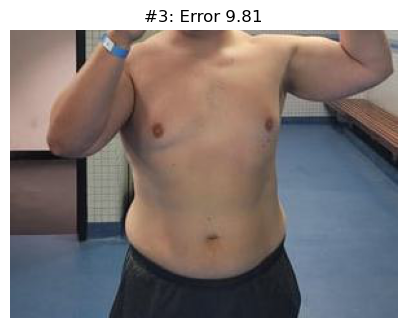

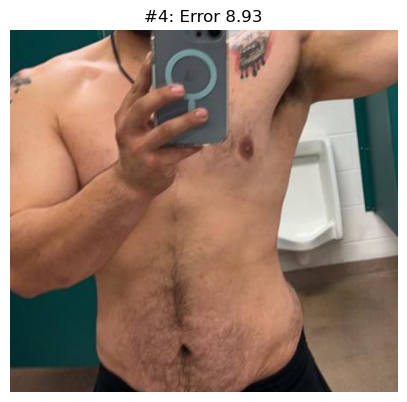

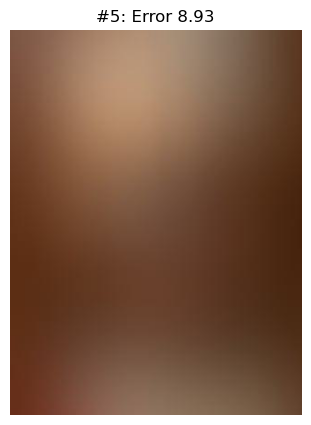

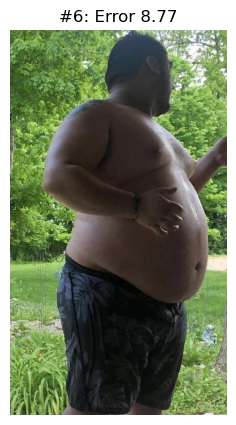

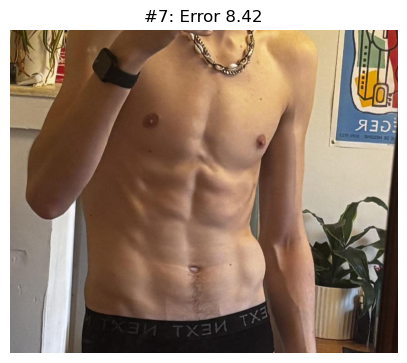

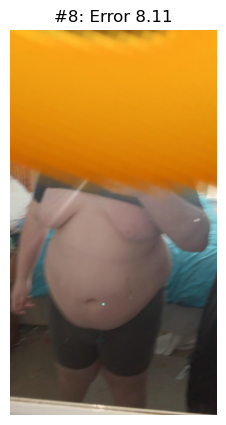

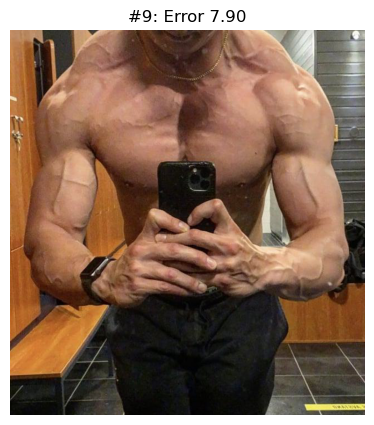

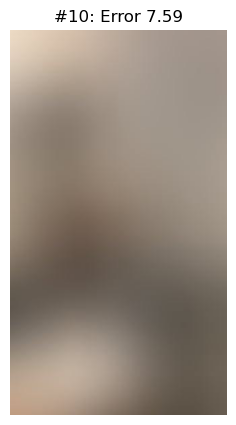

In [13]:
from fastai.vision.all import PILImage, show_image
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("data/image_labels.csv")

errors = []

pbar = tqdm(df.iterrows(), total=len(df), desc="Processing images", leave=True)

for i, row in pbar:
    try:
        img_path = f"images/{row['filename']}"  # change if your image path differs
        img = PILImage.create(img_path)
        probs = ensemble_predict(img_path)
        pred = float(probs[0])
        actual = float(row['target'])
        error = abs(pred - actual)

        errors.append({
            "img_path": img_path,
            "img": img,
            "actual": actual,
            "pred": pred,
            "error": error
        })

        # Optionally update progress bar postfix
        pbar.set_postfix({"last_error": f"{error:.2f}"})

    except Exception as e:
        pbar.write(f"Skipping {row['filename']} due to error: {e}")
        
# Sort and show top 10 worst predictions
top_errors = sorted(errors, key=lambda x: x['error'], reverse=True)[:10]

for idx, item in enumerate(top_errors):
    print(f"\n#{idx+1}")
    print(f"File: {item['img_path']}")
    print(f"Predicted: {item['pred']:.2f}")
    print(f"Actual: {item['actual']:.2f}")
    print(f"Error: {item['error']:.2f}")
    show_image(item['img'], title=f"#{idx+1}: Error {item['error']:.2f}")


In [14]:
import io
from ipywidgets import widgets, VBox, HBox
from IPython.display import display

def pil_to_bytes(img):
    buf = io.BytesIO()
    img.save(buf, format='PNG')
    return buf.getvalue()

rows = []
for idx, item in enumerate(top_errors):
    img_bytes = pil_to_bytes(item['img'])
    img_widget = widgets.Image(value=img_bytes, format='png', width=200, height=200)
    
    text_html = f"""
    <b>#{idx+1}</b><br>
    File: {item['img_path']}<br>
    Predicted: {item['pred']:.2f}<br>
    Actual: {item['actual']:.2f}<br>
    Error: {item['error']:.2f}
    """
    text_widget = widgets.HTML(value=text_html)
    
    row = HBox([img_widget, text_widget])
    rows.append(row)

display(VBox(rows))


In [17]:
import numpy as np

errors = [abs(d["error"]) for d in errors]
mae = np.mean(errors)

print("Mean Absolute Error:", mae)

Mean Absolute Error: 1.1492818405877976
